In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
!nvidia-smi

# Set up

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
import os
base_dir = "LM_Query_Complexity/"  # TODO: path to the repo directory e.g. /.../LM_Query_Complexity/
assert base_dir != "", "TODO: provide path to the repo directory"
os.chdir(base_dir)  # your directory
cwd = os.getcwd()
print(cwd)
!ls

In [ ]:
!pip install datasets==2.15.0
!pip install x_transformers==1.24.5
!pip install -U wandb

In [ ]:
# !wandb login

## Generate config

### default

In [ ]:
# data params
length = 32
max_depth = 12
num_types = 2
type_probs = [0.2, 0.8]
ood_eval_type_probs = list(reversed(type_probs))

num_train_sentences = 300000
num_dev_sentences = 10000

In [ ]:
# model params
dim = 512
layers = 6
heads = 8
batch_size = 32
lr = 3e-4
weight_decay = 0.1
warmup = 100


In [ ]:
config_file_paths = []

for k in [num_types]:  # number of bracket types
  for m in [max_depth]:  # max stack depth
    for hiddenlayers in [layers]:
        for num_heads in [heads]:
          for optimizer in ['Adam']:  # ['Adam', 'SGD']
            for lr in [lr]:
                probs_str = '_'.join([str(p) for p in type_probs])
                ood_probs_str = '_'.join([str(p) for p in ood_eval_type_probs])
                data_name = f'dyck_k{k}_{probs_str}_m{m}_len{length}'
                ood_data_name = f'dyck_k{k}_{ood_probs_str}_m{m}_len{length}'
                model_name = f"dim{dim}_depth{max_depth}_heads{heads}"
                train_name = f"batch{batch_size}_lr{lr}_wd{weight_decay}_warmup{warmup}"
                experiment_name = f"{data_name}/{model_name}/{train_name}"

                config_text = f"""
                corpus:
                    train_corpus_loc: data/{data_name}.train
                    dev_corpus_loc: data/{data_name}.dev
                    ood_eval_corpus_loc: data/{ood_data_name}.dev
                language:
                    name: {data_name}
                    bracket_types: {k}
                    type_probs: {probs_str}
                    train_length: {length}
                    train_max_stack_depth: {m}
                    train_sample_count: {num_train_sentences}
                    dev_length: {length}
                    dev_max_stack_depth: {m}
                    dev_sample_count: {num_dev_sentences}
                    ood_eval_length: {length}
                    ood_eval_max_stack_depth: {m}
                    ood_eval_type_probs: {ood_probs_str}
                    ood_eval_sample_count: {num_dev_sentences}
                lm:
                    lm_name: {model_name}
                    lm_type: x_transformers
                    dim: {dim}
                    num_layers: {hiddenlayers}
                    save_path: lm.params
                    num_heads: {heads}
                reporting:
                    reporting_loc: ./trained_models/{experiment_name}/
                    plot_attention_dir: ./plot_attention/{experiment_name}/
                    inspect_results_dir: ./inspect_results/{experiment_name}/
                    num_sentences_to_plot: 5
                    steps_between_evals: 100
                    log_all_steps_until: 0  # log all the first several steps to wandb
                training:
                    train_name: {train_name}
                    batch_size: {batch_size}
                    dropout: 0.0
                    optimizer: {optimizer}  # Adam or SGD
                    learning_rate: {lr}
                    warmup: {warmup}
                    weight_decay: {weight_decay}
                    num_iters: 0
                    seed: 0
                    objective: default  # default or contrastive or multi
                experiment:
                    repeat: 4  # number of times to re-train the model
                name: {experiment_name}
                """

                config_save_dir = os.path.join(
                    base_dir,
                    'config/',
                    data_name,
                    model_name,
                    train_name,
                )
                os.makedirs(config_save_dir, exist_ok=True)
                config_file_path = f"{config_save_dir}/config.yaml"
                with open(config_file_path, 'wt') as f:
                    f.write(config_text)

                config_file_paths.append(config_file_path)

# Train

In [ ]:
!cat src/run_lm.py

""" Trains/runs a language model on data available tokenized sentence-per-line format.

The main interface to running experiments with this codebase.

Usage:
      python rnns_stacks/run_lm.py <config.yaml>
"""

import torch
import yaml
import os
from tqdm import tqdm
import argparse
from argparse import ArgumentParser
import datasets
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.manifold import TSNE
import gc

import wandb
from distributions import get_vocab_size, RandomWalkDyck, get_transformer, nn_generate, nn_log_probs, nn_intermediates, dyck_acc 
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors, read_ood_eval_results
from plot_rep import plot_prefix_rep


def create_args(config_file):
    args = yaml.safe_load(open(config_file))
    # Determine whether CUDA is available
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    args['device'] = device
    return args


def load_

In [ ]:
# train
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --train --no-eval --no-plot_representations

# Generate try 1: nucleus sampling 0.9


In [ ]:
os.chdir(base_dir)

In [ ]:
!cat src/run_lm.py

""" Trains/runs a language model on data available tokenized sentence-per-line format.

The main interface to running experiments with this codebase.

Usage:
      python rnns_stacks/run_lm.py <config.yaml>
"""

import torch
import yaml
import os
from tqdm import tqdm
import argparse
from argparse import ArgumentParser
import datasets
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.manifold import TSNE
import gc

import wandb
from distributions import get_vocab_size, RandomWalkDyck, get_transformer, nn_generate, nn_log_probs, nn_intermediates, dyck_acc 
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors, read_ood_eval_results
from plot_rep import plot_prefix_rep


def create_args(config_file):
    args = yaml.safe_load(open(config_file))
    # Determine whether CUDA is available
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    args['device'] = device
    return args


def load_

In [ ]:
# final checkpoint
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final --top_p 0.9 --plot_representations

In [ ]:
import pickle

model_save_path = './trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/final.pkl'
with open(model_save_path, 'rb') as f:
    model = pickle.load(f)

In [ ]:
type(model)

x_transformers.x_transformers.TransformerWrapper

In [ ]:
model

TransformerWrapper(
  (token_emb): TokenEmbedding(
    (emb): Embedding(6, 512)
  )
  (pos_emb): AbsolutePositionalEmbedding(
    (emb): Embedding(1024, 512)
  )
  (post_emb_norm): Identity()
  (emb_dropout): Dropout(p=0.0, inplace=False)
  (project_emb): Identity()
  (attn_layers): Decoder(
    (layers): ModuleList(
      (0): ModuleList(
        (0): ModuleList(
          (0): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (1-2): 2 x None
        )
        (1): Attention(
          (to_q): Linear(in_features=512, out_features=512, bias=False)
          (to_k): Linear(in_features=512, out_features=512, bias=False)
          (to_v): Linear(in_features=512, out_features=512, bias=False)
          (attend): Attend(
            (attn_dropout): Dropout(p=0.0, inplace=False)
          )
          (to_out): Linear(in_features=512, out_features=512, bias=False)
        )
        (2): Residual()
      )
      (1): ModuleList(
        (0): ModuleList(
          (0): LayerNorm((

In [ ]:
# debug: redo plot representations
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --no-eval --no-random_model --best_or_final_checkpoint final --top_p 0.9 --plot_representations

In [ ]:
# ood eval
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final --ood_eval True --top_p 0.9 --plot_representations

In [ ]:
# load ood eval results
!python3 src/load_errors.py --config "{config_save_dir}/config.yaml" --best_or_final_checkpoint final --top_p 0.9

In [ ]:
!cat src/plot_rep.py

""" Trains/runs a language model on data available tokenized sentence-per-line format.

The main interface to running experiments with this codebase.

Usage:
      python rnns_stacks/run_lm.py <config.yaml>
"""

import torch
import yaml
import os
from tqdm import tqdm
import argparse
from argparse import ArgumentParser
import datasets
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.manifold import TSNE
import gc

import wandb
from distributions import get_vocab_size, RandomWalkDyck, get_transformer, nn_generate, nn_log_probs, nn_intermediates, dyck_acc 
from error_analysis import ErrorType, analyze_and_save_errors, analyze_and_save_ood_errors, read_ood_eval_results


def plot_prefix_rep(model, sequences, dyck, ds_tokens, save_dir, ood_results=None):
    os.makedirs(save_dir, exist_ok=True)

    print('sequences', sequences)  # debug
    prefixes = []
    for i, seq in enumerate(sequences):
        for j in range(len(seq['tokens'])):
   

In [ ]:
# debug: plot ood prefix representations
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final --top_p 0.9 --ood_eval True --plot_representations

# Generate try 2: nucleus sampling 1.0


In [ ]:
os.chdir(base_dir)

In [ ]:
!cat src/run_lm.py

""" Trains/runs a language model on data available tokenized sentence-per-line format.

The main interface to running experiments with this codebase.

Usage:
      python rnns_stacks/run_lm.py <config.yaml>
"""

import torch
import yaml
import os
from tqdm import tqdm
import argparse
from argparse import ArgumentParser
import datasets
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.manifold import TSNE
import gc

import wandb
from distributions import get_vocab_size, RandomWalkDyck, get_transformer, nn_generate, nn_log_probs, nn_intermediates, dyck_acc 
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors, read_ood_eval_results
from plot_rep import plot_prefix_rep


def create_args(config_file):
    args = yaml.safe_load(open(config_file))
    # Determine whether CUDA is available
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    args['device'] = device
    return args


def load_

In [ ]:
!cat src/distributions.py

# Dyck distribution learning and sampling

import numpy as np
import torch
from tqdm import tqdm
import datasets


LARGE_NEGATIVE_FOR_LOG_PROB = -100.0


def get_vocab_size(num_types):
    return 2 * num_types + 2


class RandomWalkDyck: # Dyck language data generator with likelihoods
    def __init__(self, config={}):
        self.length = config['length']
        self.num_types = config.get('num_types') or 2
        self.max_depth = config.get('max_depth')
        self.np_rng = np.random.default_rng(config.get('seed')) # determinism
        # Allow for unequal opening bracket probabilities, default to equal
        self.type_probs = config.get('type_probs', np.ones(self.num_types)/self.num_types)
        self.vocab_size = get_vocab_size(self.num_types)
        self.bos = 2*self.num_types
        self.eos = 2*self.num_types+1
        self.tokens = list('([{<'[:self.num_types]) + list(')]}>'[:self.num_types]) + ['B', 'E']
        self.vocab = dict(zip(self.tokens, range(self.vocab_size

In [ ]:
# final ema checkpoint
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final_ema --top_p 1.0 --plot_representations

In [ ]:
# ood eval
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final_ema --ood_eval True --top_p 1.0 --plot_representations

In [ ]:
# load ood eval results
!python3 src/load_errors.py --config "{config_save_dir}/config.yaml" --best_or_final_checkpoint final_ema --top_p 1.0

In [ ]:
!cat src/distributions.py

# Dyck distribution learning and sampling

import numpy as np
import torch
from tqdm import tqdm
import datasets


LARGE_NEGATIVE_FOR_LOG_PROB = -100.0


def get_vocab_size(num_types):
    return 2 * num_types + 2


class RandomWalkDyck: # Dyck language data generator with likelihoods
    def __init__(self, config={}):
        self.length = config['length']
        self.num_types = config.get('num_types') or 2
        self.max_depth = config.get('max_depth')
        self.np_rng = np.random.default_rng(config.get('seed')) # determinism
        # Allow for unequal opening bracket probabilities, default to equal
        self.type_probs = config.get('type_probs', np.ones(self.num_types)/self.num_types)
        self.vocab_size = get_vocab_size(self.num_types)
        self.bos = 2*self.num_types
        self.eos = 2*self.num_types+1
        self.tokens = list('([{<'[:self.num_types]) + list(')]}>'[:self.num_types]) + ['B', 'E']
        self.vocab = dict(zip(self.tokens, range(self.vocab_size

In [ ]:
!cat src/plot_rep.py

[autoreload of plot_rep failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/usr/lib/python3.10/imp.py", line 315, in reload
    return importlib.reload(module)
  File "/usr/lib/python3.10/importlib/__init__.py", line 168, in reload
    raise ModuleNotFoundError(f"spec not found for the module {name!r}", name=name)
ModuleNotFoundError: spec not found for the module 'plot_rep'
]


""" Trains/runs a language model on data available tokenized sentence-per-line format.

The main interface to running experiments with this codebase.

Usage:
      python rnns_stacks/run_lm.py <config.yaml>
"""

import torch
import yaml
import os
from tqdm import tqdm
import argparse
from argparse import ArgumentParser
import datasets
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.manifold import TSNE
import gc

import wandb
from distributions import get_vocab_size, RandomWalkDyck, get_transformer, nn_generate, nn_log_probs, nn_intermediates, dyck_acc 
from error_analysis import ErrorType, analyze_and_save_errors, analyze_and_save_ood_errors, read_ood_eval_results


def plot_prefix_rep(model, sequences, dyck, ds_tokens, save_dir, ood_results=None):
    os.makedirs(save_dir, exist_ok=True)

    # print('sequences', sequences)  # debug
    prefixes = []
    for i, seq in enumerate(sequences):
        for j in range(len(seq['tokens'])):
 

In [ ]:
# debug: plot ood prefix representations
!python3 src/run_lm.py --config "{config_save_dir}/config.yaml" --no-train --eval --no-random_model --best_or_final_checkpoint final --top_p 1.0 --ood_eval True --plot_representations

# Manual check

In [ ]:
os.chdir("src/")

In [ ]:
from run_lm import create_args

def fix_args_directory(args):
  for k in args['corpus']:
    args['corpus'][k] = '../' + args['corpus'][k]

  args['reporting']['reporting_loc'] = '.' + args['reporting']['reporting_loc']


## Full pipeline

In [ ]:
import pickle


config_file_path = config_file_paths[0]
experiment_index = 0  # 0  3

args = create_args(config_file_path)
fix_args_directory(args)

model_save_dir = args['reporting']['reporting_loc'] + str(experiment_index)
best_or_final_checkpoint = 'final'  # 'final'  'final_ema'
model_save_path = os.path.join(model_save_dir, f'{best_or_final_checkpoint}.pkl')

with open(model_save_path, 'rb') as f:
    model = pickle.load(f)

top_p = 0.9  # 1.0
eval_dir = os.path.join(model_save_dir, f'generated_{best_or_final_checkpoint}_p{top_p}/')


In [ ]:
from run_lm import load_dataset


train_loader, dyck_train, ds_train = load_dataset(
        {
            'length': args['language']['train_length'],
            'max_depth': args['language']['train_max_stack_depth'],
            'num_types': args['language']['bracket_types'],
            'type_probs': [float(p) for p in args['language']['type_probs'].split('_')],
        },
        args['corpus']['train_corpus_loc'],
        args['language']['train_sample_count'],
        args['training']['batch_size'],
    )

eval_loader, dyck_eval, ds_eval = load_dataset(
    {
        'length': args['language']['dev_length'],
        'max_depth': args['language']['dev_max_stack_depth'],
        'num_types': args['language']['bracket_types'],
        'type_probs': [float(p) for p in args['language']['type_probs'].split('_')],
    },
    args['corpus']['dev_corpus_loc'],
    args['language']['dev_sample_count'],
    args['training']['batch_size'],
)

In [ ]:
from run_lm import generate_sequences
from distributions import nn_log_probs


generated_data_path = os.path.join(eval_dir, f'generated_p{top_p}.pkl')
ds_generated, sequences = generate_sequences(
    generated_data_path,
    dyck_train,
    model,
    args,
    top_p,
)

Loading ds_generated from ../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/generated_final_p0.9/generated_p0.9.pkl
len(sequences) 10000
sequences[0] {'tokens': [4, 1, 3, 1, 3, 1, 3, 1, 3, 1, 1, 1, 3, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 2, 1, 3, 1, 3, 1, 3, 1, 3, 5], 'log_prob_truncated': -16.626231268048286}


In [ ]:
illegal_seqs = []

for i, seq in enumerate(sequences):
    if not dyck_eval.accept(seq['tokens']):
        print(
            dyck_eval.detokenize(seq['tokens']),
            nn_log_probs(model, [seq['tokens']], batch_size=1),
            dyck_eval.compute_log_prob(seq['tokens']),
        )
        illegal_seqs.append(seq['tokens'])
print('Number of invalid sequences: ', len(illegal_seqs))

Number of invalid sequences:  0


In [ ]:
print(args['corpus']['ood_eval_corpus_loc'].replace('.dev', 'new.dev'))

../data/dyck_k2_0.8_0.2_m12_len32new.dev


In [ ]:
from run_lm import load_dataset

ood_eval_loader, dyck_ood_eval, ds_ood_eval = load_dataset(
    {
        'length': args['language']['ood_eval_length'],
        'max_depth': args['language']['ood_eval_max_stack_depth'],
        'num_types': args['language']['bracket_types'],
        'type_probs': [float(p) for p in args['language']['ood_eval_type_probs'].split('_')],
    },
    args['corpus']['ood_eval_corpus_loc'].replace('.dev', 'new.dev'),
    args['language']['ood_eval_sample_count'],
    args['training']['batch_size'],
)

ood_sequences = ds_ood_eval.to_list()

Loading ds from ../data/dyck_k2_0.8_0.2_m12_len32new.dev


## Error analysis

### Complete ood errors using standard generation algo

In [ ]:
!cat error_analysis.py

import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from enum import Enum
import os
import collections
import matplotlib.pyplot as plt
from distributions import conditional_nn_generate

plt.style.use('tableau-colorblind10')

ErrorType = Enum('ErrorType', ['START_INCORRECT', 
                               'END_INCORRECT', 
                               'MAX_STACK_DEPTH_EXCEEDED', 
                               'STACK_DEPTH_EXCEEDS_REMAINING_LENGTH', 
                               'STACK_UNDERFLOW',
                               'INCORRECT_CLOSING_BRACKET' ])

# analyze an invalid sequence
def analyze_error(dyck, model, seq, backtrack_quota=None):
    stack = []
    has_seen_bos = False

    error = None

    preds = model(torch.tensor([seq]).cuda())
    preds = torch.softmax(preds, dim=-1)

    for i, x in enumerate(seq):
        if x == dyck.bos:
            if not has_seen_bos:
                has_seen_bos = True
                continue
            else:
  

In [ ]:
eval_dir

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/generated_final_p0.9/'

In [ ]:
os.path.join(eval_dir, f'ood_generation_errors/argmax_length_0')

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/generated_final_p0.9/ood_generation_errors/argmax_length_0'

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 17.26it/s]


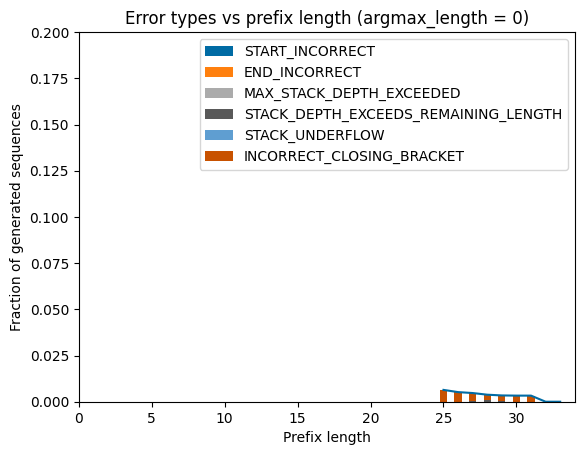

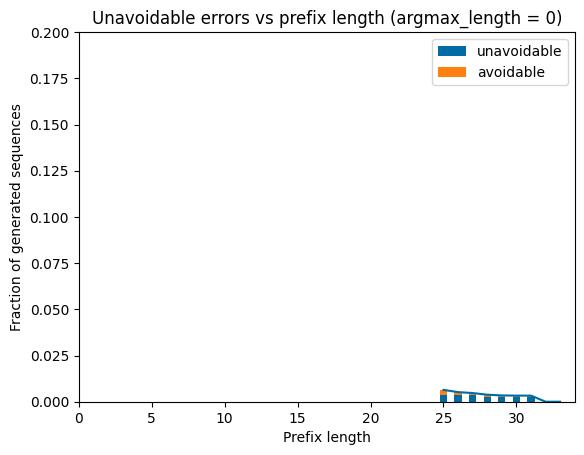

In [ ]:
import torch
from error_analysis import analyze_and_save_ood_errors

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
    )

### load results

In [ ]:
from error_analysis import read_ood_eval_results

def load_ood_results(config_file_path, experiment_index, top_p, best_or_final_checkpoint='final', ood_eval_dir='ood_generation_errors'):
    args = create_args(config_file_path)
    fix_args_directory(args)

    model_save_dir = args['reporting']['reporting_loc'] + str(experiment_index)
    print(model_save_dir)

    model_save_path = os.path.join(model_save_dir, f'{best_or_final_checkpoint}.pkl')
    eval_dir = os.path.join(model_save_dir, f'generated_{best_or_final_checkpoint}_p{top_p}/')

    assert os.path.exists(eval_dir)

    ood_results = read_ood_eval_results(eval_dir, ood_eval_dir=ood_eval_dir)

    return ood_results

#### old (more data, better for training)

In [ ]:
experiment_index = 0
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted([
    k for k in ood_results.keys()
    if len(ood_results[k]) > 10
])

[9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31]

In [ ]:
ood_results[5]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob
0,INCORRECT_CLOSING_BRACKET,<bos>((((([[][][][][]][[][]][[]],],0.618970,],0.618970
1,INCORRECT_CLOSING_BRACKET,<bos>((((([][[[][[]]]][[][][][]],],0.160916,),0.838724


In [ ]:
len(ood_results[31])

30

In [ ]:
ood_results[31]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob
0,INCORRECT_CLOSING_BRACKET,<bos>(((([(([([])()]))]())))([]()()),],0.998425,],0.998425
1,INCORRECT_CLOSING_BRACKET,<bos>([()](((((()))((()()())))()))(),],0.901742,],0.901742
2,INCORRECT_CLOSING_BRACKET,<bos>(()((()[])(()))()((())())(())(),],0.684749,],0.684749
3,INCORRECT_CLOSING_BRACKET,<bos>(((())()(()))(()(())()((()()))),],0.699475,],0.699475
4,INCORRECT_CLOSING_BRACKET,<bos>(([[((([])()()))](())])(()())(),],0.994803,],0.994803
5,INCORRECT_CLOSING_BRACKET,<bos>(()()(()(()(()(()()())(()))))(),],0.987031,],0.987031
6,INCORRECT_CLOSING_BRACKET,<bos>(()[((()((()()))())[])](([]())),],0.869621,],0.869621
7,INCORRECT_CLOSING_BRACKET,<bos>(()(()((()()()())(())))[]()(()),],0.782469,],0.782469
8,INCORRECT_CLOSING_BRACKET,<bos>((((())))((()(()))(((()())()))),],0.376797,),0.595215
9,INCORRECT_CLOSING_BRACKET,<bos>[]((((([][()])()(())))))()[]((),],0.802163,],0.802163


#### new

In [ ]:
experiment_index = 0
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                               ood_eval_dir='ood_generation_errors/argmax_length_0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted([
    k for k in ood_results.keys()
    if len(ood_results[k]) > 10
])

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
len(ood_results[31])

33

In [ ]:
ood_results[31]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob
0,INCORRECT_CLOSING_BRACKET,B(((([(([([])()]))]())))([]()()),],0.998425,],0.998425
1,INCORRECT_CLOSING_BRACKET,B([()](((((()))((()()())))()))(),],0.901743,],0.901743
2,INCORRECT_CLOSING_BRACKET,B([()((([(())]))())()(()()())](),],0.285346,),0.711239
3,INCORRECT_CLOSING_BRACKET,B(()((()[])(()))()((())())(())(),],0.684750,],0.684750
4,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475
5,INCORRECT_CLOSING_BRACKET,B(([[((([])()()))](())])(()())(),],0.994803,],0.994803
6,INCORRECT_CLOSING_BRACKET,B(()()(()(()(()(()()())(()))))(),],0.987031,],0.987031
7,INCORRECT_CLOSING_BRACKET,B(()[((()((()()))())[])](([]())),],0.869623,],0.869623
8,INCORRECT_CLOSING_BRACKET,B(()(()((()()()())(())))[]()(()),],0.782469,],0.782469
9,INCORRECT_CLOSING_BRACKET,B([(((())(()())())()[][])()](()),],0.286563,),0.705641


## Training models to predict error (just mistake prefixes and OOD prefixes with matching lengths)

### Data

In [ ]:
error_inducing_prefixes = []

for key in ood_results:
    for i in range(len(ood_results[key]['prefix'])):
        prefix_ids = dyck_ood_eval.tokenize(ood_results[key]['prefix'][i])
        error_inducing_prefixes.append(prefix_ids)

In [ ]:
len(error_inducing_prefixes)

577

In [ ]:
from distributions import conditional_nn_generate

mistake_prefixes = []
for repeat_idx in range(3):
    for error_inducing_prefix in error_inducing_prefixes:
        output = conditional_nn_generate(
            dyck_ood_eval,
            model,
            [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
            batch_size=32,
            top_p=0.9,
            argmax_length=0,
        )
        first_err_pos = dyck_ood_eval.return_1st_err_pos(output[0]['tokens'])
        if first_err_pos != -1:
            mistake_prefix = output[0]['tokens'][:first_err_pos+1]
            if mistake_prefix not in mistake_prefixes:
                mistake_prefixes.append(mistake_prefix)
                print(f"mistake occurred in repeat {repeat_idx}, position {first_err_pos+1-len(error_inducing_prefix)} after error_inducing_prefix")

Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 31.95it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.21it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.97it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]


mistake occurred in repeat 0, position 10 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.79it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]

mistake occurred in repeat 0, position 1 after error_inducing_prefix



Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 33.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.05it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 34.22it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.01it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 39.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 25.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 46.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 34.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 37.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 36.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 37.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 48.05it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 41.72it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 35.13it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 46.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.76it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 46.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 48.35it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 42.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 28.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 31.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 30.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.31it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.92it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.24it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.02it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.42it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.21it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 37.97it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 34.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.50it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.97it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 25.84it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]


mistake occurred in repeat 0, position 12 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.35it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.13it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.00it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


mistake occurred in repeat 0, position 16 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.63it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.49it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]


mistake occurred in repeat 0, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.96it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.02it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 28.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.97it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.02it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.26it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.31it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.34it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.95it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.62it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 27.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.31it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]


mistake occurred in repeat 0, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 40.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.21it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.42it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.68it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.86it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.12it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.21it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.88it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.62it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.73it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 29.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.13it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.02it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.23it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


mistake occurred in repeat 1, position 11 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 28.94it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.19it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.88it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.22it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.60it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.32it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.57it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.14it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.85it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.14it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


mistake occurred in repeat 1, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.46it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.50it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.71it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.05it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.17it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.49it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.06it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.63it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.02it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.59it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.25it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.88it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.92it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.19it/s]


mistake occurred in repeat 2, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.81it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.44it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.96it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 38.83it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.46it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]


mistake occurred in repeat 2, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]


mistake occurred in repeat 2, position 10 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


mistake occurred in repeat 2, position 8 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


mistake occurred in repeat 2, position 8 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]


mistake occurred in repeat 2, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.49it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]


mistake occurred in repeat 2, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.05it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.01it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.53it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.75it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.39it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.53it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.21it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.38it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.35it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 27.05it/s]


In [ ]:
len(mistake_prefixes)

441

In [ ]:
import torch

from distributions import nn_intermediates

mistake_prefix_reps = [
    nn_intermediates(
        model,
        torch.tensor([mistake_prefix]),
        batch_size=1,
        positions='last',
    )
    for mistake_prefix in mistake_prefixes
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0]), len(mistake_prefix_reps[0][0])

(441, 1, 512)

In [ ]:
mistake_prefix_reps = [
    rep[0]
    for rep in mistake_prefix_reps
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0])

(441, 512)

In [ ]:
len(ood_sequences)

10000

In [ ]:
ood_sequences_subset = []
for i, mistake_prefix in enumerate(mistake_prefixes):
    ood_sequences_subset.append(
        ood_sequences[i]['tokens'][:len(mistake_prefix)]
    )

In [ ]:
ood_sequences_subset_reps = [
    nn_intermediates(
        model,
        torch.tensor([ood_sequences_prefix]),
        batch_size=1,
        positions='last',
    )
    for ood_sequences_prefix in ood_sequences_subset
]

In [ ]:
len(ood_sequences_subset_reps), len(ood_sequences_subset_reps[0]), len(ood_sequences_subset_reps[0][0])

(441, 1, 512)

In [ ]:
ood_sequences_subset_reps = [
    rep[0]
    for rep in ood_sequences_subset_reps
]

In [ ]:
len(ood_sequences_subset_reps), len(ood_sequences_subset_reps[0])

(441, 512)

### Visualize rep

In [ ]:
import numpy as np


# all_intermediates = np.array(mistake_prefix_reps + non_error_but_shorter1_reps + non_error_but_longer1_reps + ood_sequences_subset_reps)
all_intermediates = np.array(mistake_prefix_reps + ood_sequences_subset_reps)
all_intermediates.shape

(918, 512)

In [ ]:
from sklearn.manifold import TSNE


X_embedded = TSNE(perplexity=30.0, random_state=0).fit_transform(all_intermediates)
print('X_embedded.shape', X_embedded.shape)


X_embedded.shape (918, 2)


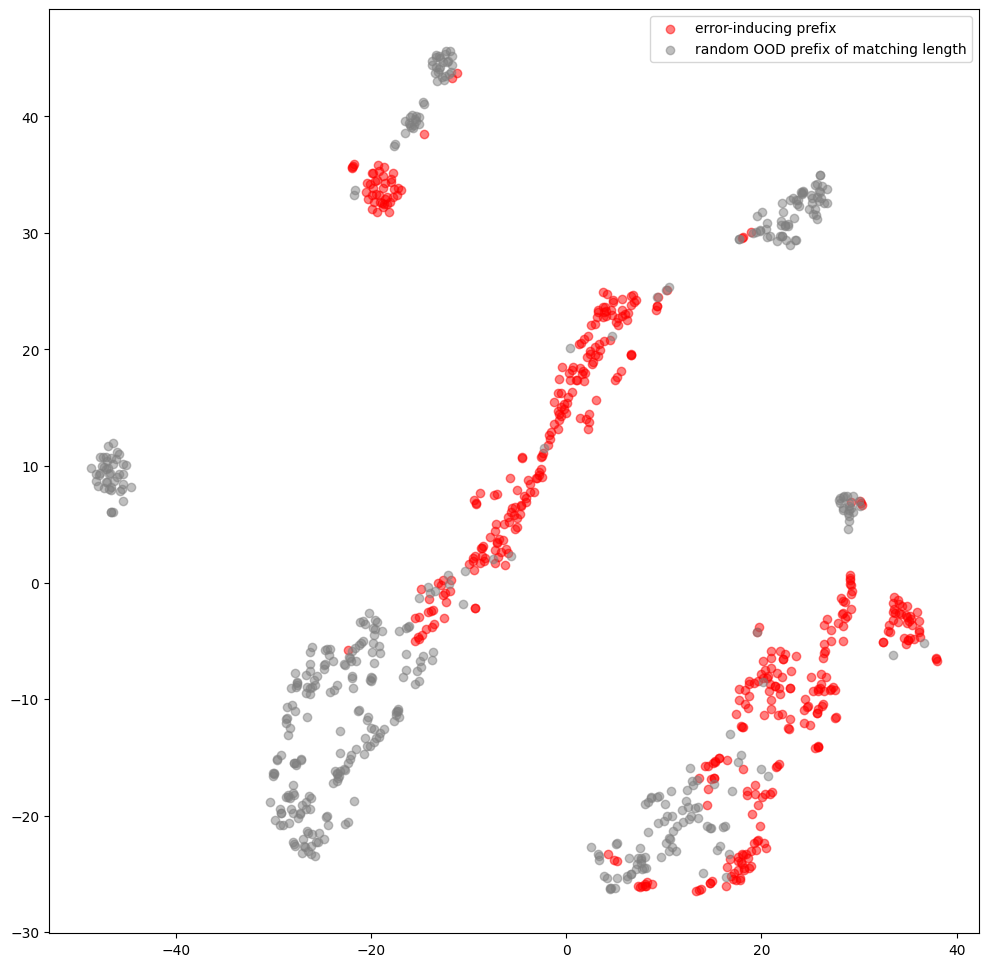

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 12))
plt.scatter(
    x=X_embedded[:len(mistake_prefix_reps), 0],
    y=X_embedded[:len(mistake_prefix_reps), 1],
    color='red',
    alpha=0.5,
    label='error-inducing prefix',
)
# plt.scatter(
#     x=X_embedded[len(error_inducing_prefix_reps):len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps), 0],
#     y=X_embedded[len(error_inducing_prefix_reps):len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps), 1],
#     color='blue',
#     alpha=0.5,
#     label='non-error-inducing, remove last token',
# )
# plt.scatter(
#     x=X_embedded[len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps):len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps)+len(non_error_but_longer1_reps), 0],
#     y=X_embedded[len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps):len(error_inducing_prefix_reps)+len(non_error_but_shorter1_reps)+len(non_error_but_longer1_reps), 1],
#     color='green',
#     alpha=0.5,
#     label='non-error-inducing, append extra token',
# )
plt.scatter(
    x=X_embedded[-len(ood_sequences_subset_reps):, 0],
    y=X_embedded[-len(ood_sequences_subset_reps):, 1],
    color='grey',
    alpha=0.5,
    label='random OOD prefix of matching length',
)
plt.legend()
plt.show()

### Train model

In [ ]:
train_proportion = 0.9
train_idx_ends_positive = int(len(mistake_prefix_reps) * train_proportion)
# train_idx_ends_shorter1_negative = int(len(non_error_but_shorter1_reps) * train_proportion)
# train_idx_ends_longer1_negative = int(len(non_error_but_longer1_reps) * train_proportion)
train_idx_ends_ood_negative = int(len(ood_sequences_subset_reps) * train_proportion)

In [ ]:
train_data = [
    [1] + rep
    for rep in mistake_prefix_reps[:train_idx_ends_positive]
] + [
#     [0] + rep
#     for rep in non_error_but_shorter1_reps[:train_idx_ends_shorter1_negative]
# ] + [
#     [0] + rep
#     for rep in non_error_but_longer1_reps[:train_idx_ends_longer1_negative]
# ] + [
    [0] + rep
    for rep in ood_sequences_subset_reps[:train_idx_ends_ood_negative]
]

test_data = [
    [1] + rep
    for rep in mistake_prefix_reps[train_idx_ends_positive:]
] + [
#     [0] + rep
#     for rep in non_error_but_shorter1_reps[train_idx_ends_shorter1_negative:]
# ] + [
#     [0] + rep
#     for rep in non_error_but_longer1_reps[train_idx_ends_longer1_negative:]
# ] + [
    [0] + rep
    for rep in ood_sequences_subset_reps[train_idx_ends_ood_negative:]
]

len(train_data), len(test_data)

(792, 90)

In [ ]:
train_data = torch.tensor(train_data)
test_data = torch.tensor(test_data)

print(train_data.shape, test_data.shape)

torch.Size([792, 513]) torch.Size([90, 513])


In [ ]:
from torch.utils.data import Dataset, DataLoader

class TrainDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, ind):
        x = self.data[ind][1:]
        y = self.data[ind][0]
        return x, y

# class TestDataset(TrainDataset):
#     def __getitem__(self, ind):
#         x = self.data[ind]
#         return x

train_set = TrainDataset(train_data)
test_set  = TrainDataset(test_data)

batch_size = 32
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_set,  batch_size=batch_size, shuffle=False)

In [ ]:
import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.linear = nn.Linear(512, 2)
    def forward(self, x):
        out = self.linear(x)
        return out

model_err_pred = MLP().to(device)

criterion = nn.CrossEntropyLoss()

In [ ]:
def test(model_err_pred, test_loader, criterion, device):
    model_err_pred.eval()
    all_ys = torch.tensor([]).to(device)
    all_preds = torch.tensor([]).to(device)

    with torch.no_grad():
        for batch_num, input_data in enumerate(test_loader):
            x, y = input_data
            x = x.to(device).float()
            y = y.type(torch.LongTensor).to(device)

            output = model_err_pred(x)
            loss = criterion(output, y)
            losses.append(loss.item())

            pred = output.argmax(dim=-1)

            all_ys = torch.concat([all_ys, y.detach()])
            all_preds = torch.concat([all_preds, pred.detach()])

    print('Test Loss %6.2f | test acc %.2f' % (sum(losses)/len(losses), sum(all_preds == all_ys) / len(all_ys)))

In [ ]:
# run 1

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   2.60 | train acc 0.34
	Epoch 0 | Batch 10 | Loss   0.81 | train acc 0.69
	Epoch 0 | Batch 20 | Loss   0.72 | train acc 0.75
Epoch 0 | Loss   1.06 | train acc 0.73
Test Loss   0.99 | test acc 0.88
	Epoch 1 | Batch 0 | Loss   0.97 | train acc 0.69
	Epoch 1 | Batch 10 | Loss   0.25 | train acc 0.94
	Epoch 1 | Batch 20 | Loss   0.51 | train acc 0.78
Epoch 1 | Loss   0.50 | train acc 0.81
Test Loss   0.46 | test acc 0.92
	Epoch 2 | Batch 0 | Loss   0.65 | train acc 0.75
	Epoch 2 | Batch 10 | Loss   0.23 | train acc 0.88
	Epoch 2 | Batch 20 | Loss   0.18 | train acc 0.91
Epoch 2 | Loss   0.35 | train acc 0.92
Test Loss   0.33 | test acc 0.97
	Epoch 3 | Batch 0 | Loss   0.18 | train acc 0.91
	Epoch 3 | Batch 10 | Loss   0.14 | train acc 0.97
	Epoch 3 | Batch 20 | Loss   0.24 | train acc 0.91
Epoch 3 | Loss   0.26 | train acc 1.00
Test Loss   0.26 | test acc 0.90
	Epoch 4 | Batch 0 | Loss   0.42 | train acc 0.81
	Epoch 4 | Batch 10 | Loss   0.41 | train acc 0.81
	Ep

In [ ]:
# run 2

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.42 | train acc 0.94
	Epoch 0 | Batch 10 | Loss   0.25 | train acc 0.88
	Epoch 0 | Batch 20 | Loss   0.24 | train acc 0.88
Epoch 0 | Loss   0.41 | train acc 0.92
Test Loss   0.38 | test acc 0.98
	Epoch 1 | Batch 0 | Loss   0.34 | train acc 0.91
	Epoch 1 | Batch 10 | Loss   0.09 | train acc 0.94
	Epoch 1 | Batch 20 | Loss   0.19 | train acc 0.94
Epoch 1 | Loss   0.31 | train acc 0.79
Test Loss   0.30 | test acc 0.98
	Epoch 2 | Batch 0 | Loss   0.22 | train acc 0.91
	Epoch 2 | Batch 10 | Loss   0.13 | train acc 0.94
	Epoch 2 | Batch 20 | Loss   0.03 | train acc 1.00
Epoch 2 | Loss   0.20 | train acc 0.96
Test Loss   0.20 | test acc 0.96
	Epoch 3 | Batch 0 | Loss   0.03 | train acc 1.00
	Epoch 3 | Batch 10 | Loss   0.21 | train acc 0.91
	Epoch 3 | Batch 20 | Loss   0.04 | train acc 1.00
Epoch 3 | Loss   0.25 | train acc 0.92
Test Loss   0.24 | test acc 0.97
	Epoch 4 | Batch 0 | Loss   0.03 | train acc 1.00
	Epoch 4 | Batch 10 | Loss   0.08 | train acc 0.97
	Ep

In [ ]:
# run 3

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.10 | train acc 0.97
	Epoch 0 | Batch 10 | Loss   0.50 | train acc 0.91
	Epoch 0 | Batch 20 | Loss   0.06 | train acc 1.00
Epoch 0 | Loss   0.29 | train acc 0.88
Test Loss   0.29 | test acc 0.91
	Epoch 1 | Batch 0 | Loss   0.25 | train acc 0.88
	Epoch 1 | Batch 10 | Loss   0.11 | train acc 0.91
	Epoch 1 | Batch 20 | Loss   0.07 | train acc 0.97
Epoch 1 | Loss   0.17 | train acc 1.00
Test Loss   0.17 | test acc 0.97
	Epoch 2 | Batch 0 | Loss   0.13 | train acc 0.94
	Epoch 2 | Batch 10 | Loss   0.56 | train acc 0.75
	Epoch 2 | Batch 20 | Loss   0.66 | train acc 0.81
Epoch 2 | Loss   0.32 | train acc 0.94
Test Loss   0.33 | test acc 0.90
	Epoch 3 | Batch 0 | Loss   0.89 | train acc 0.78
	Epoch 3 | Batch 10 | Loss   0.05 | train acc 0.97
	Epoch 3 | Batch 20 | Loss   0.19 | train acc 0.88
Epoch 3 | Loss   0.36 | train acc 1.00
Test Loss   0.34 | test acc 0.96
	Epoch 4 | Batch 0 | Loss   0.74 | train acc 0.88
	Epoch 4 | Batch 10 | Loss   0.49 | train acc 0.88
	Ep

In [ ]:
# run 4

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   2.18 | train acc 0.69
	Epoch 0 | Batch 10 | Loss   0.83 | train acc 0.72
	Epoch 0 | Batch 20 | Loss   0.71 | train acc 0.78
Epoch 0 | Loss   1.04 | train acc 0.72
Test Loss   0.98 | test acc 0.86
	Epoch 1 | Batch 0 | Loss   0.56 | train acc 0.78
	Epoch 1 | Batch 10 | Loss   0.42 | train acc 0.84
	Epoch 1 | Batch 20 | Loss   0.97 | train acc 0.78
Epoch 1 | Loss   0.51 | train acc 0.83
Test Loss   0.48 | test acc 0.92
	Epoch 2 | Batch 0 | Loss   0.26 | train acc 0.91
	Epoch 2 | Batch 10 | Loss   0.38 | train acc 0.88
	Epoch 2 | Batch 20 | Loss   0.29 | train acc 0.91
Epoch 2 | Loss   0.35 | train acc 0.94
Test Loss   0.33 | test acc 0.91
	Epoch 3 | Batch 0 | Loss   0.19 | train acc 0.94
	Epoch 3 | Batch 10 | Loss   0.36 | train acc 0.91
	Epoch 3 | Batch 20 | Loss   0.31 | train acc 0.81
Epoch 3 | Loss   0.29 | train acc 1.00
Test Loss   0.28 | test acc 0.93
	Epoch 4 | Batch 0 | Loss   0.26 | train acc 0.88
	Epoch 4 | Batch 10 | Loss   0.35 | train acc 0.84
	Ep

In [ ]:
# run 5

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   5.76 | train acc 0.41
	Epoch 0 | Batch 10 | Loss   1.25 | train acc 0.62
	Epoch 0 | Batch 20 | Loss   0.86 | train acc 0.75
Epoch 0 | Loss   1.37 | train acc 0.88
Test Loss   1.25 | test acc 0.93
	Epoch 1 | Batch 0 | Loss   0.37 | train acc 0.78
	Epoch 1 | Batch 10 | Loss   0.30 | train acc 0.84
	Epoch 1 | Batch 20 | Loss   0.77 | train acc 0.72
Epoch 1 | Loss   0.48 | train acc 0.75
Test Loss   0.46 | test acc 0.88
	Epoch 2 | Batch 0 | Loss   0.41 | train acc 0.78
	Epoch 2 | Batch 10 | Loss   0.11 | train acc 0.94
	Epoch 2 | Batch 20 | Loss   0.33 | train acc 0.84
Epoch 2 | Loss   0.37 | train acc 0.62
Test Loss   0.35 | test acc 0.98
	Epoch 3 | Batch 0 | Loss   0.54 | train acc 0.78
	Epoch 3 | Batch 10 | Loss   0.11 | train acc 1.00
	Epoch 3 | Batch 20 | Loss   0.59 | train acc 0.88
Epoch 3 | Loss   0.26 | train acc 0.88
Test Loss   0.25 | test acc 0.94
	Epoch 4 | Batch 0 | Loss   0.19 | train acc 0.91
	Epoch 4 | Batch 10 | Loss   0.16 | train acc 0.88
	Ep

In [ ]:
# run 6

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.43 | train acc 0.88
Epoch 0 | Loss   0.95 | train acc 0.50
Test Loss   0.98 | test acc 0.79
	Epoch 1 | Batch 0 | Loss   0.68 | train acc 0.84
Epoch 1 | Loss   0.47 | train acc 0.95
Test Loss   0.50 | test acc 0.86
	Epoch 2 | Batch 0 | Loss   0.28 | train acc 0.91
Epoch 2 | Loss   0.28 | train acc 0.95
Test Loss   0.32 | test acc 0.86
	Epoch 3 | Batch 0 | Loss   0.35 | train acc 0.91
Epoch 3 | Loss   0.23 | train acc 1.00
Test Loss   0.23 | test acc 0.93
	Epoch 4 | Batch 0 | Loss   0.26 | train acc 0.91
Epoch 4 | Loss   0.20 | train acc 0.82
Test Loss   0.24 | test acc 0.82
	Epoch 5 | Batch 0 | Loss   0.47 | train acc 0.75
Epoch 5 | Loss   0.25 | train acc 0.91
Test Loss   0.25 | test acc 0.93
	Epoch 6 | Batch 0 | Loss   0.26 | train acc 0.88
Epoch 6 | Loss   0.22 | train acc 0.91
Test Loss   0.22 | test acc 0.89
	Epoch 7 | Batch 0 | Loss   0.05 | train acc 1.00
Epoch 7 | Loss   0.18 | train acc 0.91
Test Loss   0.20 | test acc 0.89
	Epoch 8 | Batch 0 | Los

In [ ]:
# run 7

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.41 | train acc 0.84
Epoch 0 | Loss   0.74 | train acc 0.75
Test Loss   0.73 | test acc 0.71
	Epoch 1 | Batch 0 | Loss   0.15 | train acc 0.94
Epoch 1 | Loss   0.35 | train acc 0.92
Test Loss   0.37 | test acc 0.86
	Epoch 2 | Batch 0 | Loss   0.06 | train acc 0.97
Epoch 2 | Loss   0.16 | train acc 0.92
Test Loss   0.26 | test acc 0.68
	Epoch 3 | Batch 0 | Loss   0.18 | train acc 0.91
Epoch 3 | Loss   0.17 | train acc 0.96
Test Loss   0.19 | test acc 0.89
	Epoch 4 | Batch 0 | Loss   0.17 | train acc 0.94
Epoch 4 | Loss   0.15 | train acc 0.92
Test Loss   0.17 | test acc 0.82
	Epoch 5 | Batch 0 | Loss   0.31 | train acc 0.94
Epoch 5 | Loss   0.13 | train acc 1.00
Test Loss   0.15 | test acc 0.89
	Epoch 6 | Batch 0 | Loss   0.34 | train acc 0.91
Epoch 6 | Loss   0.15 | train acc 0.96
Test Loss   0.17 | test acc 0.86
	Epoch 7 | Batch 0 | Loss   0.29 | train acc 0.91
Epoch 7 | Loss   0.14 | train acc 1.00
Test Loss   0.17 | test acc 0.82
	Epoch 8 | Batch 0 | Los

In [ ]:
# run 8

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.08 | train acc 0.94
Epoch 0 | Loss   0.82 | train acc 0.92
Test Loss   0.79 | test acc 0.79
	Epoch 1 | Batch 0 | Loss   0.81 | train acc 0.69
Epoch 1 | Loss   0.34 | train acc 0.83
Test Loss   0.38 | test acc 0.79
	Epoch 2 | Batch 0 | Loss   0.53 | train acc 0.78
Epoch 2 | Loss   0.30 | train acc 0.75
Test Loss   0.31 | test acc 0.86
	Epoch 3 | Batch 0 | Loss   0.07 | train acc 0.97
Epoch 3 | Loss   0.14 | train acc 0.83
Test Loss   0.21 | test acc 0.75
	Epoch 4 | Batch 0 | Loss   0.19 | train acc 0.91
Epoch 4 | Loss   0.20 | train acc 1.00
Test Loss   0.22 | test acc 0.89
	Epoch 5 | Batch 0 | Loss   0.10 | train acc 0.94
Epoch 5 | Loss   0.11 | train acc 1.00
Test Loss   0.20 | test acc 0.75
	Epoch 6 | Batch 0 | Loss   0.20 | train acc 0.88
Epoch 6 | Loss   0.12 | train acc 0.96
Test Loss   0.15 | test acc 0.89
	Epoch 7 | Batch 0 | Loss   0.30 | train acc 0.88
Epoch 7 | Loss   0.10 | train acc 0.96
Test Loss   0.13 | test acc 0.86
	Epoch 8 | Batch 0 | Los

In [ ]:
# run 9

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.33 | train acc 0.84
	Epoch 0 | Batch 10 | Loss   0.80 | train acc 0.81
	Epoch 0 | Batch 20 | Loss   0.26 | train acc 0.88
Epoch 0 | Loss   0.30 | train acc 0.86
Test Loss   0.29 | test acc 0.93
	Epoch 1 | Batch 0 | Loss   0.16 | train acc 0.97
	Epoch 1 | Batch 10 | Loss   0.11 | train acc 0.94
	Epoch 1 | Batch 20 | Loss   0.19 | train acc 0.94
Epoch 1 | Loss   0.16 | train acc 1.00
Test Loss   0.16 | test acc 0.94
	Epoch 2 | Batch 0 | Loss   0.00 | train acc 1.00
	Epoch 2 | Batch 10 | Loss   0.12 | train acc 0.94
	Epoch 2 | Batch 20 | Loss   0.08 | train acc 0.94
Epoch 2 | Loss   0.21 | train acc 1.00
Test Loss   0.22 | test acc 0.95
	Epoch 3 | Batch 0 | Loss   0.12 | train acc 0.94
	Epoch 3 | Batch 10 | Loss   0.03 | train acc 1.00
	Epoch 3 | Batch 20 | Loss   0.17 | train acc 0.94
Epoch 3 | Loss   0.12 | train acc 0.93
Test Loss   0.13 | test acc 0.96
	Epoch 4 | Batch 0 | Loss   0.03 | train acc 0.97
	Epoch 4 | Batch 10 | Loss   0.07 | train acc 0.97
	Ep

In [ ]:
# run 10

# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.1,
)
epochs = 40

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   1.43 | train acc 0.78
	Epoch 0 | Batch 10 | Loss   0.33 | train acc 0.84
	Epoch 0 | Batch 20 | Loss   0.40 | train acc 0.81
Epoch 0 | Loss   0.99 | train acc 0.83
Test Loss   0.93 | test acc 0.83
	Epoch 1 | Batch 0 | Loss   0.42 | train acc 0.84
	Epoch 1 | Batch 10 | Loss   0.20 | train acc 0.88
	Epoch 1 | Batch 20 | Loss   0.17 | train acc 0.94
Epoch 1 | Loss   0.41 | train acc 0.88
Test Loss   0.40 | test acc 0.89
	Epoch 2 | Batch 0 | Loss   0.18 | train acc 0.91
	Epoch 2 | Batch 10 | Loss   0.53 | train acc 0.78
	Epoch 2 | Batch 20 | Loss   0.36 | train acc 0.88
Epoch 2 | Loss   0.47 | train acc 0.83
Test Loss   0.45 | test acc 0.89
	Epoch 3 | Batch 0 | Loss   0.39 | train acc 0.91
	Epoch 3 | Batch 10 | Loss   0.16 | train acc 0.94
	Epoch 3 | Batch 20 | Loss   0.17 | train acc 0.91
Epoch 3 | Loss   0.27 | train acc 0.83
Test Loss   0.26 | test acc 0.94
	Epoch 4 | Batch 0 | Loss   0.19 | train acc 0.94
	Epoch 4 | Batch 10 | Loss   0.27 | train acc 0.84
	Ep

In [ ]:
model_save_path

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/final.pkl'

In [ ]:
err_pred_save_path = model_save_path.replace('final.pkl', 'err_pred_final.pkl')
err_pred_save_path

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/err_pred_final.pkl'

In [ ]:
import pickle

with open(err_pred_save_path, 'wb') as f:
  pickle.dump(model_err_pred, f)

#### load error predictor

In [ ]:
err_pred_save_path = model_save_path.replace('final.pkl', 'err_pred_final.pkl')
err_pred_save_path

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/err_pred_final.pkl'

In [ ]:
import pickle
import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.linear = nn.Linear(512, 2)
    def forward(self, x):
        out = self.linear(x)
        return out

with open(err_pred_save_path, 'rb') as f:
  model_err_pred = pickle.load(f)

model_err_pred

MLP(
  (linear): Linear(in_features=512, out_features=2, bias=True)
)

#### stats on val acc

In [ ]:
import numpy as np

val_acc = [0.97, 0.96, 0.93, 0.93, 0.86, 0.93, 0.86, 0.93, 0.95, 0.98]
print(len(val_acc))
print(np.mean(val_acc))
print(np.std(val_acc))

10
0.93
0.03898717737923585


#### (optional) Train the error pred model better with EMA, etc

In [ ]:
model_err_pred_single = MLP().to(device)

optimizer = torch.optim.AdamW(
    model_err_pred_single.parameters(),
    lr=0.003,
    weight_decay=0.1,
)

epochs = 100

In [ ]:
num_iters = len(train_loader) * epochs
num_iters

2600

In [ ]:
# linear warmup, linear decay to 0
def lr_func(t):
    if t < args['training']['warmup']:
        return t / args['training']['warmup']
    else:
        return max((num_iters - t) / (num_iters - args['training']['warmup']), 0)


scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_func)

# EMA schedule
def ema_decay_schedule(t):
    assert t >= 0
    if t < args['training']['warmup']:
        return 0.999
    else:
        return 1 - max((t+1) ** (-0.67), 0.001)

In [ ]:
# training loop
model_err_pred_ema = torch.optim.swa_utils.AveragedModel(
    model_err_pred_single,
    multi_avg_fn=torch.optim.swa_utils.get_ema_multi_avg_fn(0.999),
)

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred_single(x)
        loss = criterion(output, y)
        losses.append(loss.item())
        model_err_pred_single.zero_grad()
        loss.backward()
        optimizer.step()

        model_err_pred_ema.multi_avg_fn = torch.optim.swa_utils.get_ema_multi_avg_fn(
            ema_decay_schedule(i),
        )
        model_err_pred_ema.update_parameters(model_err_pred_single)
        scheduler.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    print('model_err_pred_single')
    test(model_err_pred_single, test_loader, criterion, device)
    print('model_err_pred_ema')
    test(model_err_pred_ema, test_loader, criterion, device)
    model_err_pred.train()


# Update bn statistics for the ema_model at the end
torch.optim.swa_utils.update_bn(train_loader, model_err_pred_ema)

	Epoch 0 | Batch 0 | Loss   2.48 | train acc 0.50
	Epoch 0 | Batch 10 | Loss   0.96 | train acc 0.66
	Epoch 0 | Batch 20 | Loss   0.64 | train acc 0.88
Epoch 0 | Loss   1.79 | train acc 0.69
model_err_pred_single
Test Loss   1.67 | test acc 0.68
model_err_pred_ema
Test Loss   1.69 | test acc 0.43
	Epoch 1 | Batch 0 | Loss   1.23 | train acc 0.66
	Epoch 1 | Batch 10 | Loss   0.58 | train acc 0.78
	Epoch 1 | Batch 20 | Loss   0.64 | train acc 0.81
Epoch 1 | Loss   0.66 | train acc 0.65
model_err_pred_single
Test Loss   0.61 | test acc 0.93
model_err_pred_ema
Test Loss   0.65 | test acc 0.54
	Epoch 2 | Batch 0 | Loss   0.36 | train acc 0.88
	Epoch 2 | Batch 10 | Loss   0.66 | train acc 0.75
	Epoch 2 | Batch 20 | Loss   0.29 | train acc 0.88
Epoch 2 | Loss   0.41 | train acc 0.96
model_err_pred_single
Test Loss   0.38 | test acc 0.99
model_err_pred_ema
Test Loss   0.39 | test acc 0.68
	Epoch 3 | Batch 0 | Loss   0.43 | train acc 0.84
	Epoch 3 | Batch 10 | Loss   0.26 | train acc 0.84
	Epoc

### Eval

In [ ]:
from distributions import sample_top_p, nn_next_token_probs, conditional_nn_generate
from tqdm import tqdm
from collections import defaultdict
import numpy as np
import torch


def conditional_nn_generate_with_predicted_backtrack_diverse(
    dyck,
    model,
    model_err_pred,
    prefix_sequences,
    batch_size=1,
    top_p=None,
    prefix_length=None,
    argmax_length=0,
    backtracked_prefixes=[],
    backtrack_quota=1,
    backtrack_stride=3,
):
    model.eval()
    output = []

    num_sequences = len(prefix_sequences)
    prefix_length = prefix_length or len(prefix_sequences[0]) - 1

    seq_length = dyck.length + 2  # <bos>='B' + length + <eos>='E'

    # Calculate the number of chunks we'll need
    num_chunks = (num_sequences + batch_size - 1) // batch_size

    i = 0

    for _ in tqdm(range(num_chunks), desc="Generating sequences"):
        current_batch_size = min(batch_size, num_sequences - len(output))
        batch_seqs = []

        for _ in range(current_batch_size):
            batch_seqs.append(prefix_sequences[i][:prefix_length + 1])
            i += 1

        batch_tensor = torch.tensor(batch_seqs).cuda()
        preds = model(batch_tensor)
        # Calculate log probabilities for the prefix
        batch_log_probs = torch.log_softmax(preds, dim=-1).gather(2, batch_tensor[:, 1:].unsqueeze(-1)).sum(dim=1).reshape(-1)
        batch_log_probs = batch_log_probs.tolist()

        del batch_tensor

        gen_idx = 0
        step = 1 + prefix_length
        while step < seq_length:
            if backtrack_quota > 0:
                all_intermediates = nn_intermediates(model, batch_seqs, batch_size=batch_size, positions='last')
                err_pred_output = model_err_pred(torch.tensor(all_intermediates).to(device))
                err_pred = err_pred_output.argmax(dim=-1)
                if torch.any(err_pred):
                    # backtrack
                    backtracked_prefixes.append(batch_seqs)
                    batch_seqs = [
                        batch_seq[:-backtrack_stride]
                        for batch_seq in batch_seqs
                    ]
                    gen_idx -= backtrack_stride
                    step -= backtrack_stride
                    argmax_length += backtrack_stride
                    backtrack_quota -= 1

            batch_tensor = torch.tensor(batch_seqs).cuda()
            preds = model(batch_tensor)
            p = 0.0 if gen_idx < argmax_length else top_p
            next_tokens, log_probs = sample_top_p(preds, p, step)

            # Update sequences and log probs
            for j in range(current_batch_size):
                batch_seqs[j].append(next_tokens[j].item())
                batch_log_probs[j] += log_probs[j].item()

            del preds
            del batch_tensor

            gen_idx += 1
            step += 1

        # Add to the final output
        for j in range(current_batch_size):
            output.append({'tokens': batch_seqs[j], 'log_prob_truncated': batch_log_probs[j]})

    return output, backtracked_prefixes

In [ ]:
# backtrack_quota = 1

# backtrack_stride = 3
backtrack_strides = [2, 4, 6]

backtrack_quotas = [1, 2, 4]

top_p = 0.9

results = ""

### At error positions, do we improve accuracy by backtracking and switching to argmax?

In [ ]:
# # sample continuations
# accept_sample = []
# for error_inducing_prefix in error_inducing_prefixes:
#     output = conditional_nn_generate(
#         dyck_train,
#         model,
#         [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
#         batch_size=32,
#         top_p=top_p,
#         argmax_length=0,
#     )
#     accept_sample.append(dyck_train.accept(output[0]['tokens']))

Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.53it/s]


In [ ]:
# # argmax continuations
# accept_argmax = []
# for error_inducing_prefix in error_inducing_prefixes:
#     output = conditional_nn_generate(
#         dyck_train,
#         model,
#         [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
#         batch_size=32,
#         top_p=0.0,
#         argmax_length=0,
#     )
#     accept_argmax.append(dyck_train.accept(output[0]['tokens']))

Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 31.18it/s]


In [ ]:
# # backtrack & argmax & sample
# accept_backtrack_argmax_sample = defaultdict(list)  # backtrack_stride -> [accept or not]
# for backtrack_stride in backtrack_strides:
#     for error_inducing_prefix in error_inducing_prefixes:
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [error_inducing_prefix[:-backtrack_stride]],  # TODO: actually use batched version, but prefix len diff, may need padding
#             batch_size=32,
#             top_p=0.9,
#             argmax_length=backtrack_stride,
#         )
#         accept_backtrack_argmax_sample[backtrack_stride].append(dyck_train.accept(output[0]['tokens']))

Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]


In [ ]:
# # backtrack & argmax all the way
# accept_backtrack_argmax_all = defaultdict(list)  # backtrack_stride -> [accept or not]
# for backtrack_stride in backtrack_strides:
#     for error_inducing_prefix in error_inducing_prefixes:
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [error_inducing_prefix[:-backtrack_stride]],  # TODO: actually use batched version, but prefix len diff, may need padding
#             batch_size=32,
#             top_p=0.0,
#             argmax_length=backtrack_stride,
#         )
#         accept_backtrack_argmax_all[backtrack_stride].append(dyck_train.accept(output[0]['tokens']))

Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


In [ ]:
# backtrack_argmax_sample_results_str = '\n'
# for backtrack_stride in backtrack_strides + [8]:
#     backtrack_argmax_sample_results_str += f"\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_stride])}\n"

# backtrack_argmax_all_results_str = '\n'
# for backtrack_stride in backtrack_strides + [8]:
#     backtrack_argmax_all_results_str += f"\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_all[backtrack_stride]) / len(accept_backtrack_argmax_all[backtrack_stride])}\n"

# results1 = f"""\n\n
# Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
# sample continuations: {sum(accept_sample) / len(accept_sample)}
# argmax continuations: {sum(accept_argmax) / len(accept_argmax)}
# backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
# backtrack & argmax all the way: {backtrack_argmax_all_results_str}
# """
# results += results1
# print(results1)




Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample: 
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way: 
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168




In [ ]:
results = """


Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168


"""

### During generation, predict whether we would make a mistake, and if so, backtrack & use argmax

#### can predicting where to backtrack improve accuracy?

In [ ]:
# backtrack & argmax all the way
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=100,
                backtracked_prefixes=backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


In [ ]:
# backtrack & argmax & sample
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=0,
                backtracked_prefixes=backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results2 = f"""\n\n
Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results2
print(results2)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.42073170731707316
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.5182926829268293
		 backtrack_stride = 4, acc = 0.7621951219512195
		 backtrack_stride = 6, acc = 0.9207317073170732

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, 

In [ ]:
print(results)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.42073170731707316
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.5182926829268293
		 backtrack_stride = 4, acc = 0.7621951219512195
		 backtrack_stride = 6, acc = 0.9207317073170732

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, 

`Note: It seems that with the same number of compute budget, a large stride performs better than a large quota`.

#### how often do we backtrack, and are those backtracked positions necessary?

In [ ]:
# sample continuations
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]


In [ ]:
# argmax
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.76it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results3 = f"""\n\n
Q: How often do we backtrack? Are those backtracked positions necessary?
number of all test samples: {len(error_inducing_prefixes[train_idx_ends_positive:])}
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results3
print(results)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.42073170731707316
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.5182926829268293
		 backtrack_stride = 4, acc = 0.7621951219512195
		 backtrack_stride = 6, acc = 0.9207317073170732

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, 

### During generation, predict whether we would make a mistake, and if so, backtrack & use argmax (repeat with EMA trained model)

In [ ]:
model_err_pred_backup = model_err_pred
model_err_pred = model_err_pred_ema

In [ ]:
# backtrack & argmax all the way
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=100,
                backtracked_prefixes=backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]


In [ ]:
# backtrack & argmax & sample
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=0,
                backtracked_prefixes=backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results2 = f"""\n\n
Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results2
print(results2)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.40853658536585363
		 backtrack_stride = 4, acc = 0.49390243902439024
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4695121951219512
		 backtrack_stride = 4, acc = 0.6280487804878049
		 backtrack_stride = 6, acc = 0.7560975609756098
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.524390243902439
		 backtrack_stride = 4, acc = 0.7378048780487805
		 backtrack_stride = 6, acc = 0.926829268292683

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4695121951219512
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7560975609756098
	 backtrack_quota = 4
		 backtrac

In [ ]:
print(results)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.42073170731707316
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.5182926829268293
		 backtrack_stride = 4, acc = 0.7621951219512195
		 backtrack_stride = 6, acc = 0.9207317073170732

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, 

`Note: It seems that with the same number of compute budget, a large stride performs better than a large quota`.

#### how often do we backtrack, and are those backtracked positions necessary?

In [ ]:
# sample continuations
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


In [ ]:
# argmax
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results3 = f"""\n\n
Q: How often do we backtrack? Are those backtracked positions necessary?
number of all test samples: {len(error_inducing_prefixes[train_idx_ends_positive:])}
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results3
print(results)

In [ ]:
print(results)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.42073170731707316
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.5182926829268293
		 backtrack_stride = 4, acc = 0.7621951219512195
		 backtrack_stride = 6, acc = 0.9207317073170732

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4268292682926829
		 backtrack_stride = 4, acc = 0.5
		 backtrack_stride = 6, acc = 0.6036585365853658
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.4573170731707317
		 backtrack_stride = 4, acc = 0.6341463414634146
		 backtrack_stride = 6, acc = 0.7621951219512195
	 backtrack_quota = 4
		 backtrack_stride = 2, 

## Training models to predict error (make hard to distinguish)

### Data

In [ ]:
!cat distributions.py

# Dyck distribution learning and sampling

import numpy as np
import torch
from tqdm import tqdm
import datasets


LARGE_NEGATIVE_FOR_LOG_PROB = -100.0


def get_vocab_size(num_types):
    return 2 * num_types + 2


class RandomWalkDyck: # Dyck language data generator with likelihoods
    def __init__(self, config={}):
        self.length = config['length']
        self.num_types = config.get('num_types') or 2
        self.max_depth = config.get('max_depth')
        self.np_rng = np.random.default_rng(config.get('seed')) # determinism
        # Allow for unequal opening bracket probabilities, default to equal
        self.type_probs = config.get('type_probs', np.ones(self.num_types)/self.num_types)
        self.vocab_size = get_vocab_size(self.num_types)
        self.bos = 2*self.num_types
        self.eos = 2*self.num_types+1
        self.tokens = list('([{<'[:self.num_types]) + list(')]}>'[:self.num_types]) + ['B', 'E']
        self.vocab = dict(zip(self.tokens, range(self.vocab_size

In [ ]:
error_inducing_prefixes = []

for key in ood_results:
    for i in range(len(ood_results[key]['prefix'])):
        prefix_ids = dyck_train.tokenize(ood_results[key]['prefix'][i])
        error_inducing_prefixes.append(prefix_ids)

In [ ]:
len(error_inducing_prefixes)

577

In [ ]:
from distributions import conditional_nn_generate

mistake_prefixes = []
for repeat_idx in range(3):
    for error_inducing_prefix in error_inducing_prefixes:
        output = conditional_nn_generate(
            dyck_train,
            model,
            [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
            batch_size=32,
            top_p=0.9,
            argmax_length=0,
        )
        first_err_pos = dyck_train.return_1st_err_pos(output[0]['tokens'])
        if first_err_pos != -1:
            mistake_prefix = output[0]['tokens'][:first_err_pos+1]
            if mistake_prefix not in mistake_prefixes:
                mistake_prefixes.append(mistake_prefix)
                print(f"mistake occurred in repeat {repeat_idx}, position {first_err_pos+1-len(error_inducing_prefix)} after error_inducing_prefix")

Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.81it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.12it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 33.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.22it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.47it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.04it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.91it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.02it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.95it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 45.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.76it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.72it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.13it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.46it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.95it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.29it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.51it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.26it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.44it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 29.09it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 28.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.30it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 27.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 46.06it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 28.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.26it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 29.01it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 30.64it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 23.77it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.73it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 41.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 39.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.73it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 42.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 39.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 45.41it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 37.36it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.56it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 38.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 36.95it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.97it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.77it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 46.53it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 40.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 45.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.26it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 44.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 41.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.79it/s]


mistake occurred in repeat 0, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.91it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]


mistake occurred in repeat 0, position 9 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.45it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.05it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.73it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]


mistake occurred in repeat 0, position 9 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.75it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.48it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.81it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.23it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 42.35it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 40.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 29.26it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 38.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 34.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.85it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.96it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.37it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 19.45it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.70it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.11it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


mistake occurred in repeat 0, position 17 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.91it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.14it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.27it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.39it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.47it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


mistake occurred in repeat 0, position 15 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


mistake occurred in repeat 0, position 15 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


mistake occurred in repeat 0, position 11 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


mistake occurred in repeat 0, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.57it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.02it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.22it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.71it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.44it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 26.40it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.91it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.44it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.87it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.76it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.90it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.05it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.51it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.80it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.25it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 22.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.54it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.31it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.96it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.23it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.20it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 20.03it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 32.45it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.60it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.79it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 39.74it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 35.64it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.65it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.59it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.39it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.84it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.75it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.01it/s]


mistake occurred in repeat 0, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.92it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.33it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.21it/s]


mistake occurred in repeat 0, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.93it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.09it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.61it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 27.16it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 25.66it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.73it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 37.46it/s]


mistake occurred in repeat 0, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.43it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.86it/s]


mistake occurred in repeat 1, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.51it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 24.15it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.83it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.62it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]


mistake occurred in repeat 1, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.42it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.32it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.00it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 43.30it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.78it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.20it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


mistake occurred in repeat 1, position 11 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 21.27it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.24it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.75it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.30it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 36.93it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.36it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.20it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]


mistake occurred in repeat 1, position 8 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.85it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


mistake occurred in repeat 1, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


mistake occurred in repeat 1, position 14 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


mistake occurred in repeat 1, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.46it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.65it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.31it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.73it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.98it/s]


mistake occurred in repeat 1, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 16.81it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.91it/s]


mistake occurred in repeat 1, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.89it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.36it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.81it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.31it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.48it/s]


mistake occurred in repeat 1, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]


mistake occurred in repeat 1, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.52it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.67it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.80it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.28it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.26it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 17.83it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 36.59it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 31.63it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]


mistake occurred in repeat 2, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]


mistake occurred in repeat 2, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.73it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]


mistake occurred in repeat 2, position 8 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.63it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.02it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.56it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


mistake occurred in repeat 2, position 7 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.47it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.49it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.09it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.72it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.63it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


mistake occurred in repeat 2, position 2 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.25it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


mistake occurred in repeat 2, position 4 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


mistake occurred in repeat 2, position 11 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.89it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]


mistake occurred in repeat 2, position 5 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  9.36it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]


mistake occurred in repeat 2, position 3 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.96it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]


mistake occurred in repeat 2, position 1 after error_inducing_prefix


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 33.47it/s]


In [ ]:
len(mistake_prefixes)

471

In [ ]:
import torch

from distributions import nn_intermediates

mistake_prefix_reps = [
    nn_intermediates(
        model,
        torch.tensor([mistake_prefix]),
        batch_size=1,
        positions='last',
    )
    for mistake_prefix in mistake_prefixes
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0]), len(mistake_prefix_reps[0][0])

(471, 1, 512)

In [ ]:
mistake_prefix_reps = [
    rep[0]
    for rep in mistake_prefix_reps
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0])

(471, 512)

In [ ]:
len(ood_sequences)

10000

In [ ]:
ood_sequences_subset = []
for i, mistake_prefix in enumerate(mistake_prefixes):
    ood_sequences_subset.append(
        ood_sequences[i]['tokens'][:len(mistake_prefix)]
    )

In [ ]:
ood_sequences_subset_reps = [
    nn_intermediates(
        model,
        torch.tensor([ood_sequences_prefix]),
        batch_size=1,
        positions='last',
    )
    for ood_sequences_prefix in ood_sequences_subset
]

In [ ]:
len(ood_sequences_subset_reps), len(ood_sequences_subset_reps[0]), len(ood_sequences_subset_reps[0][0])

(471, 1, 512)

In [ ]:
ood_sequences_subset_reps = [
    rep[0]
    for rep in ood_sequences_subset_reps
]

In [ ]:
len(ood_sequences_subset_reps), len(ood_sequences_subset_reps[0])

(471, 512)

#### make hard to distinguish

currupt one char from mistake prefixes



In [ ]:
dyck_train.detokenize(mistake_prefixes[1])

'B((((((([][[]][[][][[]][]]]'

In [ ]:
import numpy as np

non_error_but_same_len_prefixes = []
for mistake_prefix in mistake_prefixes:
    assert not dyck_train.accept_prefix(mistake_prefix) and len(mistake_prefix) > 1
    for token in range(dyck_train.vocab_size):
        same_len_prefix = mistake_prefix[:-1] + [token]
        if dyck_train.accept_prefix(same_len_prefix):
            non_error_but_same_len_prefixes.append(same_len_prefix)

print(len(non_error_but_same_len_prefixes))

843


In [ ]:
non_error_but_same_len_reps = [
    nn_intermediates(
        model,
        torch.tensor([prefix]),
        batch_size=1,
        positions='last',
    )
    for prefix in non_error_but_same_len_prefixes
]
print(len(non_error_but_same_len_reps), len(non_error_but_same_len_reps[0]), len(non_error_but_same_len_reps[0][0]))
non_error_but_same_len_reps = [
    rep[0]
    for rep in non_error_but_same_len_reps
]
print(len(non_error_but_same_len_reps), len(non_error_but_same_len_reps[0]))

843 1 512
843 512


In [ ]:
# non_error_but_shorter1_prefixes = []
# for mistake_prefix in mistake_prefixes:
#     assert not dyck_train.accept_prefix(mistake_prefix) and len(mistake_prefix) > 1
#     assert dyck_train.accept_prefix(mistake_prefix[:-1])
#     non_error_but_shorter1_prefixes.append(mistake_prefix[:-1])

# print(len(non_error_but_shorter1_prefixes))

In [ ]:
# non_error_but_shorter1_reps = [
#     nn_intermediates(
#         model,
#         torch.tensor([prefix]),
#         batch_size=1,
#         positions='last',
#     )
#     for prefix in non_error_but_shorter1_prefixes
# ]
# print(len(non_error_but_shorter1_reps), len(non_error_but_shorter1_reps[0]), len(non_error_but_shorter1_reps[0][0]))
# non_error_but_shorter1_reps = [
#     rep[0]
#     for rep in non_error_but_shorter1_reps
# ]
# print(len(non_error_but_shorter1_reps), len(non_error_but_shorter1_reps[0]))

In [ ]:
# from distributions import conditional_nn_generate
# import numpy as np

# non_error_but_longer1_prefixes = []
# for error_inducing_prefix in error_inducing_prefixes:
#     assert dyck_train.accept_prefix(error_inducing_prefix) and len(error_inducing_prefix) > 1
#     if error_inducing_prefix[-1] < dyck_train.num_types:  # last is open, close it
#         longer1_prefixes = error_inducing_prefix + [error_inducing_prefix[-1] + dyck_train.num_types]
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [longer1_prefixes],
#             batch_size=1,
#             top_p=0.0,
#             argmax_length=100,
#         )
#         assert len(output) == 1
#         if dyck_train.accept(output[0]['tokens']):
#             non_error_but_longer1_prefixes.append(longer1_prefixes)

#     if dyck_train.length + 1 - len(error_inducing_prefix) >= dyck_train.get_final_depth(error_inducing_prefix) + 2:
#         longer1_prefixes = error_inducing_prefix + [np.random.choice(dyck_train.num_types)]
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [longer1_prefixes],
#             batch_size=1,
#             top_p=0.0,
#             argmax_length=100,
#         )
#         assert len(output) == 1
#         if dyck_train.accept(output[0]['tokens']):
#             non_error_but_longer1_prefixes.append(longer1_prefixes)

# print(len(non_error_but_longer1_prefixes))

In [ ]:
# non_error_but_longer1_reps = [
#     nn_intermediates(
#         model,
#         torch.tensor([prefix]),
#         batch_size=1,
#         positions='last',
#     )
#     for prefix in non_error_but_longer1_prefixes
# ]
# print(len(non_error_but_longer1_reps), len(non_error_but_longer1_reps[0]), len(non_error_but_longer1_reps[0][0]))
# non_error_but_longer1_reps = [
#     rep[0]
#     for rep in non_error_but_longer1_reps
# ]
# print(len(non_error_but_longer1_reps), len(non_error_but_longer1_reps[0]))

### Visualize rep

In [ ]:
import numpy as np

all_intermediates = np.array(mistake_prefix_reps + non_error_but_same_len_reps + ood_sequences_subset_reps)
all_intermediates.shape

(1781, 512)

In [ ]:
from sklearn.manifold import TSNE


X_embedded = TSNE(perplexity=30.0, random_state=0).fit_transform(all_intermediates)
print('X_embedded.shape', X_embedded.shape)


X_embedded.shape (1781, 2)


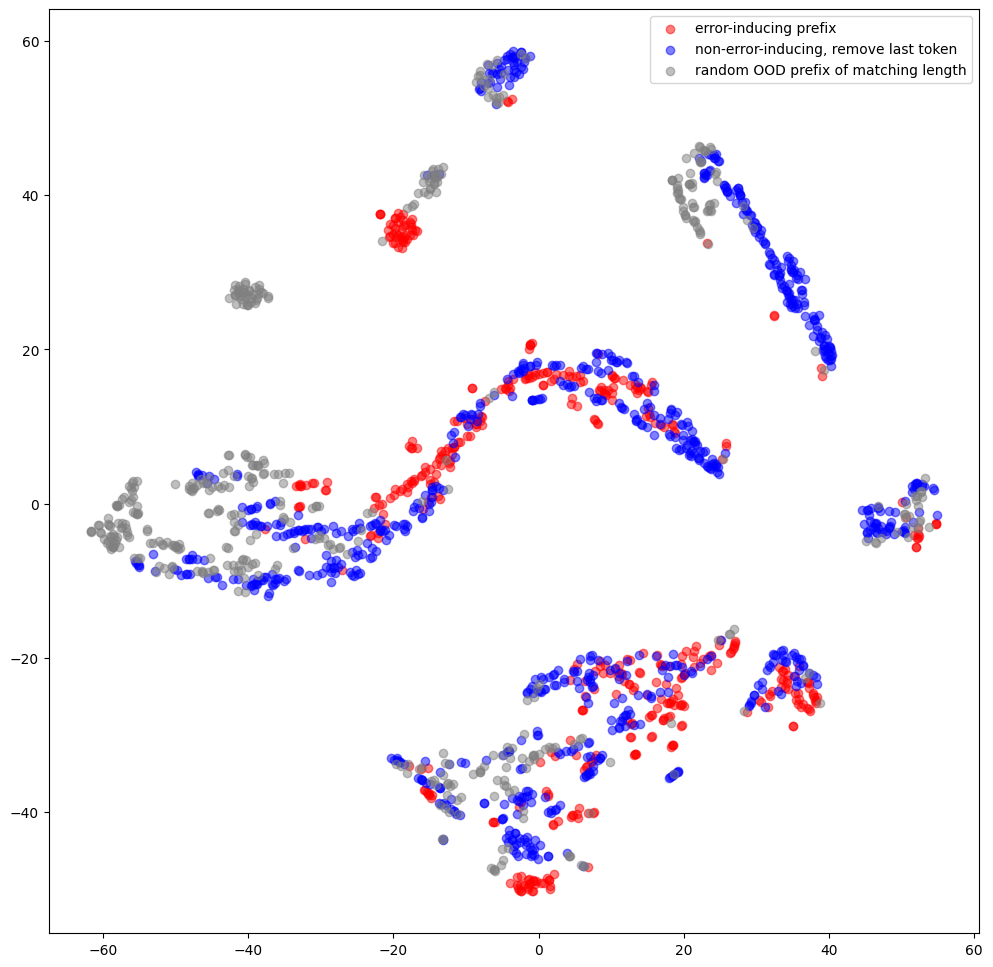

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 12))
plt.scatter(
    x=X_embedded[:len(mistake_prefix_reps), 0],
    y=X_embedded[:len(mistake_prefix_reps), 1],
    color='red',
    alpha=0.5,
    label='error-inducing prefix',
)
plt.scatter(
    x=X_embedded[len(mistake_prefix_reps):len(mistake_prefix_reps)+len(non_error_but_same_len_reps), 0],
    y=X_embedded[len(mistake_prefix_reps):len(mistake_prefix_reps)+len(non_error_but_same_len_reps), 1],
    color='blue',
    alpha=0.5,
    label='non-error-inducing, remove last token',
)
plt.scatter(
    x=X_embedded[-len(ood_sequences_subset_reps):, 0],
    y=X_embedded[-len(ood_sequences_subset_reps):, 1],
    color='grey',
    alpha=0.5,
    label='random OOD prefix of matching length',
)
plt.legend()
plt.show()

### Train model

In [ ]:
train_proportion = 0.9
train_idx_ends_positive = int(len(mistake_prefix_reps) * train_proportion)
train_idx_ends_same_len_negative = int(len(non_error_but_same_len_reps) * train_proportion)
train_idx_ends_ood_negative = int(len(ood_sequences_subset_reps) * train_proportion)

In [ ]:
train_data = [
    [1] + rep
    for rep in mistake_prefix_reps[:train_idx_ends_positive]
] + [
    [0] + rep
    for rep in non_error_but_same_len_reps[:train_idx_ends_same_len_negative]
] + [
    [0] + rep
    for rep in ood_sequences_subset_reps[:train_idx_ends_ood_negative]
]

test_data = [
    [1] + rep
    for rep in mistake_prefix_reps[train_idx_ends_positive:]
] + [
    [0] + rep
    for rep in non_error_but_same_len_reps[train_idx_ends_same_len_negative:]
] + [
    [0] + rep
    for rep in ood_sequences_subset_reps[train_idx_ends_ood_negative:]
]

len(train_data), len(test_data)

In [ ]:
train_data = torch.tensor(train_data)
test_data = torch.tensor(test_data)

print(train_data.shape, test_data.shape)

In [ ]:
from torch.utils.data import Dataset, DataLoader

class TrainDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, ind):
        x = self.data[ind][1:]
        y = self.data[ind][0]
        return x, y

# class TestDataset(TrainDataset):
#     def __getitem__(self, ind):
#         x = self.data[ind]
#         return x

train_set = TrainDataset(train_data)
test_set  = TrainDataset(test_data)

batch_size = 128
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_set,  batch_size=batch_size, shuffle=False)

In [ ]:
import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.linear = nn.Linear(512, 2)
    def forward(self, x):
        out = self.linear(x)
        return out

model_err_pred = MLP().to(device)

criterion = nn.CrossEntropyLoss()

In [ ]:
def test(model_err_pred, test_loader, criterion, device):
    model_err_pred.eval()
    all_ys = torch.tensor([]).to(device)
    all_preds = torch.tensor([]).to(device)

    with torch.no_grad():
        for batch_num, input_data in enumerate(test_loader):
            x, y = input_data
            x = x.to(device).float()
            y = y.type(torch.LongTensor).to(device)

            output = model_err_pred(x)
            loss = criterion(output, y)
            losses.append(loss.item())

            pred = output.argmax(dim=-1)

            all_ys = torch.concat([all_ys, y.detach()])
            all_preds = torch.concat([all_preds, pred.detach()])

    print('Test Loss %6.2f | test acc %.2f' % (sum(losses)/len(losses), sum(all_preds == all_ys) / len(all_ys)))

In [ ]:
# training loop
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.001,
)
epochs = 100

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

	Epoch 0 | Batch 0 | Loss   0.19 | train acc 0.88
	Epoch 0 | Batch 10 | Loss   0.31 | train acc 0.84
	Epoch 0 | Batch 20 | Loss   0.27 | train acc 0.97
Epoch 0 | Loss   0.43 | train acc 0.88
Test Loss   0.40 | test acc 0.91
	Epoch 1 | Batch 0 | Loss   0.08 | train acc 0.97
	Epoch 1 | Batch 10 | Loss   0.64 | train acc 0.84
	Epoch 1 | Batch 20 | Loss   0.25 | train acc 0.94
Epoch 1 | Loss   0.24 | train acc 1.00
Test Loss   0.25 | test acc 0.87
	Epoch 2 | Batch 0 | Loss   0.32 | train acc 0.88
	Epoch 2 | Batch 10 | Loss   0.39 | train acc 0.91
	Epoch 2 | Batch 20 | Loss   0.22 | train acc 0.94
Epoch 2 | Loss   0.29 | train acc 1.00
Test Loss   0.29 | test acc 0.94
	Epoch 3 | Batch 0 | Loss   0.22 | train acc 0.97
	Epoch 3 | Batch 10 | Loss   0.14 | train acc 0.94
	Epoch 3 | Batch 20 | Loss   0.08 | train acc 0.97
Epoch 3 | Loss   0.17 | train acc 0.88
Test Loss   0.16 | test acc 0.96
	Epoch 4 | Batch 0 | Loss   0.13 | train acc 0.97
	Epoch 4 | Batch 10 | Loss   0.13 | train acc 0.97
	Ep

In [ ]:
# training loop run 2
optimizer = torch.optim.AdamW(
    model_err_pred.parameters(),
    lr=0.003,
    weight_decay=0.001,
)
epochs = 100

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred(x)
        loss = criterion(output, y)
        loss.backward()
        losses.append(loss.item())

        optimizer.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    test(model_err_pred, test_loader, criterion, device)
    model_err_pred.train()

In [ ]:
model_err_pred.eval()

#### (optional) Train the error pred model better with EMA, etc

In [ ]:
model_err_pred_single = MLP().to(device)

optimizer = torch.optim.AdamW(
    model_err_pred_single.parameters(),
    lr=0.003,
    weight_decay=0.0001,
)

epochs = 100

In [ ]:
num_iters = len(train_loader) * epochs
num_iters

1300

In [ ]:
# linear warmup, linear decay to 0
def lr_func(t):
    if t < args['training']['warmup']:
        return t / args['training']['warmup']
    else:
        return max((num_iters - t) / (num_iters - args['training']['warmup']), 0)


scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_func)

# EMA schedule
def ema_decay_schedule(t):
    assert t >= 0
    if t < args['training']['warmup']:
        return 0.999
    else:
        return 1 - max((t+1) ** (-0.67), 0.001)

In [ ]:
# training loop
model_err_pred_ema = torch.optim.swa_utils.AveragedModel(
    model_err_pred_single,
    multi_avg_fn=torch.optim.swa_utils.get_ema_multi_avg_fn(0.999),
)

for epoch in range(epochs):
    losses = []
    for batch_num, input_data in enumerate(train_loader):
        optimizer.zero_grad()
        x, y = input_data
        x = x.to(device).float()
        y = y.type(torch.LongTensor).to(device)

        output = model_err_pred_single(x)
        loss = criterion(output, y)
        losses.append(loss.item())
        model_err_pred_single.zero_grad()
        loss.backward()
        optimizer.step()

        model_err_pred_ema.multi_avg_fn = torch.optim.swa_utils.get_ema_multi_avg_fn(
            ema_decay_schedule(i),
        )
        model_err_pred_ema.update_parameters(model_err_pred_single)
        scheduler.step()

        if batch_num % 10 == 0:
            pred = output.argmax(dim=-1)
            print('\tEpoch %d | Batch %d | Loss %6.2f | train acc %.2f' % (epoch, batch_num, loss.item(), sum(pred == y) / len(y)))
        # break

    pred = output.argmax(dim=-1)
    print('Epoch %d | Loss %6.2f | train acc %.2f' % (epoch, sum(losses)/len(losses), sum(pred == y) / len(y)))
    print('model_err_pred_single')
    test(model_err_pred_single, test_loader, criterion, device)
    print('model_err_pred_ema')
    test(model_err_pred_ema, test_loader, criterion, device)
    model_err_pred.train()


# Update bn statistics for the ema_model at the end
torch.optim.swa_utils.update_bn(train_loader, model_err_pred_ema)

	Epoch 0 | Batch 0 | Loss   1.61 | train acc 0.56
	Epoch 0 | Batch 10 | Loss   0.82 | train acc 0.55
Epoch 0 | Loss   1.28 | train acc 0.59
model_err_pred_single
Test Loss   1.20 | test acc 0.69
model_err_pred_ema
Test Loss   1.27 | test acc 0.51
	Epoch 1 | Batch 0 | Loss   0.71 | train acc 0.64
	Epoch 1 | Batch 10 | Loss   0.76 | train acc 0.72
Epoch 1 | Loss   0.68 | train acc 0.68
model_err_pred_single
Test Loss   0.66 | test acc 0.74
model_err_pred_ema
Test Loss   0.72 | test acc 0.49
	Epoch 2 | Batch 0 | Loss   0.61 | train acc 0.77
	Epoch 2 | Batch 10 | Loss   0.67 | train acc 0.72
Epoch 2 | Loss   0.60 | train acc 0.73
model_err_pred_single
Test Loss   0.57 | test acc 0.73
model_err_pred_ema
Test Loss   0.59 | test acc 0.55
	Epoch 3 | Batch 0 | Loss   0.49 | train acc 0.77
	Epoch 3 | Batch 10 | Loss   0.50 | train acc 0.76
Epoch 3 | Loss   0.49 | train acc 0.76
model_err_pred_single
Test Loss   0.48 | test acc 0.74
model_err_pred_ema
Test Loss   0.48 | test acc 0.68
	Epoch 4 | B

In [ ]:
model_err_pred_ema.eval()
model_err_pred_single.eval()

### Eval

In [ ]:
from distributions import sample_top_p, nn_next_token_probs, conditional_nn_generate
from tqdm import tqdm
from collections import defaultdict
import numpy as np
import torch


def conditional_nn_generate_with_predicted_backtrack_diverse(
    dyck,
    model,
    model_err_pred,
    prefix_sequences,
    batch_size=1,
    top_p=None,
    prefix_length=None,
    argmax_length=0,
    backtracked_prefixes=[],
    backtrack_quota=1,
    backtrack_stride=3,
):
    model.eval()
    output = []

    num_sequences = len(prefix_sequences)
    prefix_length = prefix_length or len(prefix_sequences[0]) - 1

    seq_length = dyck.length + 2  # <bos>='B' + length + <eos>='E'

    # Calculate the number of chunks we'll need
    num_chunks = (num_sequences + batch_size - 1) // batch_size

    i = 0

    for _ in tqdm(range(num_chunks), desc="Generating sequences"):
        current_batch_size = min(batch_size, num_sequences - len(output))
        batch_seqs = []

        for _ in range(current_batch_size):
            batch_seqs.append(prefix_sequences[i][:prefix_length + 1])
            i += 1

        batch_tensor = torch.tensor(batch_seqs).cuda()
        preds = model(batch_tensor)
        # Calculate log probabilities for the prefix
        batch_log_probs = torch.log_softmax(preds, dim=-1).gather(2, batch_tensor[:, 1:].unsqueeze(-1)).sum(dim=1).reshape(-1)
        batch_log_probs = batch_log_probs.tolist()

        del batch_tensor

        gen_idx = 0
        step = 1 + prefix_length
        while step < seq_length:
            if backtrack_quota > 0:
                all_intermediates = nn_intermediates(model, batch_seqs, batch_size=batch_size, positions='last')
                err_pred_output = model_err_pred(torch.tensor(all_intermediates).to(device))
                err_pred = err_pred_output.argmax(dim=-1)
                if torch.any(err_pred):
                    # backtrack
                    backtracked_prefixes.append(batch_seqs)
                    batch_seqs = [
                        batch_seq[:-backtrack_stride]
                        for batch_seq in batch_seqs
                    ]
                    gen_idx -= backtrack_stride
                    step -= backtrack_stride
                    argmax_length += backtrack_stride
                    backtrack_quota -= 1

            batch_tensor = torch.tensor(batch_seqs).cuda()
            preds = model(batch_tensor)
            p = 0.0 if gen_idx < argmax_length else top_p
            next_tokens, log_probs = sample_top_p(preds, p, step)

            # Update sequences and log probs
            for j in range(current_batch_size):
                batch_seqs[j].append(next_tokens[j].item())
                batch_log_probs[j] += log_probs[j].item()

            del preds
            del batch_tensor

            gen_idx += 1
            step += 1

        # Add to the final output
        for j in range(current_batch_size):
            output.append({'tokens': batch_seqs[j], 'log_prob_truncated': batch_log_probs[j]})

    return output, backtracked_prefixes

In [ ]:
# backtrack_quota = 1

# backtrack_stride = 3
backtrack_strides = [2, 4, 6]

backtrack_quotas = [1, 2, 4]

top_p = 0.9

results = ""

### At error positions, do we improve accuracy by backtracking and switching to argmax?

In [ ]:
# # sample continuations
# accept_sample = []
# for error_inducing_prefix in error_inducing_prefixes:
#     output = conditional_nn_generate(
#         dyck_train,
#         model,
#         [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
#         batch_size=32,
#         top_p=top_p,
#         argmax_length=0,
#     )
#     accept_sample.append(dyck_train.accept(output[0]['tokens']))

In [ ]:
# # argmax continuations
# accept_argmax = []
# for error_inducing_prefix in error_inducing_prefixes:
#     output = conditional_nn_generate(
#         dyck_train,
#         model,
#         [error_inducing_prefix],  # TODO: actually use batched version, but prefix len diff, may need padding
#         batch_size=32,
#         top_p=0.0,
#         argmax_length=0,
#     )
#     accept_argmax.append(dyck_train.accept(output[0]['tokens']))

In [ ]:
# # backtrack & argmax & sample
# accept_backtrack_argmax_sample = defaultdict(list)  # backtrack_stride -> [accept or not]
# for backtrack_stride in backtrack_strides:
#     for error_inducing_prefix in error_inducing_prefixes:
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [error_inducing_prefix[:-backtrack_stride]],  # TODO: actually use batched version, but prefix len diff, may need padding
#             batch_size=32,
#             top_p=0.9,
#             argmax_length=backtrack_stride,
#         )
#         accept_backtrack_argmax_sample[backtrack_stride].append(dyck_train.accept(output[0]['tokens']))

In [ ]:
# # backtrack & argmax all the way
# accept_backtrack_argmax_all = defaultdict(list)  # backtrack_stride -> [accept or not]
# for backtrack_stride in backtrack_strides:
#     for error_inducing_prefix in error_inducing_prefixes:
#         output = conditional_nn_generate(
#             dyck_train,
#             model,
#             [error_inducing_prefix[:-backtrack_stride]],  # TODO: actually use batched version, but prefix len diff, may need padding
#             batch_size=32,
#             top_p=0.0,
#             argmax_length=backtrack_stride,
#         )
#         accept_backtrack_argmax_all[backtrack_stride].append(dyck_train.accept(output[0]['tokens']))

In [ ]:
# backtrack_argmax_sample_results_str = '\n'
# for backtrack_stride in backtrack_strides + [8]:
#     backtrack_argmax_sample_results_str += f"\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_stride])}\n"

# backtrack_argmax_all_results_str = '\n'
# for backtrack_stride in backtrack_strides + [8]:
#     backtrack_argmax_all_results_str += f"\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_all[backtrack_stride]) / len(accept_backtrack_argmax_all[backtrack_stride])}\n"

# results1 = f"""\n\n
# Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
# sample continuations: {sum(accept_sample) / len(accept_sample)}
# argmax continuations: {sum(accept_argmax) / len(accept_argmax)}
# backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
# backtrack & argmax all the way: {backtrack_argmax_all_results_str}
# """
# results += results1
# print(results1)

In [ ]:
results = """


Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168


"""

### During generation, predict whether we would make a mistake, and if so, backtrack & use argmax

In [ ]:
results += '\n\n During generation, predict whether we would make a mistake, and if so, backtrack & use argmax\n\n'

#### can predicting where to backtrack improve accuracy?

In [ ]:
# backtrack & argmax all the way
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=100,
                backtracked_prefixes=backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


In [ ]:
# backtrack & argmax & sample
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=0,
                backtracked_prefixes=backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results2 = f"""\n\n
Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results2
print(results2)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.3548387096774194
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.47096774193548385
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.3870967741935484
		 backtrack_stride = 4, acc = 0.4645161290322581
		 backtrack_stride = 6, acc = 0.5741935483870968
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.44516129032258067
		 backtrack_stride = 4, acc = 0.5419354838709678
		 backtrack_stride = 6, acc = 0.6838709677419355

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4258064516129032
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.5161290322580645
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.44516129032258067
		 backtrack_stride = 4, acc = 0.49032258064516127
		 backtrack_stride = 6, acc = 0.6193548387096774
	 backtrack_

In [ ]:
print(results)




Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168




 During generation, predict whether we would make a mistake, and if so, backtrack & use argmax




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.3548387096774194
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.47096774193548385
	 backtr

`Note: It seems that with the same number of compute budget, a large stride performs better than a large quota`.

#### how often do we backtrack, and are those backtracked positions necessary?

In [ ]:
# sample continuations
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s]


In [ ]:
# argmax
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  7.67it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results3 = f"""\n\n
Q: How often do we backtrack? Are those backtracked positions necessary?
number of all test samples: {len(error_inducing_prefixes[train_idx_ends_positive:])}
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results3
print(results)




Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168




 During generation, predict whether we would make a mistake, and if so, backtrack & use argmax




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.3548387096774194
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.47096774193548385
	 backtr

### During generation, predict whether we would make a mistake, and if so, backtrack & use argmax (repeat with EMA trained model)

In [ ]:
results += '\n\n During generation, predict whether we would make a mistake, and if so, backtrack & use argmax (repeat with EMA trained model)\n\n'

In [ ]:
model_err_pred_backup = model_err_pred
model_err_pred = model_err_pred_ema

In [ ]:
# backtrack & argmax all the way
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=100,
                backtracked_prefixes=backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


In [ ]:
# backtrack & argmax & sample
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
backtracked_prefixes_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [backtracked_prefixes]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    backtracked_prefixes_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for error_inducing_prefix in error_inducing_prefixes[train_idx_ends_positive:]:
            output, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                dyck_train,
                model,
                model_err_pred,
                [error_inducing_prefix],
                batch_size=1,
                top_p=top_p,
                prefix_length=None,
                argmax_length=0,
                backtracked_prefixes=backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride],
                backtrack_quota=backtrack_quota,
                backtrack_stride=backtrack_stride,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results2 = f"""\n\n
Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results2
print(results2)




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.38064516129032255
		 backtrack_stride = 4, acc = 0.45161290322580644
		 backtrack_stride = 6, acc = 0.5483870967741935
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.41935483870967744
		 backtrack_stride = 4, acc = 0.5290322580645161
		 backtrack_stride = 6, acc = 0.6903225806451613
	 backtrack_quota = 4
		 backtrack_stride = 2, acc = 0.4129032258064516
		 backtrack_stride = 4, acc = 0.5806451612903226
		 backtrack_stride = 6, acc = 0.8

backtrack & argmax all the way: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.4129032258064516
		 backtrack_stride = 4, acc = 0.45806451612903226
		 backtrack_stride = 6, acc = 0.567741935483871
	 backtrack_quota = 2
		 backtrack_stride = 2, acc = 0.41935483870967744
		 backtrack_stride = 4, acc = 0.5548387096774193
		 backtrack_stride = 6, acc = 0.7096774193548387
	 backtrack_quota = 4
		 back

In [ ]:
print(results)




Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168




 During generation, predict whether we would make a mistake, and if so, backtrack & use argmax




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.3548387096774194
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.47096774193548385
	 backtr

`Note: It seems that with the same number of compute budget, a large stride performs better than a large quota`.

#### how often do we backtrack, and are those backtracked positions necessary?

In [ ]:
# sample continuations
accept_backtrack_argmax_sample = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax_sample[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]


In [ ]:
# argmax
accept_backtrack_argmax100 = {}  # backtrack_quota -> backtrack_stride -> [accept or not]
for backtrack_quota in backtrack_quotas:
    accept_backtrack_argmax100[backtrack_quota] = defaultdict(list)
    for backtrack_stride in backtrack_strides:
        for backtracked_prefix in backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride]:
            output = conditional_nn_generate(
                dyck_train,
                model,
                backtracked_prefix,
                batch_size=32,
                top_p=0.9,
                prefix_length=None,
                argmax_length=0,
            )
            accept_backtrack_argmax100[backtrack_quota][backtrack_stride].append(dyck_train.accept(output[0]['tokens']))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]


In [ ]:
backtrack_argmax_sample_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax_sample_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax_sample_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax_sample[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax_sample[backtrack_quota][backtrack_stride])}\n"

backtrack_argmax100_results_str = '\n'
for backtrack_quota in backtrack_quotas:
    backtrack_argmax100_results_str += f"\t backtrack_quota = {backtrack_quota}\n"
    for backtrack_stride in backtrack_strides:
        backtrack_argmax100_results_str += f"\t\t backtrack_stride = {backtrack_stride}, backtracked {len(backtracked_prefixes_argmax100[backtrack_quota][backtrack_stride])} times, acc = {sum(accept_backtrack_argmax100[backtrack_quota][backtrack_stride]) / len(accept_backtrack_argmax100[backtrack_quota][backtrack_stride])}\n"

results3 = f"""\n\n
Q: How often do we backtrack? Are those backtracked positions necessary?
number of all test samples: {len(error_inducing_prefixes[train_idx_ends_positive:])}
backtrack & argmax & sample: {backtrack_argmax_sample_results_str}
backtrack & argmax all the way: {backtrack_argmax100_results_str}
"""
results += results3
print(results)




Q: At error positions, do we improve accuracy by backtracking and switching to argmax?
sample continuations: 0.3310225303292894
argmax continuations: 0.3344887348353553
backtrack & argmax & sample:
	 backtrack_stride = 1, acc = 0.36568457538994803
	 backtrack_stride = 2, acc = 0.43847487001733104
	 backtrack_stride = 4, acc = 0.5909878682842288
	 backtrack_stride = 8, acc = 0.7902946273830156

backtrack & argmax all the way:
	 backtrack_stride = 1, acc = 0.35008665511265163
	 backtrack_stride = 2, acc = 0.44540727902946275
	 backtrack_stride = 4, acc = 0.5927209705372617
	 backtrack_stride = 8, acc = 0.7850953206239168




 During generation, predict whether we would make a mistake, and if so, backtrack & use argmax




Q: Can predicting where to backtrack improve accuracy?
backtrack & argmax & sample: 
	 backtrack_quota = 1
		 backtrack_stride = 2, acc = 0.3548387096774194
		 backtrack_stride = 4, acc = 0.44516129032258067
		 backtrack_stride = 6, acc = 0.47096774193548385
	 backtr

# Generate from OOD prefixes

## Baseline num errors (using new OOD results for the same set of prefix lengths)

In [ ]:
import torch

### Sampling top_p 0.9

#### run 1

In [ ]:
experiment_index = 0
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                               ood_eval_dir='ood_generation_errors/argmax_length_0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors = 0
for prefix_length in ood_results:
    print(ood_results[prefix_length])
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B(((([((()()))([()()(()())])   
1   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
2   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
3   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
4   INCORRECT_CLOSING_BRACKET        B(([[(([][]((()())(((())))   
..                        ...                               ...   
59  INCORRECT_CLOSING_BRACKET        B(())(()()())(((((((((()))   
60  INCORRECT_CLOSING_BRACKET        B()((()))(()(((()((((()())   
61  INCORRECT_CLOSING_BRACKET        B[((((([()((()))(())()([])   
62  INCORRECT_CLOSING_BRACKET       B()()((()(())((((()()((()))   
63  INCORRECT_CLOSING_BRACKET  B(()()((()(([()()()]))[()])[])()   

   generated_token  generated_token_prob most_probable_token  \
0                )              0.494678                   ]   
1                ]              0.511796                   ]   
2  

#### run 2

Generating sequences: 100%|██████████| 79/79 [00:05<00:00, 15.23it/s]


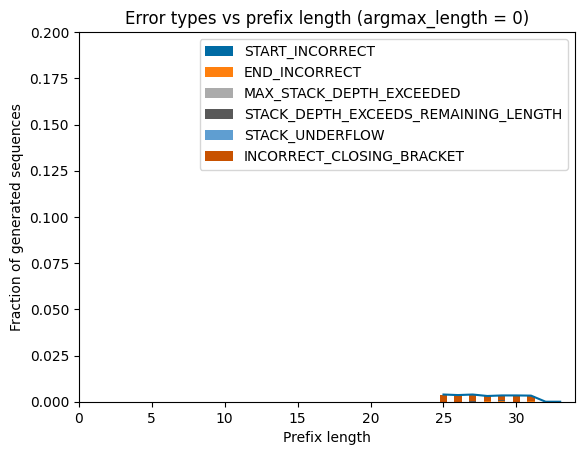

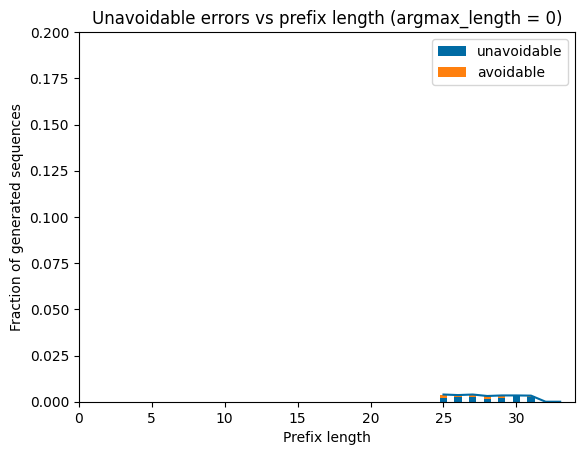

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run2/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors = 0
for prefix_length in ood_results:
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

num_errors 246


#### run 3

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 16.11it/s]


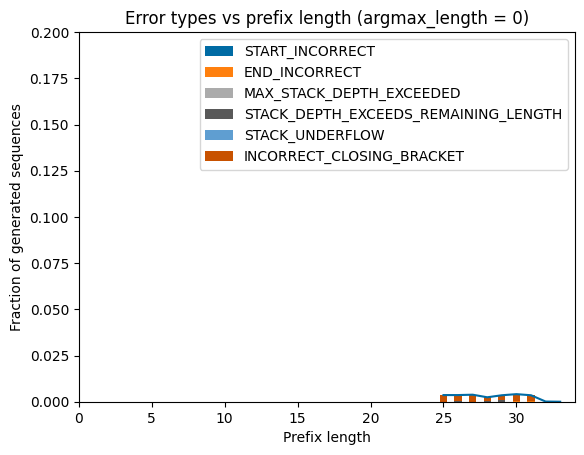

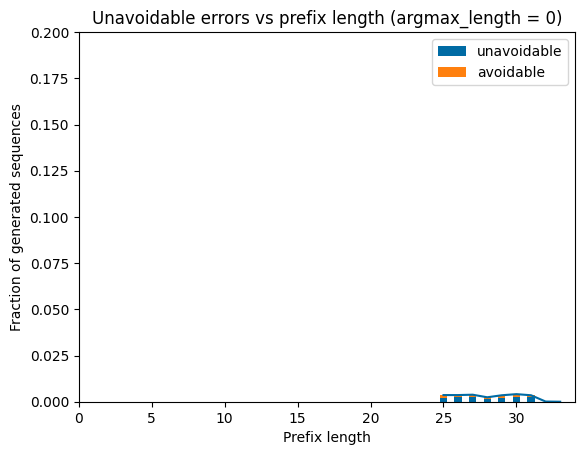

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run3/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors = 0
for prefix_length in ood_results:
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

num_errors 246


#### run 4

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 16.11it/s]


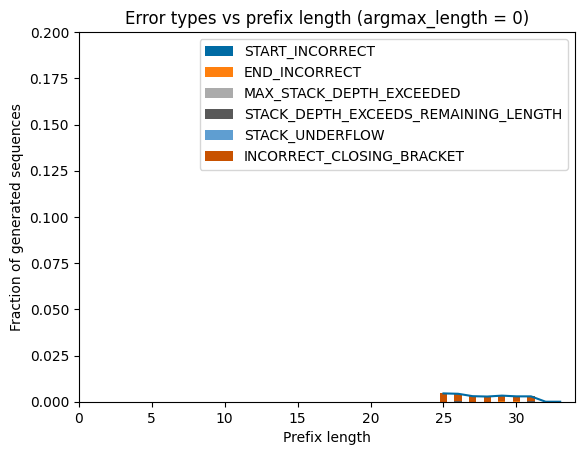

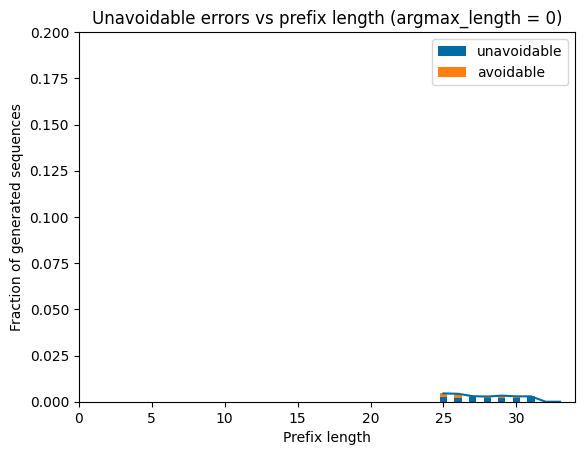

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run4/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors = 0
for prefix_length in ood_results:
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

num_errors 237


#### run 5

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 16.33it/s]


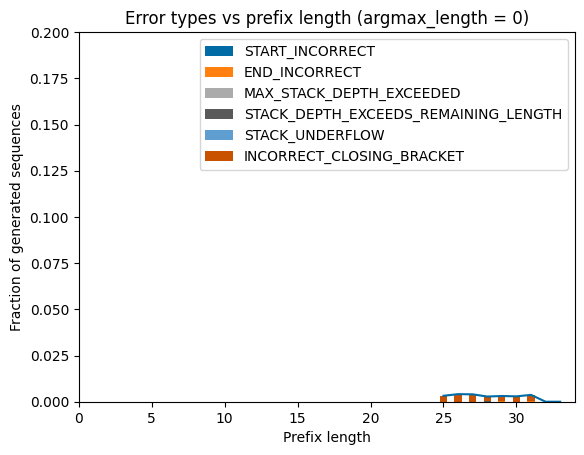

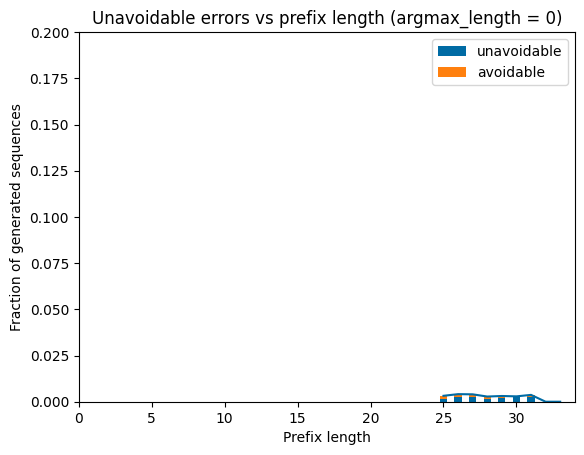

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run5/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
ood_results.keys()

dict_keys([25, 26, 27, 28, 29, 30, 31])

In [ ]:
num_errors = 0
for prefix_length in ood_results:
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

num_errors 238


#### run 6

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 17.35it/s]


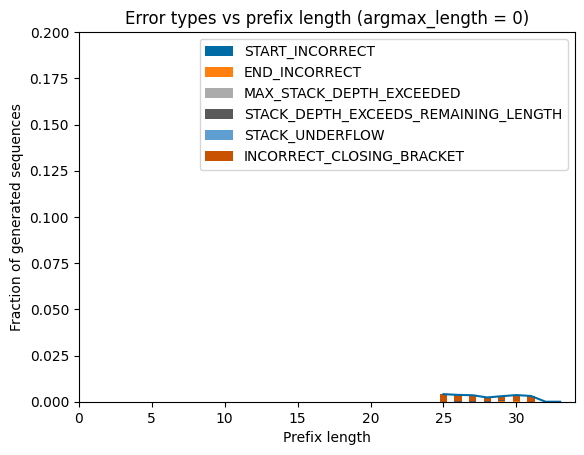

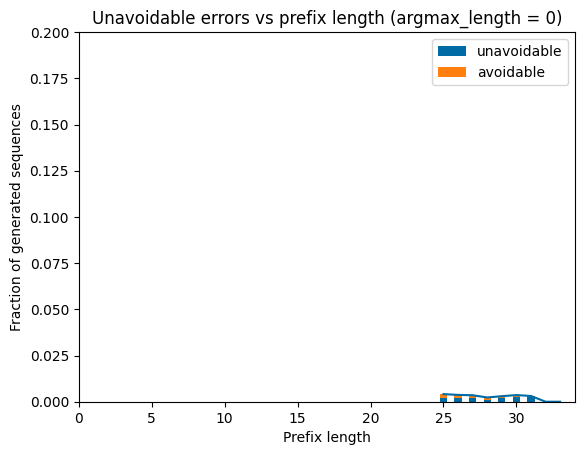

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run6/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
ood_results.keys()

dict_keys([25, 26, 27, 28, 29, 30, 31])

In [ ]:
num_errors = 0
for prefix_length in ood_results:
    num_errors += len(ood_results[prefix_length])
print('num_errors', num_errors)

num_errors 233


#### stat

In [ ]:
import numpy as np

metrics = [
    246, 246, 237, 238, 233
]

print(f"{'%.1f' % np.mean(metrics)} $\\pm$ {'%.3f' % np.std(metrics)}")

240.0 $\pm$ 5.177


### argmax

In [ ]:
len(ood_sequences)

10000

#### old run 1

In [ ]:
from distributions import conditional_nn_generate

for i in range(25, 32):
    ood_generations = conditional_nn_generate(
                    dyck_ood_eval,
                    model,
                    prefix_sequences=[seq['tokens'] for seq in ood_sequences],
                    batch_size=128,
                    top_p=0.0,
                    prefix_length=i,
                    argmax_length=100,
                    backtrack_quota=backtrack_quota,
                    backtrack_stride=backtrack_stride,
                    max_allowed_prefix_truncation=0,
                    backtracked_prefixes=None,
                    model_err_pred=None,
                    allow_2nd_backtrack_at_same_prefix=False,
                )

    illegal_ood_seqs = []
    for _, seq in enumerate(ood_generations):
        if not dyck_ood_eval.accept(seq['tokens']):
            illegal_ood_seqs.append(seq['tokens'])
    print('len(illegal_ood_seqs)', len(illegal_ood_seqs))

Generating sequences: 100%|██████████| 79/79 [00:37<00:00,  2.13it/s]


len(illegal_ood_seqs) 45


Generating sequences: 100%|██████████| 79/79 [00:32<00:00,  2.39it/s]


len(illegal_ood_seqs) 35


Generating sequences: 100%|██████████| 79/79 [00:27<00:00,  2.84it/s]


len(illegal_ood_seqs) 36


Generating sequences: 100%|██████████| 79/79 [00:24<00:00,  3.20it/s]


len(illegal_ood_seqs) 28


Generating sequences: 100%|██████████| 79/79 [00:20<00:00,  3.79it/s]


len(illegal_ood_seqs) 28


Generating sequences: 100%|██████████| 79/79 [00:17<00:00,  4.58it/s]


len(illegal_ood_seqs) 32


Generating sequences: 100%|██████████| 79/79 [00:12<00:00,  6.12it/s]


len(illegal_ood_seqs) 28


In [ ]:
45 + 35 + 36 + 28 + 28 + 32 + 28

232

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 17.36it/s]


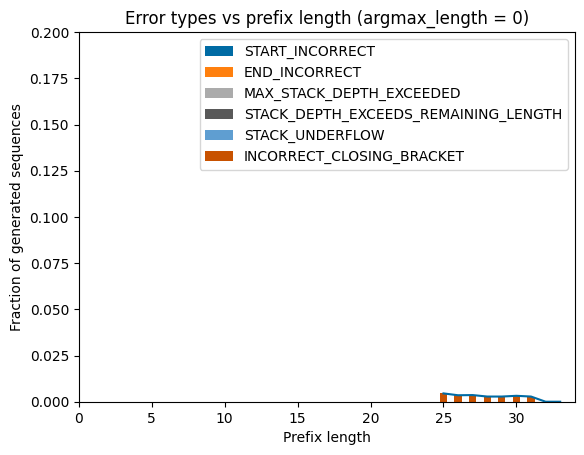

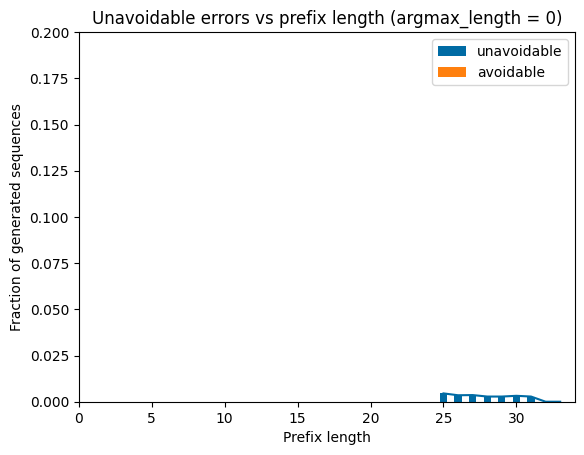

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_argmax = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0/argmax_length_0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_argmax.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_argmax = 0
for prefix_length in ood_results_argmax:
    print(ood_results_argmax[prefix_length])
    num_errors_argmax += len(ood_results_argmax[prefix_length])
print('num_errors_argmax', num_errors_argmax)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1   INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2   INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
3   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
5   INCORRECT_CLOSING_BRACKET      B(([[(([][]((()())(((())))))   
6   INCORRECT_CLOSING_BRACKET       B(()((()(([()(()())()(([]))   
7   INCORRECT_CLOSING_BRACKET     B((([([](((([(()())()()])))))   
8   INCORRECT_CLOSING_BRACKET        B((()[(((((((()(()))))))))   
9   INCORRECT_CLOSING_BRACKET     B((([(([()((((()()))(())))]))   
10  INCORRECT_CLOSING_BRACKET        B()(((((([()(())()((([])))   
11  INCORRECT_CLOSING_BRACKET     B((([((()()()([(()()(()))])))   
12  INCORRECT_CLOSING_BRACKET        B()(())((((((()((()()(()))   
13  INCORRECT_CLOSING_BRACKET        B(((((([[][(((()))())()()

#### run 2

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 16.16it/s]


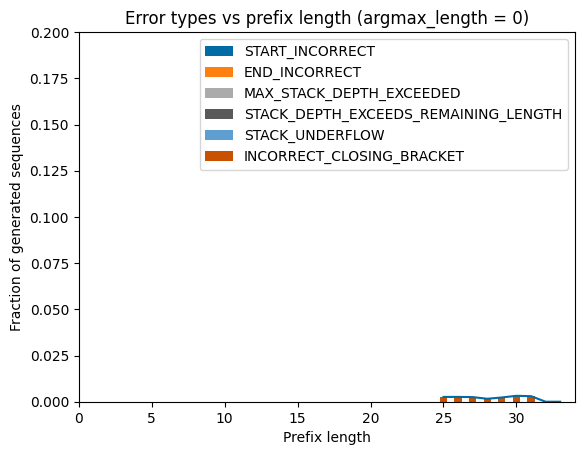

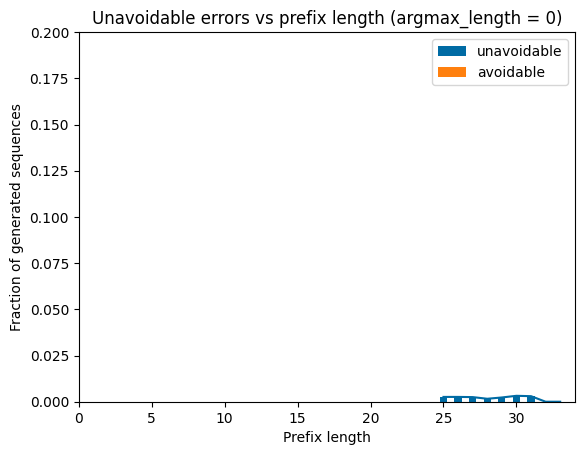

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        0.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_argmax = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run2/argmax_length_0_p0.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_argmax.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_argmax = 0
for prefix_length in ood_results_argmax:
    # print(ood_results_argmax[prefix_length])
    num_errors_argmax += len(ood_results_argmax[prefix_length])
print('num_errors_argmax', num_errors_argmax)

num_errors_argmax 178


### Sampling top_p 1.0

In [ ]:
!cat error_analysis.py

import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from enum import Enum
import os
import collections
import matplotlib.pyplot as plt
from distributions import conditional_nn_generate

plt.style.use('tableau-colorblind10')

ErrorType = Enum('ErrorType', ['START_INCORRECT', 
                               'END_INCORRECT', 
                               'MAX_STACK_DEPTH_EXCEEDED', 
                               'STACK_DEPTH_EXCEEDS_REMAINING_LENGTH', 
                               'STACK_UNDERFLOW',
                               'INCORRECT_CLOSING_BRACKET' ])

# analyze an invalid sequence
def analyze_error(dyck, model, seq, backtrack_quota=None):
    stack = []
    has_seen_bos = False

    error = None

    preds = model(torch.tensor([seq]).cuda())
    preds = torch.softmax(preds, dim=-1)

    for i, x in enumerate(seq):
        if x == dyck.bos:
            if not has_seen_bos:
                has_seen_bos = True
                continue
            else:
  

#### old run 1

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 17.43it/s]


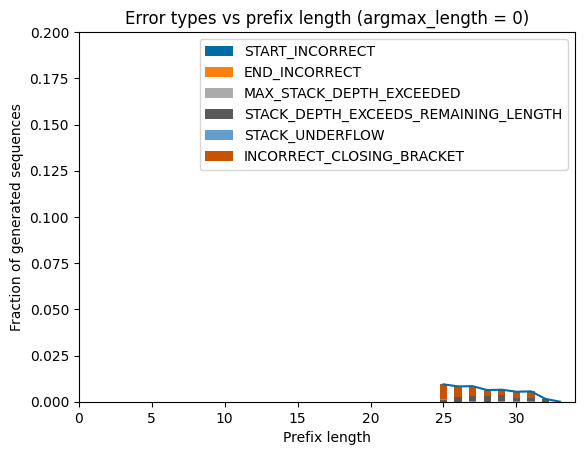

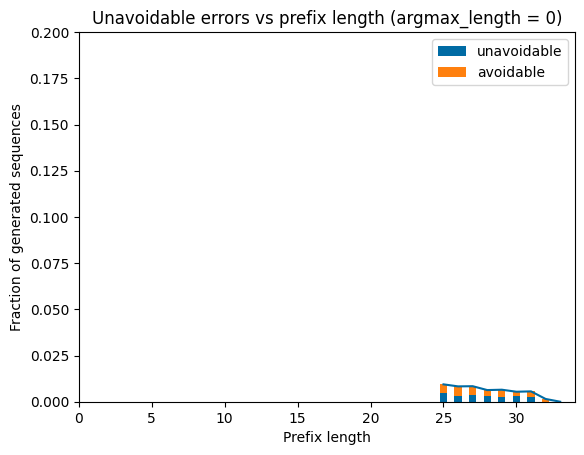

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

                                   error                            prefix  \
0              INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1              INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2              INCORRECT_CLOSING_BRACKET    B(([(()((((()))())([(())])))()   
3              INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   STACK_DEPTH_EXCEEDS_REMAINING_LENGTH   B[]()[()()(([][]()))]()([([[]])   
..                                   ...                               ...   
89                       STACK_UNDERFLOW   B()((())())(())[[]()[](()([]))]   
90             INCORRECT_CLOSING_BRACKET     B(((())))()()[](())[()](()[[]   
91             INCORRECT_CLOSING_BRACKET        B[((((([()((()))(())()([])   
92             INCORRECT_CLOSING_BRACKET        B()()((()(())((((()()((())   
93             INCORRECT_CLOSING_BRACKET  B(()()(())(()((((()))(())(()))))   

   generated_token  generated_token_prob most_probable_token  \

#### run 2

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 15.97it/s]


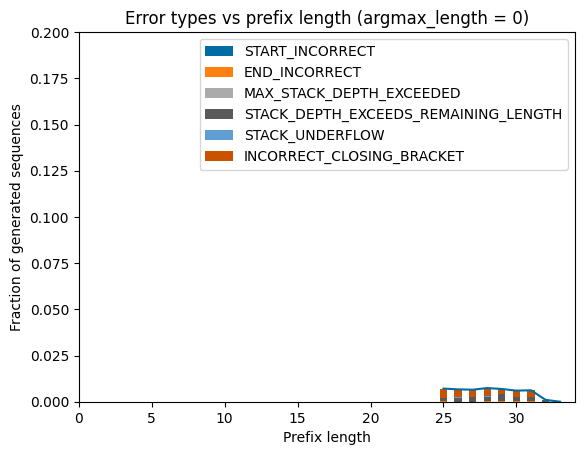

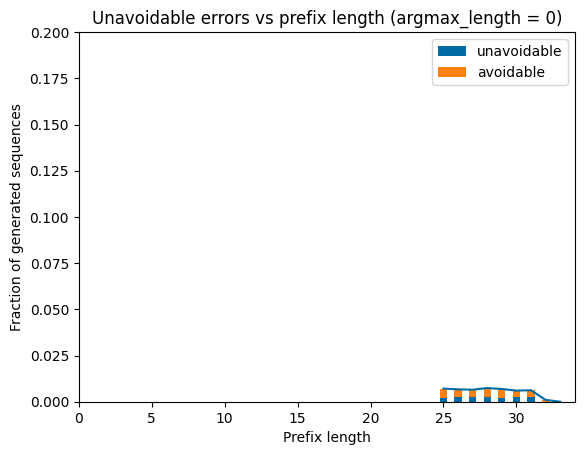

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run2/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    # print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

num_errors_vanilla 478


#### run 3

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 15.99it/s]


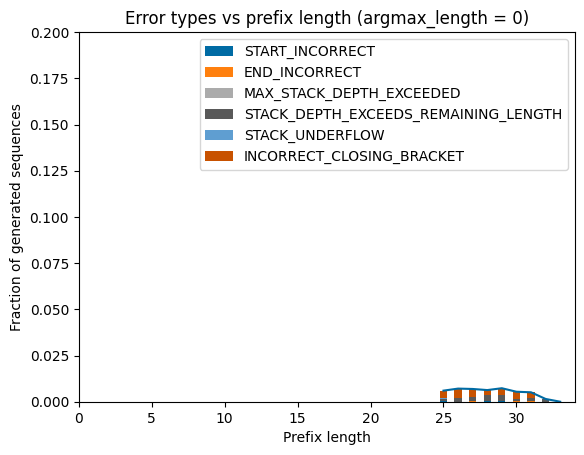

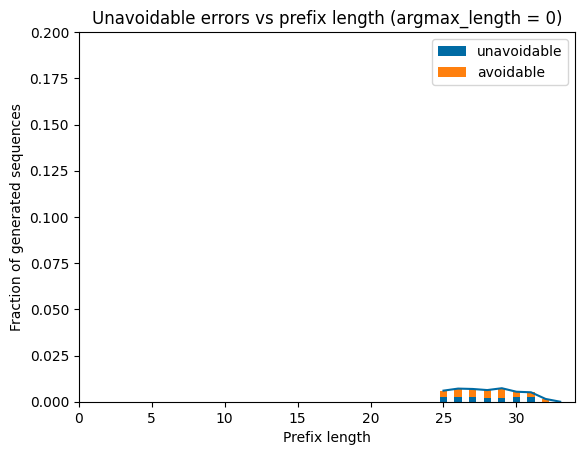

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run3/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    # print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

num_errors_vanilla 456


#### run 4

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 16.16it/s]


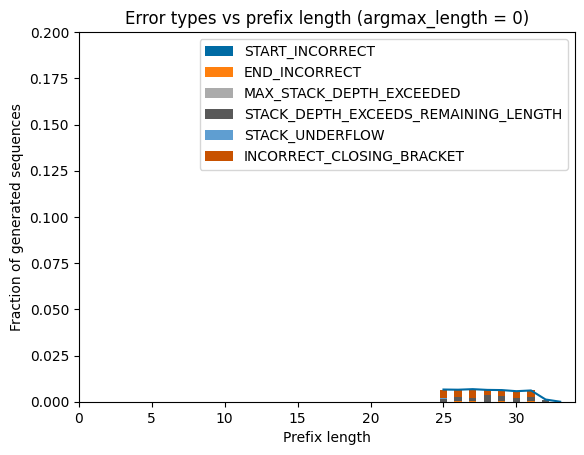

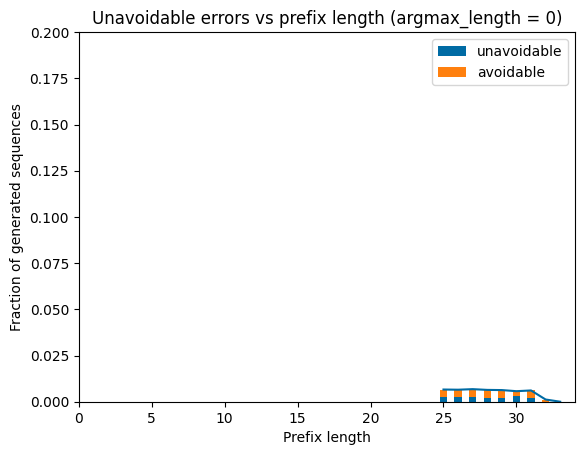

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run4/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    # print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

num_errors_vanilla 456


#### run 5

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 15.93it/s]


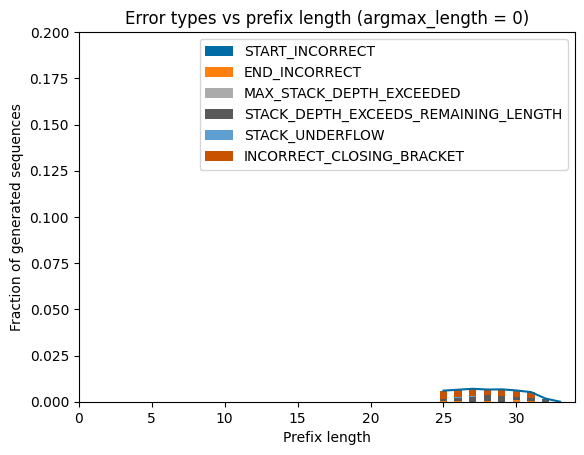

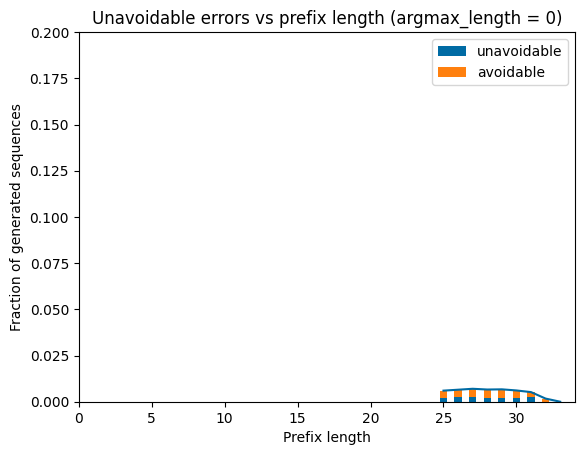

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run5/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    # print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

num_errors_vanilla 458


#### run 6

Generating sequences: 100%|██████████| 79/79 [00:04<00:00, 17.40it/s]


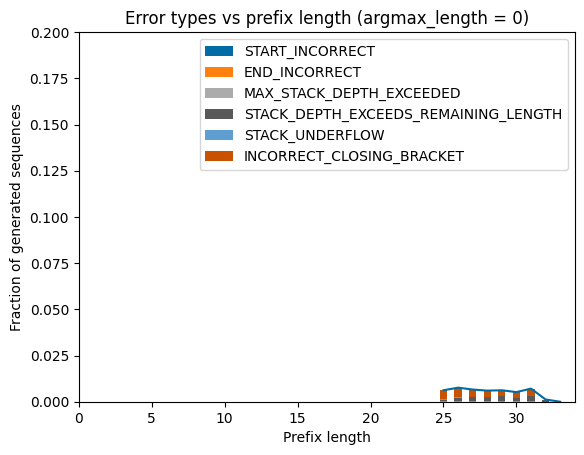

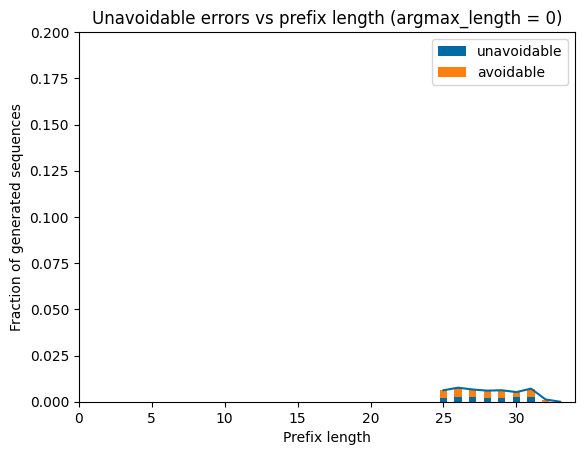

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 0
backtrack_stride = 0

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        128,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=None,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_vanilla = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota0stride0_run6/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_vanilla.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_vanilla = 0
for prefix_length in ood_results_vanilla:
    # print(ood_results_vanilla[prefix_length])
    num_errors_vanilla += len(ood_results_vanilla[prefix_length])
print('num_errors_vanilla', num_errors_vanilla)

num_errors_vanilla 461


#### stat

In [ ]:
import numpy as np

metrics = [
    478, 456, 456, 458, 461
]

print(f"{'%.1f' % np.mean(metrics)} $\\pm$ {'%.3f' % np.std(metrics)}")

461.8 $\pm$ 8.304


## Generate with backtracking

In [ ]:
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from enum import Enum
import os
import collections
import matplotlib.pyplot as plt

from distributions import conditional_nn_generate
from error_analysis import analyze_and_save_errors, ErrorType


def analyze_and_save_ood_errors_err_pred(ood_sequences, dyck, model, batch_size, top_p, eval_dir, argmax_length=0,
                                model_err_pred=None, min_prefix_len=0):
    def plot_stacked_bars(stack_dict, x, y, title, filename):
        width = 0.5
        fig, ax = plt.subplots()
        bottom = np.zeros(len(x))

        for error_name, error_count in stack_dict.items():
            ax.bar(x, error_count, width = width, bottom=bottom, label=error_name)
            bottom += error_count

        ax.set_ylabel('Fraction of generated sequences')
        ax.set_xlabel('Prefix length')

        ax.set_ylim(0, 0.2)
        ax.set_xlim(0, dyck.length + 2)

        ax.set_title(title)
        ax.legend()
        ax.plot(x, y)
        fig.savefig(filename, bbox_inches='tight', dpi = 300)

    ood_dir = os.path.join(eval_dir, f'ood_generation_errors_err_pred/argmax_length_{argmax_length}')

    if not os.path.exists(ood_dir):
        os.makedirs(ood_dir)

    x = []
    y = []

    # To plot error counts by type
    error_count_dict = collections.defaultdict(list)

    # To plot unavoidable errors
    unavoidable_count_dict = collections.defaultdict(list)

    num_ood_sequences = len(ood_sequences)

    for i in range(min_prefix_len, dyck.length + 2):
        if i + argmax_length > dyck.length + 1:
            continue

        output_file = os.path.join(ood_dir, f'prefix_length_{i}.csv')

        if os.path.exists(output_file):
            print(f"Warning: error analysis already exists at: {output_file}, skipped")
            df = pd.read_csv(output_file)

        else:
            ood_generations = conditional_nn_generate(
                dyck,
                model,
                prefix_sequences=[seq['tokens'] for seq in ood_sequences],
                batch_size=batch_size,
                top_p=top_p,
                prefix_length=i,
                argmax_length=argmax_length,
                backtrack_quota=4,
                backtrack_stride=4,
                max_allowed_prefix_truncation=0,
                backtracked_prefixes=[],
                model_err_pred=model_err_pred,
                allow_2nd_backtrack_at_same_prefix=False,  # TODO: try to avoid running into same prefix 2nd time
            )

            illegal_ood_seqs = []

            backtrack_quotas = []
            for _, seq in enumerate(ood_generations):
                if not dyck.accept(seq['tokens']):
                    illegal_ood_seqs.append(seq['tokens'])
                    print('remaining_backtrack_quota', seq['remaining_backtrack_quota'])  # debug
                    backtrack_quotas.append(seq['remaining_backtrack_quota'])

            # analyze and save errors
            df = analyze_and_save_errors(dyck, model, illegal_ood_seqs, output_file, backtrack_quotas)

        if df is not None:
            num_illegal_ood_seqs = len(df['error'])
        else:
            num_illegal_ood_seqs = 0

        x.append(i)
        y.append(num_illegal_ood_seqs/num_ood_sequences)

        if df is not None:
            # Storing error counts by type
            error_counts = df['error'].value_counts()
            for error_type in ErrorType:
                error_count_dict[error_type.name].append(error_counts.get(error_type.name, 0)/num_ood_sequences)

            # Storing unavoidable errors
            is_unavoidable = df['generated_token'] == df['most_probable_token']
            unavoidable_sum = is_unavoidable.sum()
            unavoidable_count_dict['unavoidable'].append(unavoidable_sum/num_ood_sequences)
            unavoidable_count_dict['avoidable'].append((num_illegal_ood_seqs - unavoidable_sum)/num_ood_sequences)

        else:
            for error_type in ErrorType:
                error_count_dict[error_type.name].append(0)

            unavoidable_count_dict['unavoidable'].append(0)
            unavoidable_count_dict['avoidable'].append(0)


    # Plot error counts by type
    plot_stacked_bars(error_count_dict, x, y,
                      f'Error types vs prefix length (argmax_length = {argmax_length})',
                      os.path.join(ood_dir, f'error_types_vs_ood_prefix_length_argmax_length_{argmax_length}.png'))

    # Plot unavoidable errors
    plot_stacked_bars(unavoidable_count_dict, x, y,
                      f'Unavoidable errors vs prefix length (argmax_length = {argmax_length})',
                      os.path.join(ood_dir, f'unavoidable_errors_vs_ood_prefix_length_argmax_length_{argmax_length}.png'))

In [ ]:
model.eval()
model_err_pred.eval()

MLP(
  (linear): Linear(in_features=512, out_features=2, bias=True)
)

In [ ]:
# run 1
with torch.no_grad():
    analyze_and_save_ood_errors_err_pred(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        model_err_pred=model_err_pred,
        min_prefix_len=25,
    )

Generating sequences: 100%|██████████| 10000/10000 [01:15<00:00, 132.50it/s]
Analyzing errors: 0it [00:00, ?it/s]


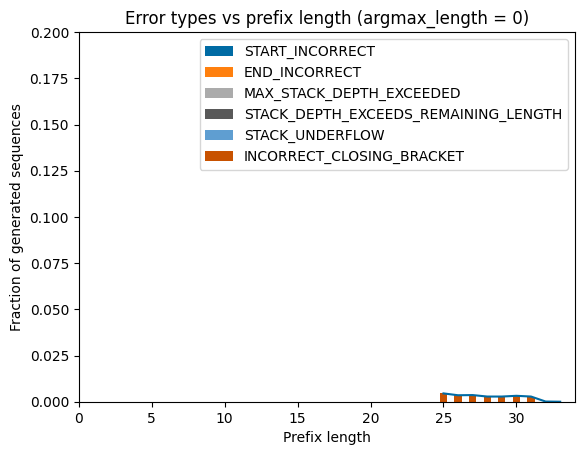

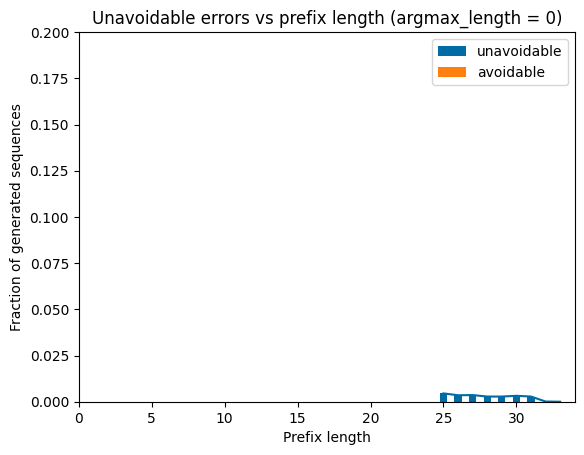

In [ ]:
# run 2
with torch.no_grad():
    analyze_and_save_ood_errors_err_pred(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        model_err_pred=model_err_pred,
        min_prefix_len=25,
    )

Generating sequences: 100%|██████████| 10000/10000 [01:17<00:00, 128.87it/s]


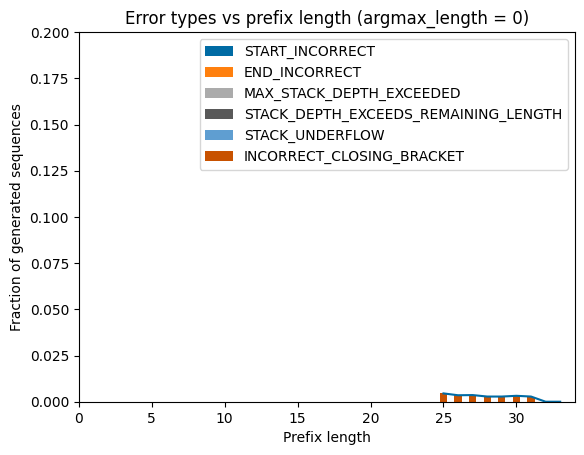

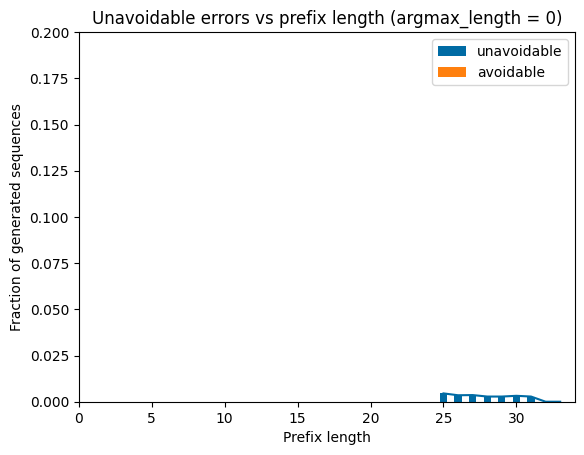

In [ ]:
# run 3
with torch.no_grad():
    analyze_and_save_ood_errors_err_pred(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        model_err_pred=model_err_pred,
        min_prefix_len=25,
    )

In [ ]:
!cat distributions.py

# Dyck distribution learning and sampling

import numpy as np
import torch
from tqdm import tqdm
import datasets


LARGE_NEGATIVE_FOR_LOG_PROB = -100.0


def get_vocab_size(num_types):
    return 2 * num_types + 2


class RandomWalkDyck: # Dyck language data generator with likelihoods
    def __init__(self, config={}):
        self.length = config['length']
        self.num_types = config.get('num_types') or 2
        self.max_depth = config.get('max_depth')
        self.np_rng = np.random.default_rng(config.get('seed')) # determinism
        # Allow for unequal opening bracket probabilities, default to equal
        self.type_probs = config.get('type_probs', np.ones(self.num_types)/self.num_types)
        self.vocab_size = get_vocab_size(self.num_types)
        self.bos = 2*self.num_types
        self.eos = 2*self.num_types+1
        self.tokens = list('([{<'[:self.num_types]) + list(')]}>'[:self.num_types]) + ['B', 'E']
        self.vocab = dict(zip(self.tokens, range(self.vocab_size

In [ ]:
!cat error_analysis.py

import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from enum import Enum
import os
import collections
import matplotlib.pyplot as plt
from distributions import conditional_nn_generate

plt.style.use('tableau-colorblind10')

ErrorType = Enum('ErrorType', ['START_INCORRECT', 
                               'END_INCORRECT', 
                               'MAX_STACK_DEPTH_EXCEEDED', 
                               'STACK_DEPTH_EXCEEDS_REMAINING_LENGTH', 
                               'STACK_UNDERFLOW',
                               'INCORRECT_CLOSING_BRACKET' ])

# analyze an invalid sequence
def analyze_error(dyck, model, seq, backtrack_quota=None):
    stack = []
    has_seen_bos = False

    error = None

    preds = model(torch.tensor([seq]).cuda())
    preds = torch.softmax(preds, dim=-1)

    for i, x in enumerate(seq):
        if x == dyck.bos:
            if not has_seen_bos:
                has_seen_bos = True
                continue
            else:
  

Generating sequences: 100%|██████████| 10000/10000 [01:19<00:00, 125.21it/s]


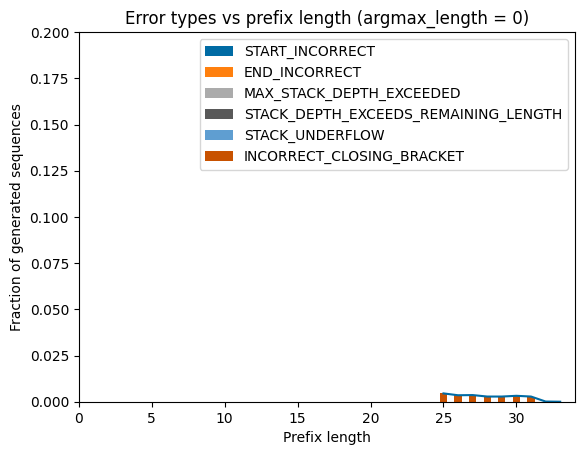

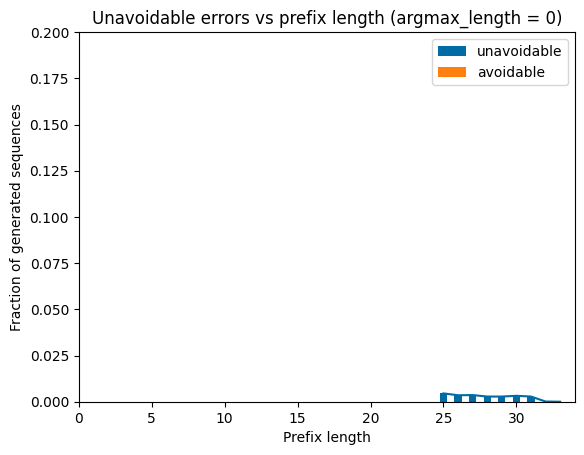

In [ ]:
# run 4
with torch.no_grad():
    analyze_and_save_ood_errors_err_pred(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        model_err_pred=model_err_pred,
        min_prefix_len=25,
    )

### quota = 4, stride = 4, top p 0.9

#### old run 1

Generating sequences: 100%|██████████| 10000/10000 [11:56<00:00, 13.96it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_

Generating sequences: 100%|██████████| 10000/10000 [10:33<00:00, 15.79it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0


Generating sequences: 100%|██████████| 10000/10000 [09:12<00:00, 18.10it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_

Generating sequences: 100%|██████████| 10000/10000 [07:51<00:00, 21.20it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0


Generating sequences: 100%|██████████| 10000/10000 [06:35<00:00, 25.31it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0


Generating sequences: 100%|██████████| 10000/10000 [05:14<00:00, 31.80it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0


Generating sequences: 100%|██████████| 10000/10000 [03:57<00:00, 42.13it/s]


remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0
remaining_backtrack_quota 0


Generating sequences: 100%|██████████| 10000/10000 [01:20<00:00, 124.61it/s]


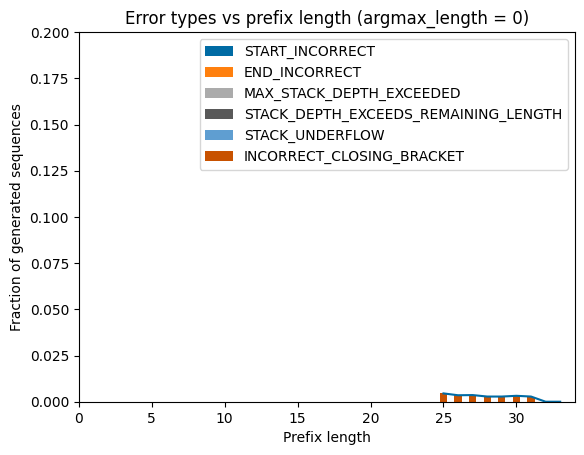

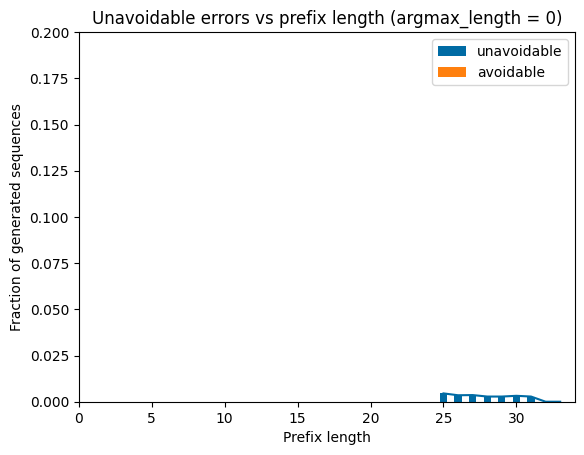

In [ ]:
# run 5
with torch.no_grad():
    analyze_and_save_ood_errors_err_pred(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        model_err_pred=model_err_pred,
        min_prefix_len=25,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_err_pred/argmax_length_0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results.keys())

[5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31]

In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1   INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2   INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
3   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
5   INCORRECT_CLOSING_BRACKET      B(([[(([][]((()())(((())))))   
6   INCORRECT_CLOSING_BRACKET       B(()((()(([()(()())()(([]))   
7   INCORRECT_CLOSING_BRACKET     B((([([](((([(()())()()])))))   
8   INCORRECT_CLOSING_BRACKET        B((()[(((((((()(()))))))))   
9   INCORRECT_CLOSING_BRACKET     B((([(([()((((()()))(())))]))   
10  INCORRECT_CLOSING_BRACKET        B()(((((([()(())()((([])))   
11  INCORRECT_CLOSING_BRACKET     B((([((()()()([(()()(()))])))   
12  INCORRECT_CLOSING_BRACKET        B()(())((((((()((()()(()))   
13  INCORRECT_CLOSING_BRACKET        B(((((([[][(((()))())()()

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1   INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2   INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
3   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
5   INCORRECT_CLOSING_BRACKET      B(([[(([][]((()())(((())))))   
6   INCORRECT_CLOSING_BRACKET       B(()((()(([()(()())()(([]))   
7   INCORRECT_CLOSING_BRACKET     B((([([](((([(()())()()])))))   
8   INCORRECT_CLOSING_BRACKET        B((()[(((((((()(()))))))))   
9   INCORRECT_CLOSING_BRACKET     B((([(([()((((()()))(())))]))   
10  INCORRECT_CLOSING_BRACKET        B()(((((([()(())()((([])))   
11  INCORRECT_CLOSING_BRACKET     B((([((()()()([(()()(()))])))   
12  INCORRECT_CLOSING_BRACKET        B()(())((((((()((()()(()))   
13  INCORRECT_CLOSING_BRACKET        B(((((([[][(((()))())()()

#### run 2

In [ ]:
model_err_pred

MLP(
  (linear): Linear(in_features=512, out_features=2, bias=True)
)

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 137.64it/s]


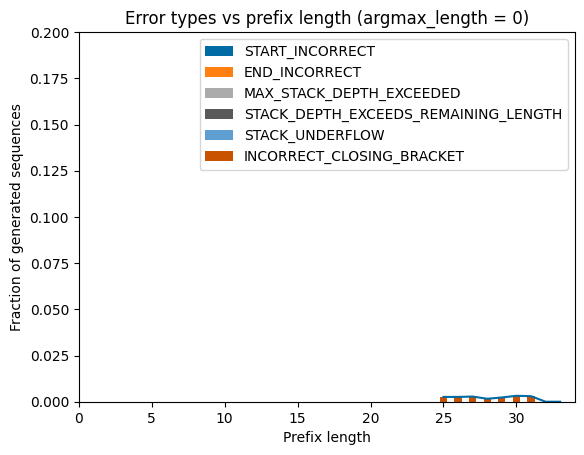

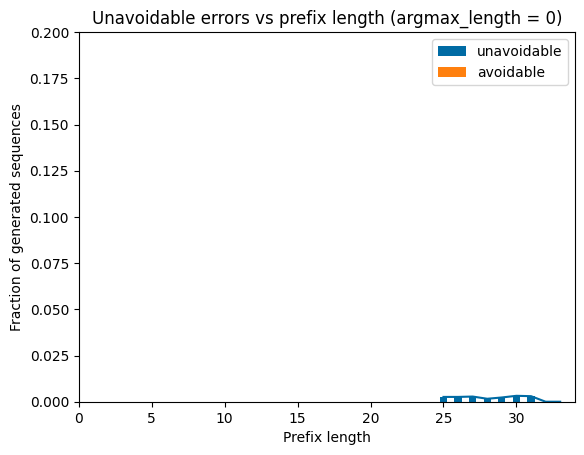

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
!ls ../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0/generated_final_p0.9/ood_generation_errors_error_pred_quota4stride4_run2/

argmax_length_0_p0.9


In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results.keys())

[5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31]

In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 181


#### run 3

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 138.75it/s]


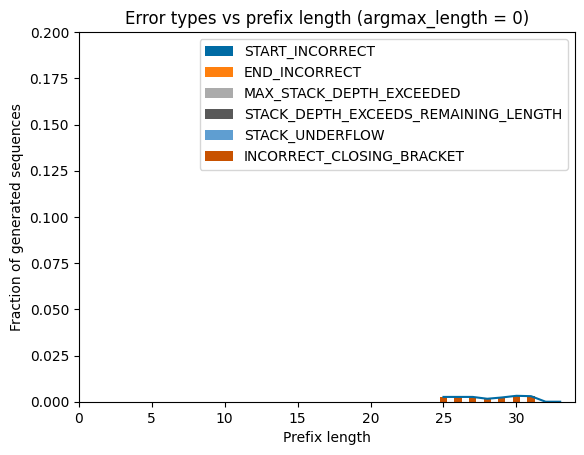

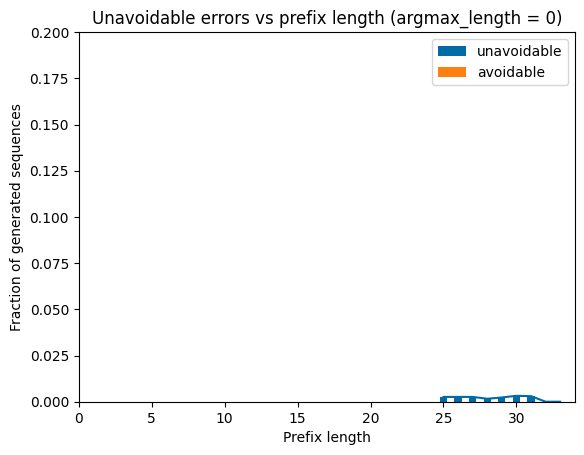

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 179


#### run 4

Generating sequences: 100%|██████████| 10000/10000 [01:11<00:00, 138.91it/s]


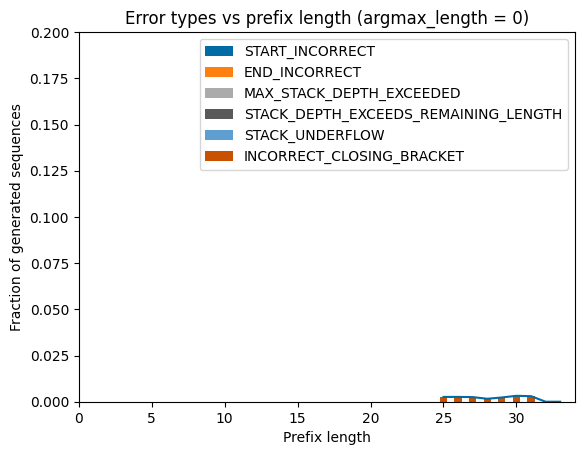

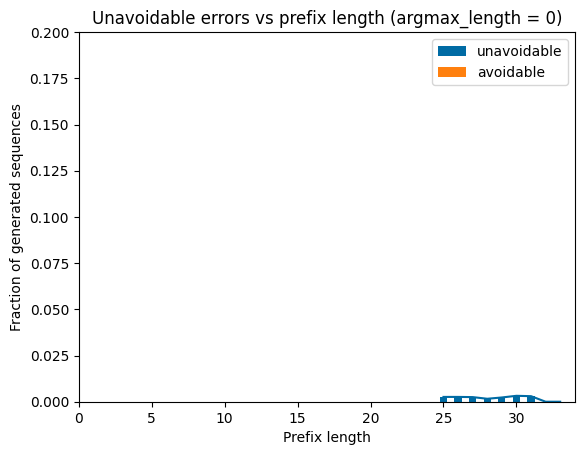

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 178


#### run 5

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 137.73it/s]


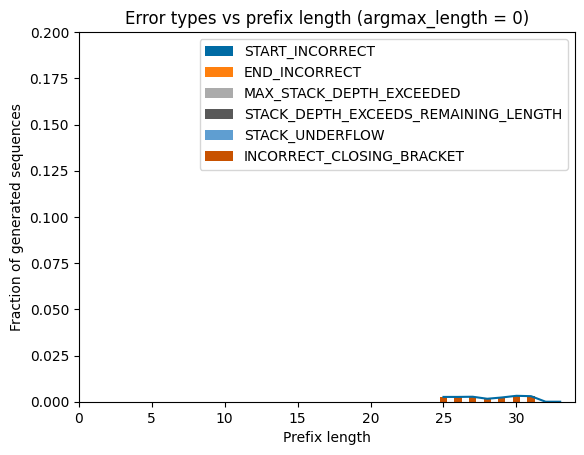

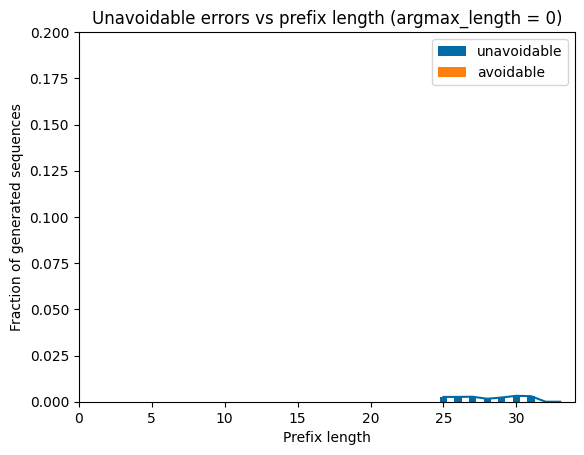

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 180


#### run 6

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

Generating sequences:  44%|████▍     | 4420/10000 [02:38<03:02, 30.54it/s]

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 179


#### stat

In [ ]:
import numpy as np

metrics = [
    181, 179, 178, 180, 179
]

print(f"{'%.1f' % np.mean(metrics)} $\\pm$ {'%.3f' % np.std(metrics)}")

179.4 $\pm$ 1.020


### quota = 4, stride = 4, top p 0.9, no argmax at backtracked positions

#### run 2

In [ ]:
model_err_pred

MLP(
  (linear): Linear(in_features=512, out_features=2, bias=True)
)

Generating sequences: 100%|██████████| 10000/10000 [01:10<00:00, 141.08it/s]


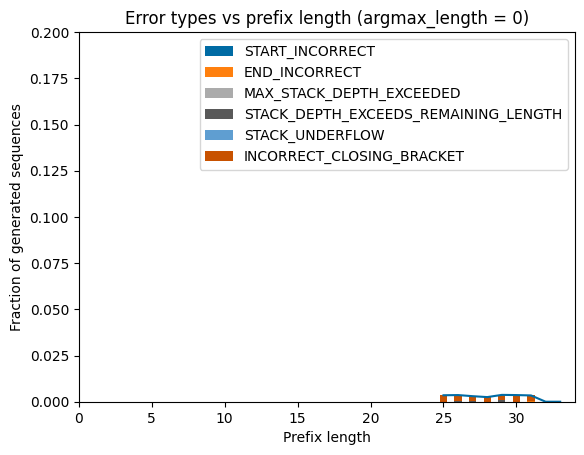

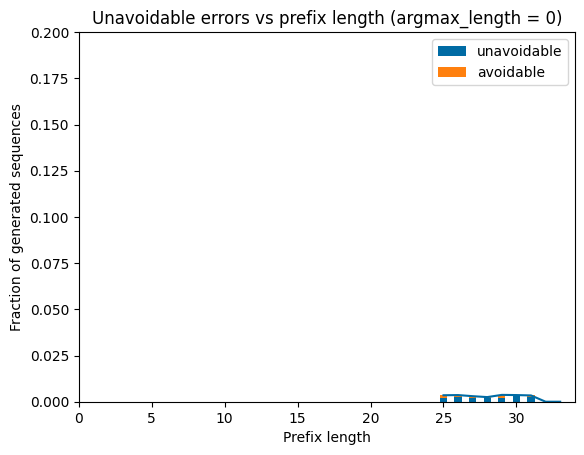

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2_noargmax',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
        redo_backtrack_with_argmax=False,
    )

In [ ]:
backtrack_quota = 4
backtrack_stride = 4

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2_noargmax/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 233


#### run 3

Generating sequences: 100%|██████████| 10000/10000 [01:07<00:00, 147.39it/s]


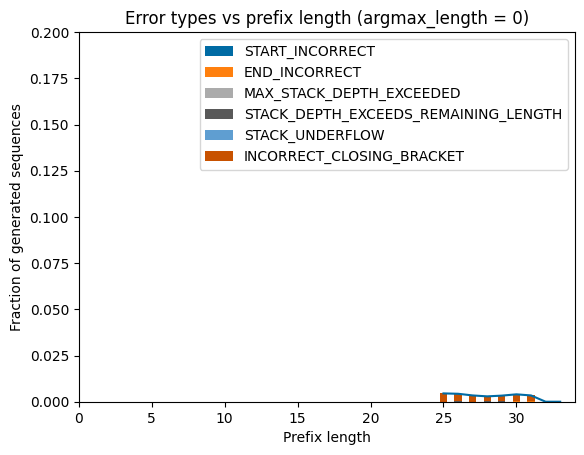

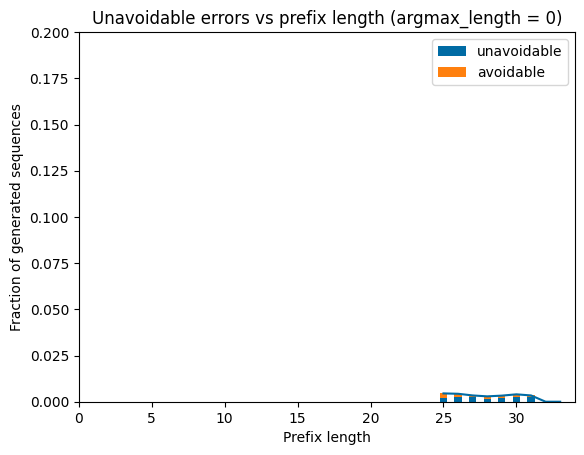

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_noargmax',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
        redo_backtrack_with_argmax=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_noargmax/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 258


#### run 4

Generating sequences: 100%|██████████| 10000/10000 [01:08<00:00, 146.45it/s]


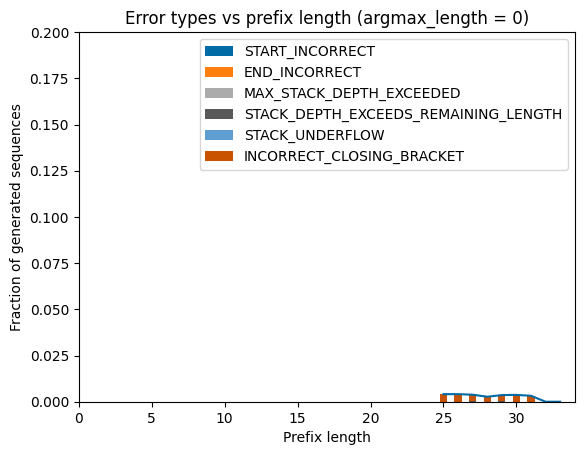

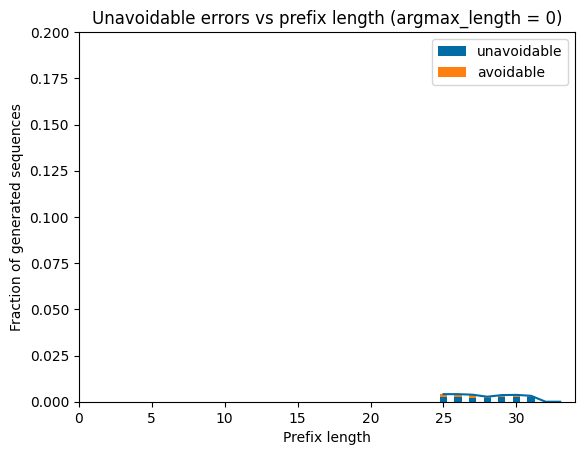

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4_noargmax',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
        redo_backtrack_with_argmax=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4_noargmax/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 252


#### run 5

Generating sequences: 100%|██████████| 10000/10000 [01:08<00:00, 146.40it/s]


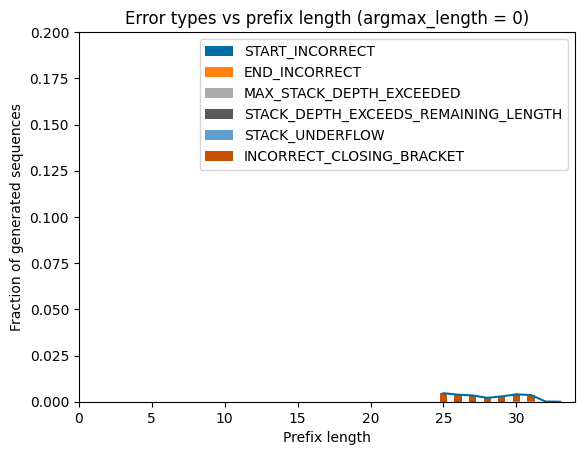

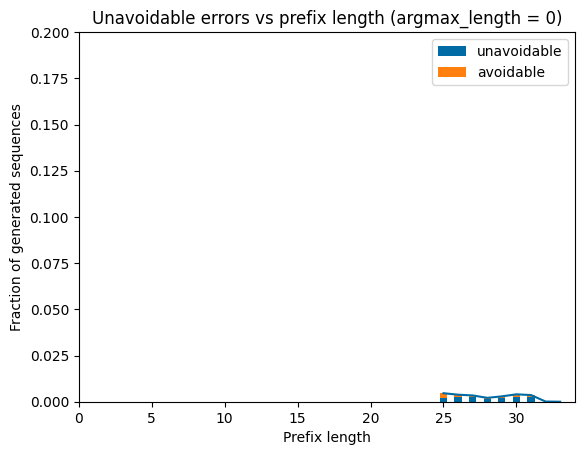

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5_noargmax',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
        redo_backtrack_with_argmax=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5_noargmax/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 245


#### run 6

Generating sequences: 100%|██████████| 10000/10000 [01:08<00:00, 146.98it/s]


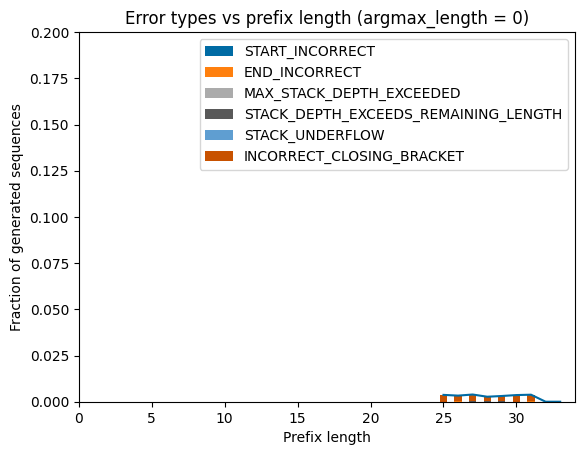

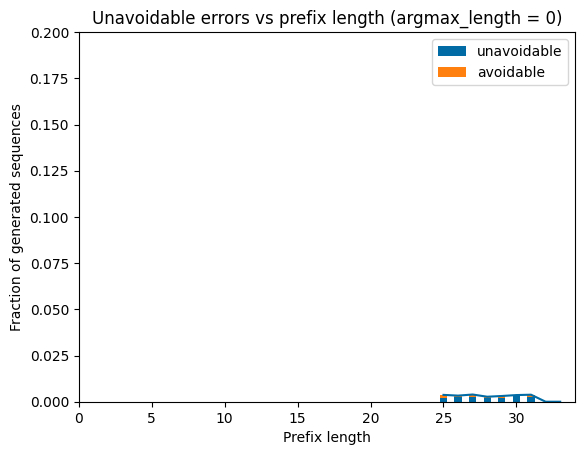

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.9,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6_noargmax',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
        redo_backtrack_with_argmax=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6_noargmax/argmax_length_0_p0.9')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 241


#### stat

In [ ]:
import numpy as np

metrics = [
    233, 258, 252, 245, 241
]

print(f"{'%.1f' % np.mean(metrics)} $\\pm$ {'%.3f' % np.std(metrics)}")

245.8 $\pm$ 8.658


### quota = 1, stride = 4, top p 0.9

Generating sequences: 100%|██████████| 10000/10000 [01:18<00:00, 127.15it/s]


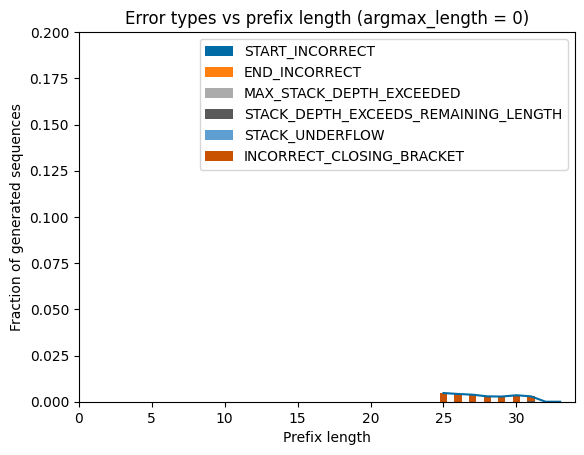

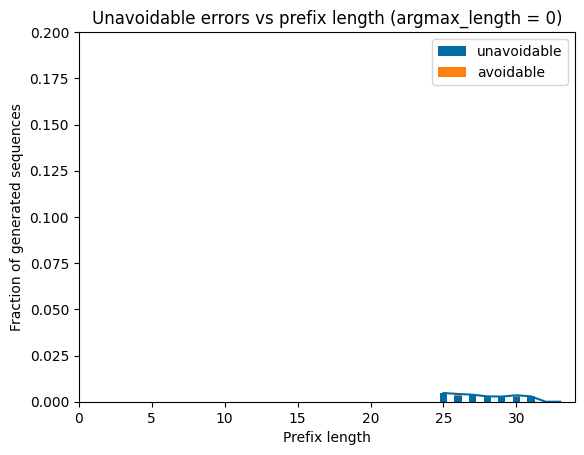

In [ ]:
# run 6
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 1
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        0.9,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=[],
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir='ood_generation_errors_error_pred_quota1stride4/argmax_length_0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1   INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2   INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
3   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
5   INCORRECT_CLOSING_BRACKET      B(([[(([][]((()())(((())))))   
6   INCORRECT_CLOSING_BRACKET       B(()((()(([()(()())()(([]))   
7   INCORRECT_CLOSING_BRACKET     B((([([](((([(()())()()])))))   
8   INCORRECT_CLOSING_BRACKET        B((()[(((((((()(()))))))))   
9   INCORRECT_CLOSING_BRACKET     B((([(([()((((()()))(())))]))   
10  INCORRECT_CLOSING_BRACKET        B()(((((([()(())()((([])))   
11  INCORRECT_CLOSING_BRACKET     B((([((()()()([(()()(()))])))   
12  INCORRECT_CLOSING_BRACKET        B()(())((((((()((()()(()))   
13  INCORRECT_CLOSING_BRACKET        B(((((([[][(((()))())()()

### quota = 4, stride = 4, top p 1.0

#### old run 1

Generating sequences: 100%|██████████| 10000/10000 [01:14<00:00, 134.34it/s]


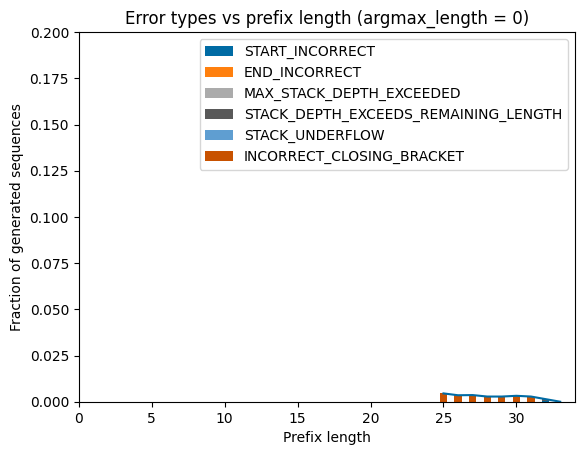

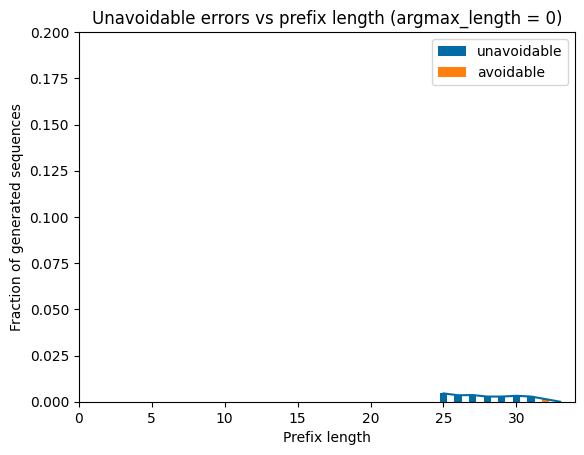

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=[],
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
    ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

                        error                            prefix  \
0   INCORRECT_CLOSING_BRACKET      B()((((((((())))(()(()()()))   
1   INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
2   INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
3   INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
4   INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
5   INCORRECT_CLOSING_BRACKET      B(([[(([][]((()())(((())))))   
6   INCORRECT_CLOSING_BRACKET       B(()((()(([()(()())()(([]))   
7   INCORRECT_CLOSING_BRACKET     B((([([](((([(()())()()])))))   
8   INCORRECT_CLOSING_BRACKET        B((()[(((((((()(()))))))))   
9   INCORRECT_CLOSING_BRACKET     B((([(([()((((()()))(())))]))   
10  INCORRECT_CLOSING_BRACKET        B()(((((([()(())()((([])))   
11  INCORRECT_CLOSING_BRACKET     B((([((()()()([(()()(()))])))   
12  INCORRECT_CLOSING_BRACKET        B()(())((((((()((()()(()))   
13  INCORRECT_CLOSING_BRACKET        B(((((([[][(((()))())()()

#### run 2

Generating sequences: 100%|██████████| 10000/10000 [01:11<00:00, 139.06it/s]


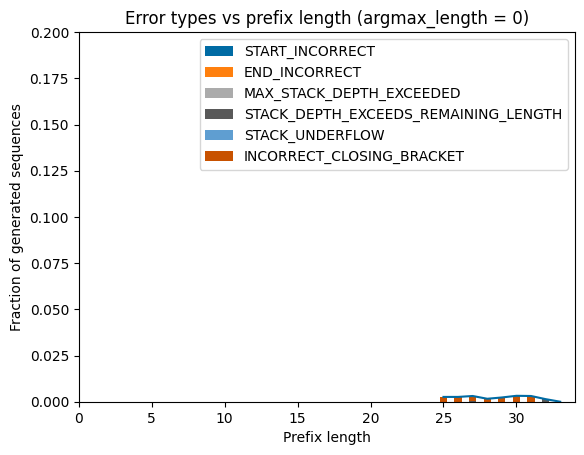

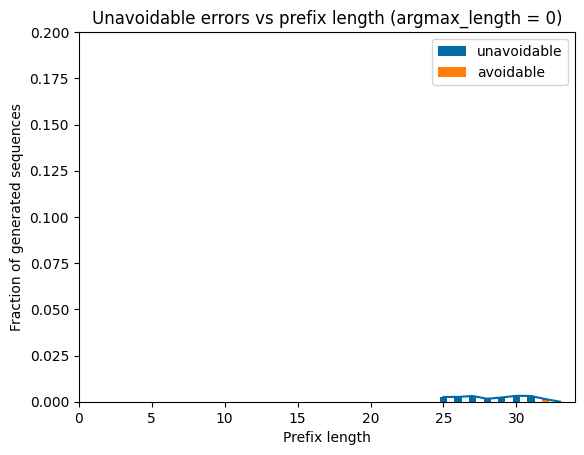

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        1.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 199


#### run 3

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 138.24it/s]


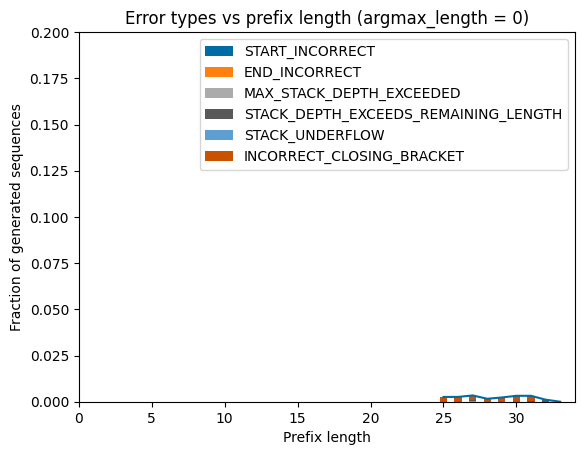

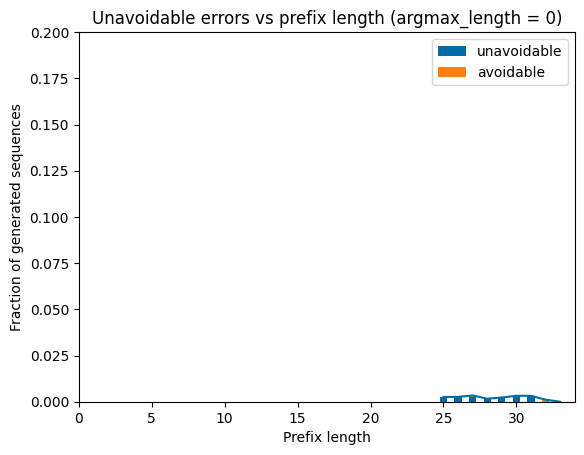

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        1.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run3/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 200


#### run 4

Generating sequences: 100%|██████████| 10000/10000 [01:11<00:00, 140.42it/s]


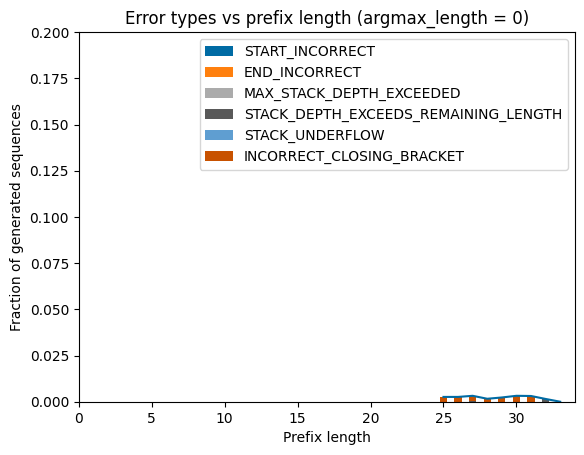

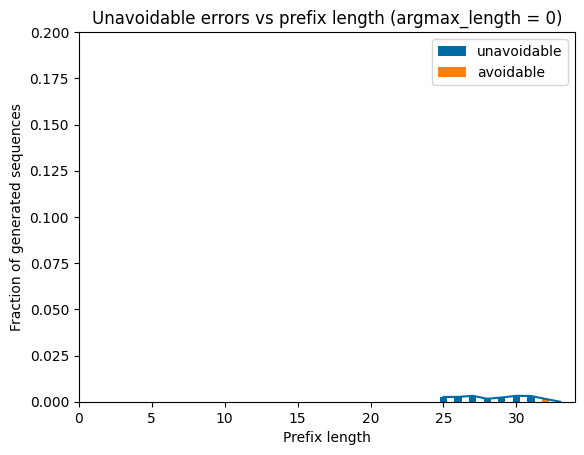

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        1.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run4/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 201


#### run 5

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 137.71it/s]


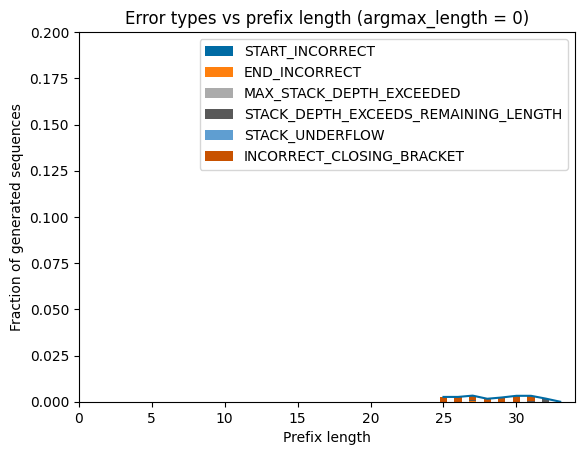

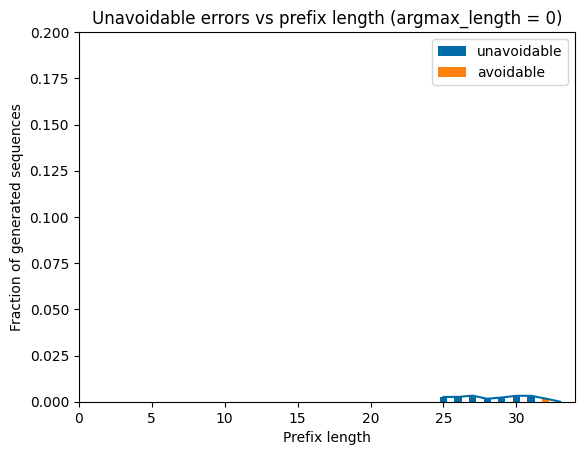

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        1.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run5/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 205


#### run 6

Generating sequences: 100%|██████████| 10000/10000 [01:11<00:00, 139.30it/s]


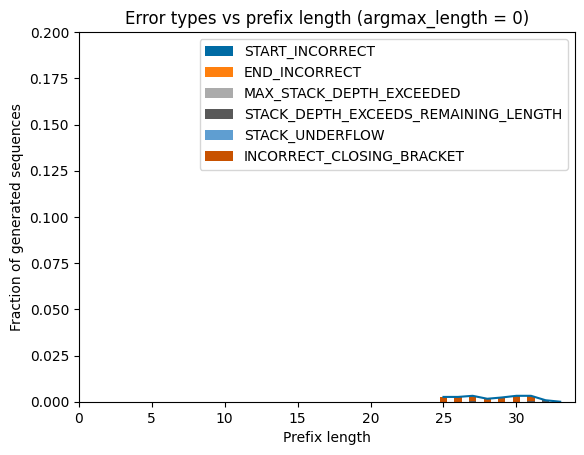

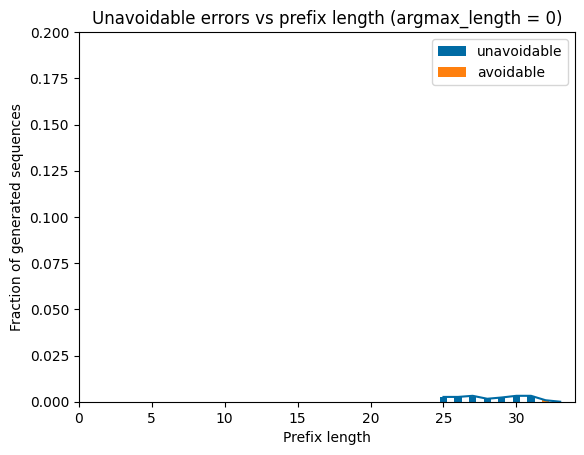

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        1.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run6/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 195


#### stat

In [ ]:
import numpy as np

metrics = [
    199, 200, 201, 205, 195
]

print(f"{'%.1f' % np.mean(metrics)} $\\pm$ {'%.3f' % np.std(metrics)}")

200.0 $\pm$ 3.225


### quota = 4, stride = 4, top p 0.0

#### argmax is deterministic, err pred threshold is 0.5, no randomness involved

Generating sequences: 100%|██████████| 10000/10000 [01:11<00:00, 139.75it/s]


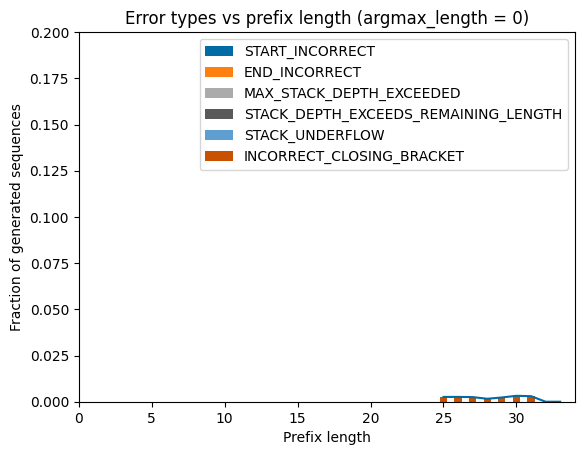

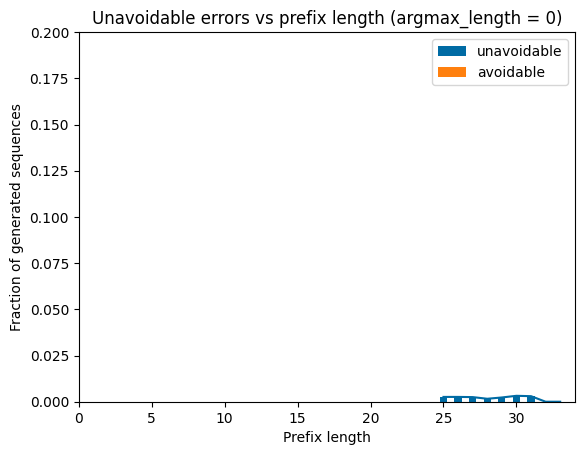

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 4
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,  # batch_size
        0.0,  # top_p
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=None,
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
                                        ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}_run2/argmax_length_0_p0.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    # print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

num_errors_err_pred 178


### quota = 1, stride = 4, top p 1.0

Generating sequences: 100%|██████████| 10000/10000 [01:12<00:00, 138.83it/s]


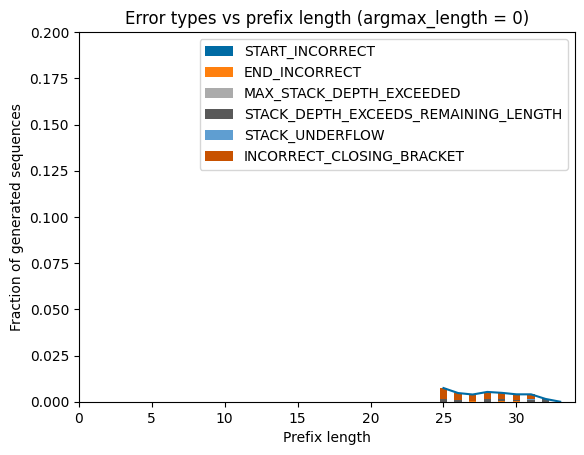

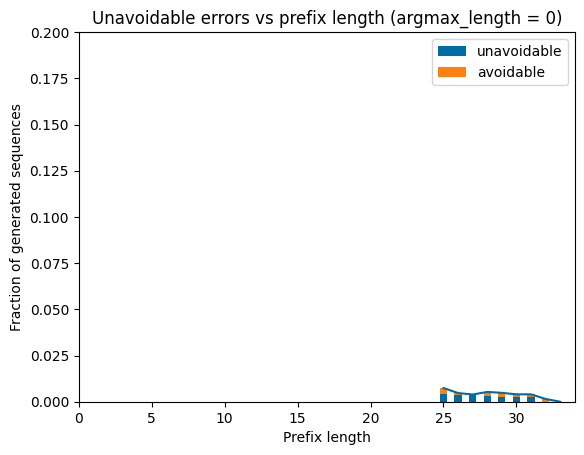

In [ ]:
from error_analysis import analyze_and_save_errors, analyze_and_save_ood_errors

backtrack_quota = 1
backtrack_stride = 4

with torch.no_grad():
    analyze_and_save_ood_errors(
        ood_sequences,
        dyck_ood_eval,
        model,
        1,
        1.0,
        eval_dir,
        argmax_length=0,
        min_prefix_len=25,
        ood_generation_errors_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}',
        backtrack_quota=backtrack_quota,
        backtrack_stride=backtrack_stride,
        max_allowed_prefix_truncation=0,
        backtracked_prefixes=[],
        model_err_pred=model_err_pred,
        allow_2nd_backtrack_at_same_prefix=False,
    )

In [ ]:
ood_results_err_pred = load_ood_results(config_file_path, experiment_index, 0.9, best_or_final_checkpoint='final',
    ood_eval_dir=f'ood_generation_errors_error_pred_quota{backtrack_quota}stride{backtrack_stride}/argmax_length_0_p1.0')

../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/0


In [ ]:
sorted(ood_results_err_pred.keys())

[25, 26, 27, 28, 29, 30, 31, 32]

In [ ]:
num_errors_err_pred = 0
for prefix_length in ood_results_err_pred:
    print(ood_results_err_pred[prefix_length])
    num_errors_err_pred += len(ood_results_err_pred[prefix_length])
print('num_errors_err_pred', num_errors_err_pred)

                                   error                            prefix  \
0              INCORRECT_CLOSING_BRACKET        B()()(()(()()())(()(()((((   
1              INCORRECT_CLOSING_BRACKET      B(([(()((((()))())([(())])))   
2              INCORRECT_CLOSING_BRACKET     B(()(([((((())((((()))))())))   
3              INCORRECT_CLOSING_BRACKET      B(()(((([()])[()][])[([(())]   
4              INCORRECT_CLOSING_BRACKET        B(((((([()[()]()()[](([]))   
..                                   ...                               ...   
69             INCORRECT_CLOSING_BRACKET      B(([()((()((((()))(()())))))   
70             INCORRECT_CLOSING_BRACKET  B((())(([[[]]]([(()[])]()[])[]))   
71  STACK_DEPTH_EXCEEDS_REMAINING_LENGTH  B(([(())()](([])())))((()())([])   
72  STACK_DEPTH_EXCEEDS_REMAINING_LENGTH     B()[((())(())(([(((((())))))]   
73  STACK_DEPTH_EXCEEDS_REMAINING_LENGTH    B(())()((()(()))(()))()((())((   

   generated_token  generated_token_prob most_probable_token  \

## Check diversity

In [ ]:
len(ood_sequences)

10000

In [ ]:
# backtrack_quota=4, backtrack_stride=4,

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=1,
                        top_p=0.9,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=4,
                        backtrack_stride=4,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=[],
                        model_err_pred=model_err_pred,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(1.77, 1.147649772360889)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(6, 1)

In [ ]:
# backtrack_quota=1, backtrack_stride=4,

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=1,
                        top_p=0.9,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=1,
                        backtrack_stride=4,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=[],
                        model_err_pred=model_err_pred,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(5.0, 2.701851217221259)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(9, 1)

In [ ]:
# backtrack_quota=4, backtrack_stride=4, top p 1.0

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=1,
                        top_p=1.0,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=4,
                        backtrack_stride=4,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=[],
                        model_err_pred=model_err_pred,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(5.52, 3.281706872954987)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(10, 1)

In [ ]:
# backtrack_quota=1, backtrack_stride=4, top p 1.0

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=1,
                        top_p=1.0,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=1,
                        backtrack_stride=4,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=[],
                        model_err_pred=model_err_pred,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(5.88, 3.314453197738656)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(10, 1)

In [ ]:
# baseline: no backtracking, sampling top p 0.9

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=1,
                        top_p=0.9,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=0,
                        backtrack_stride=0,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=[],
                        model_err_pred=model_err_pred,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 13.96it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(5.47, 3.064163833739965)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(10, 1)

In [ ]:
# baseline: no backtracking, sampling top p 1.0

from distributions import conditional_nn_generate

num_completions_per_seq = 10

num_diff_completions = []
for seq in ood_sequences[:100]:
    prefix = seq['tokens']
    diff_completions = set()
    for _ in range(num_completions_per_seq):
        ood_generations = conditional_nn_generate(
                        dyck_ood_eval,
                        model,
                        prefix_sequences=[prefix],
                        batch_size=128,
                        top_p=1.0,
                        prefix_length=25,
                        argmax_length=0,
                        backtrack_quota=0,
                        backtrack_stride=0,
                        max_allowed_prefix_truncation=0,
                        backtracked_prefixes=None,
                        model_err_pred=None,
                        allow_2nd_backtrack_at_same_prefix=False,
                    )
        diff_completions.add(
            tuple(ood_generations[0]['tokens'])
        )
    num_diff_completions.append(len(diff_completions))


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 14.84it/s]


In [ ]:
import numpy as np

np.mean(num_diff_completions), np.std(num_diff_completions)

(5.84, 3.2915649773322113)

In [ ]:
max(num_diff_completions), min(num_diff_completions)

(10, 1)

## Why did model still make mistakes

In [ ]:
ood_results_err_pred[25]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B()((((((((())))(()(()()())),],0.511796,],0.511796,0
1,INCORRECT_CLOSING_BRACKET,B()()(()(()()())(()(()((((,],0.524257,],0.524257,0
2,INCORRECT_CLOSING_BRACKET,B(([(()((((()))())([(())]))),),0.497768,),0.497768,0
3,INCORRECT_CLOSING_BRACKET,B(()(([((((())((((()))))()))),),0.999239,),0.999239,0
4,INCORRECT_CLOSING_BRACKET,B(((((([()[()]()()[](([])),),0.625865,),0.625865,0
5,INCORRECT_CLOSING_BRACKET,B(([[(([][]((()())(((()))))),],0.992980,],0.992980,0
6,INCORRECT_CLOSING_BRACKET,B(()((()(([()(()())()(([])),),0.867438,),0.867438,0
7,INCORRECT_CLOSING_BRACKET,B((([([](((([(()())()()]))))),),0.944017,),0.944017,0
8,INCORRECT_CLOSING_BRACKET,B((()[(((((((()(())))))))),),0.517987,),0.517987,0
9,INCORRECT_CLOSING_BRACKET,B((([(([()((((()()))(())))])),),0.977405,),0.977405,0


In [ ]:
ood_results_err_pred[26]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B()((((((((())))(()(()()())),],0.511796,],0.511796,0
1,INCORRECT_CLOSING_BRACKET,B(()(([((((())((((()))))()))),),0.999239,),0.999239,0
2,INCORRECT_CLOSING_BRACKET,B(([[(([][]((()())(((()))))),],0.992980,],0.992980,0
3,INCORRECT_CLOSING_BRACKET,B(()((()(([()(()())()(([])),),0.867438,),0.867438,0
4,INCORRECT_CLOSING_BRACKET,B((([([](((([(()())()()]))))),),0.944017,),0.944017,0
5,INCORRECT_CLOSING_BRACKET,B((([(([()((((()()))(())))])),),0.977405,),0.977405,0
6,INCORRECT_CLOSING_BRACKET,B((([((()()()([(()()(()))]))),),0.979017,),0.979017,0
7,INCORRECT_CLOSING_BRACKET,B(()(([([()[(((()))()[]())]]),),0.931434,),0.931434,0
8,INCORRECT_CLOSING_BRACKET,B[((([[]((((())((())(()))))),),0.984556,),0.984556,0
9,INCORRECT_CLOSING_BRACKET,B()[(([(((((((()()))[]()))))),),0.999448,),0.999448,0


In [ ]:
ood_results_err_pred[27]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B()((((((((())))(()(()()())),],0.511796,],0.511796,0
1,INCORRECT_CLOSING_BRACKET,B(()(([((((())((((()))))()))),),0.999239,),0.999239,0
2,INCORRECT_CLOSING_BRACKET,B(([[(([][]((()())(((()))))),],0.992980,],0.992980,0
3,INCORRECT_CLOSING_BRACKET,B((([([](((([(()())()()]))))),),0.944017,),0.944017,0
4,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475,0
5,INCORRECT_CLOSING_BRACKET,B((([(([()((((()()))(())))])),),0.977405,),0.977405,0
6,INCORRECT_CLOSING_BRACKET,B((([((()()()([(()()(()))]))),),0.979017,),0.979017,0
7,INCORRECT_CLOSING_BRACKET,B(()(([([()[(((()))()[]())]]),),0.931434,),0.931434,0
8,INCORRECT_CLOSING_BRACKET,B[((([[]((((())((())(()))))),),0.984556,),0.984556,0
9,INCORRECT_CLOSING_BRACKET,B()[(([(((((((()()))[]()))))),),0.999448,),0.999448,0


In [ ]:
ood_results_err_pred[28]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B(()(([((((())((((()))))()))),),0.999239,),0.999239,0
1,INCORRECT_CLOSING_BRACKET,B((([([](((([(()())()()]))))),),0.944017,),0.944017,0
2,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475,0
3,INCORRECT_CLOSING_BRACKET,B((([(([()((((()()))(())))])),),0.977405,),0.977405,0
4,INCORRECT_CLOSING_BRACKET,B(()[((()((()()))())[])](([]())),],0.869623,],0.869623,0
5,INCORRECT_CLOSING_BRACKET,B((([((()()()([(()()(()))]))),),0.979017,),0.979017,0
6,INCORRECT_CLOSING_BRACKET,B(()(([([()[(((()))()[]())]]),),0.931434,),0.931434,0
7,INCORRECT_CLOSING_BRACKET,B()[(([(((((((()()))[]()))))),),0.999448,),0.999448,0
8,INCORRECT_CLOSING_BRACKET,B(((()))()()()(()((((())())()))),],0.965299,],0.965299,0
9,INCORRECT_CLOSING_BRACKET,B()((([(([(())]())())()((())),),0.977660,),0.977660,0


In [ ]:
ood_results_err_pred[29]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B(((([(([([])()]))]())))([]()()),],0.998425,],0.998425,0
1,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475,0
2,INCORRECT_CLOSING_BRACKET,B[(()()()()()((())[()()[]()])(),],0.841387,],0.841387,0
3,INCORRECT_CLOSING_BRACKET,B(()[((()((()()))())[])](([]())),],0.869623,],0.869623,0
4,INCORRECT_CLOSING_BRACKET,B(()(()((()()()())(())))[]()(()),],0.782469,],0.782469,0
5,INCORRECT_CLOSING_BRACKET,B(((((()([]()))))()())()([][]()),],0.941579,],0.941579,0
6,INCORRECT_CLOSING_BRACKET,B(()(()((()([]([]))))())()(()()),],0.997442,],0.997442,0
7,INCORRECT_CLOSING_BRACKET,B(((()))()()()(()((((())())()))),],0.965299,],0.965299,0
8,INCORRECT_CLOSING_BRACKET,B([((()))(()((())(())())[])](()),],0.523672,],0.523672,0
9,INCORRECT_CLOSING_BRACKET,B(()(([][])()()()()[](()()))(()),],0.638692,],0.638692,0


In [ ]:
ood_results_err_pred[30]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B(((([(([([])()]))]())))([]()()),],0.998425,],0.998425,0
1,INCORRECT_CLOSING_BRACKET,B([()](((((()))((()()())))()))(),],0.901743,],0.901743,0
2,INCORRECT_CLOSING_BRACKET,B(()((()[])(()))()((())())(())(),],0.684750,],0.684750,0
3,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475,0
4,INCORRECT_CLOSING_BRACKET,B(([[((([])()()))](())])(()())(),],0.994803,],0.994803,0
5,INCORRECT_CLOSING_BRACKET,B(()()(()(()(()(()()())(()))))(),],0.987031,],0.987031,0
6,INCORRECT_CLOSING_BRACKET,B[(()()()()()((())[()()[]()])(),],0.841387,],0.841387,0
7,INCORRECT_CLOSING_BRACKET,B(()[((()((()()))())[])](([]())),],0.869623,],0.869623,0
8,INCORRECT_CLOSING_BRACKET,B(()(()((()()()())(())))[]()(()),],0.782469,],0.782469,0
9,INCORRECT_CLOSING_BRACKET,B[]((((([][()])()(())))))()[]((),],0.802167,],0.802167,0


In [ ]:
ood_results_err_pred[31]

,error,prefix,generated_token,generated_token_prob,most_probable_token,most_probable_token_prob,backtrack_quota
0,INCORRECT_CLOSING_BRACKET,B(((([(([([])()]))]())))([]()()),],0.998425,],0.998425,0
1,INCORRECT_CLOSING_BRACKET,B([()](((((()))((()()())))()))(),],0.901743,],0.901743,0
2,INCORRECT_CLOSING_BRACKET,B(()((()[])(()))()((())())(())(),],0.684750,],0.684750,0
3,INCORRECT_CLOSING_BRACKET,B(((())()(()))(()(())()((()()))),],0.699475,],0.699475,0
4,INCORRECT_CLOSING_BRACKET,B(([[((([])()()))](())])(()())(),],0.994803,],0.994803,0
5,INCORRECT_CLOSING_BRACKET,B(()()(()(()(()(()()())(()))))(),],0.987031,],0.987031,0
6,INCORRECT_CLOSING_BRACKET,B(()[((()((()()))())[])](([]())),],0.869623,],0.869623,0
7,INCORRECT_CLOSING_BRACKET,B(()(()((()()()())(())))[]()(()),],0.782469,],0.782469,0
8,INCORRECT_CLOSING_BRACKET,B[]((((([][()])()(())))))()[]((),],0.802167,],0.802167,0
9,INCORRECT_CLOSING_BRACKET,B(((((()([]()))))()())()([][]()),],0.941579,],0.941579,0


In [ ]:
mistake_prefixes = []
for prefix_len in ood_results_err_pred:
    for i in range(len(ood_results_err_pred[prefix_len])):
        mistake_prefix = ood_results_err_pred[prefix_len]['prefix'][i] + ood_results_err_pred[prefix_len]['generated_token'][i]
        assert not dyck_train.accept_prefix(dyck_train.tokenize(mistake_prefix))
        mistake_prefixes.append(dyck_train.tokenize(mistake_prefix))
print(len(mistake_prefixes))

233


In [ ]:
import torch

from distributions import nn_intermediates

mistake_prefix_reps = [
    nn_intermediates(
        model,
        torch.tensor([mistake_prefix]),
        batch_size=1,
        positions='last',
    )
    for mistake_prefix in mistake_prefixes
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0]), len(mistake_prefix_reps[0][0])

(233, 1, 512)

In [ ]:
mistake_prefix_reps = [
    rep[0]
    for rep in mistake_prefix_reps
]

In [ ]:
len(mistake_prefix_reps), len(mistake_prefix_reps[0])

(233, 512)

In [ ]:
test_data = [
    [1] + rep
    for rep in mistake_prefix_reps
]

In [ ]:
test_data = torch.tensor(test_data)

print(test_data.shape)

torch.Size([233, 513])


In [ ]:
test_loader = DataLoader(test_set,  batch_size=batch_size, shuffle=False)

In [ ]:
test(model_err_pred, test_loader, criterion, device)

Test Loss   0.21 | test acc 0.93


In [ ]:
prefix_sequences = []
for prefix_len in ood_results_err_pred:
    for p in ood_results_err_pred[prefix_len]['prefix']:
        prefix_sequences.append(
            dyck_train.tokenize(p)
        )
len(prefix_sequences)

233

In [ ]:
from distributions import sample_top_p, nn_next_token_probs, conditional_nn_generate
from tqdm import tqdm
from collections import defaultdict
import numpy as np
import torch


def conditional_nn_generate_with_predicted_backtrack_diverse(
    dyck,
    model,
    model_err_pred,
    prefix_sequences,
    batch_size=1,
    top_p=None,
    prefix_length=None,
    argmax_length=0,
    backtracked_prefixes=[],
    backtrack_quota=1,
    backtrack_stride=3,
):
    model.eval()
    output = []

    num_sequences = len(prefix_sequences)
    prefix_length = prefix_length or len(prefix_sequences[0]) - 1

    seq_length = dyck.length + 2  # <bos>='B' + length + <eos>='E'

    # Calculate the number of chunks we'll need
    num_chunks = (num_sequences + batch_size - 1) // batch_size

    i = 0

    for _ in tqdm(range(num_chunks), desc="Generating sequences"):
        current_batch_size = min(batch_size, num_sequences - len(output))
        batch_seqs = []

        for _ in range(current_batch_size):
            batch_seqs.append(prefix_sequences[i][:prefix_length + 1])
            i += 1

        batch_tensor = torch.tensor(batch_seqs).cuda()
        preds = model(batch_tensor)
        # Calculate log probabilities for the prefix
        batch_log_probs = torch.log_softmax(preds, dim=-1).gather(2, batch_tensor[:, 1:].unsqueeze(-1)).sum(dim=1).reshape(-1)
        batch_log_probs = batch_log_probs.tolist()

        del batch_tensor

        gen_idx = 0
        step = 1 + prefix_length
        while step < seq_length:
            if backtrack_quota > 0:
                all_intermediates = nn_intermediates(model, batch_seqs, batch_size=batch_size, positions='last')
                err_pred_output = model_err_pred(torch.tensor(all_intermediates).to(device))
                err_pred = err_pred_output.argmax(dim=-1)
                if torch.any(err_pred):
                    # backtrack
                    backtracked_prefixes.append(batch_seqs)
                    batch_seqs = [
                        batch_seq[:-backtrack_stride]
                        for batch_seq in batch_seqs
                    ]
                    gen_idx -= backtrack_stride
                    step -= backtrack_stride
                    argmax_length += backtrack_stride
                    backtrack_quota -= 1

            batch_tensor = torch.tensor(batch_seqs).cuda()
            preds = model(batch_tensor)
            p = 0.0 if gen_idx < argmax_length else top_p
            next_tokens, log_probs = sample_top_p(preds, p, step)

            # Update sequences and log probs
            for j in range(current_batch_size):
                batch_seqs[j].append(next_tokens[j].item())
                batch_log_probs[j] += log_probs[j].item()

            del preds
            del batch_tensor

            gen_idx += 1
            step += 1

        # Add to the final output
        for j in range(current_batch_size):
            output.append({'tokens': batch_seqs[j], 'log_prob_truncated': batch_log_probs[j], 'remaining_backtrack_quota': backtrack_quota})

    return output, backtracked_prefixes

In [ ]:
remaining_backtrack_quotas = []

for p in prefix_sequences:
    ood_generations, _ = conditional_nn_generate_with_predicted_backtrack_diverse(
                    dyck_train,
                    model,
                    model_err_pred,
                    [p],
                    batch_size=1,
                    top_p=0.9,
                    prefix_length=None,
                    argmax_length=0,
                    backtracked_prefixes=[],
                    backtrack_quota=4,
                    backtrack_stride=4,
                )
    remaining_backtrack_quotas.append(
        ood_generations[0]['remaining_backtrack_quota']
    )


Generating sequences: 100%|██████████| 1/1 [00:00<00:00, 38.62it/s]


In [ ]:
remaining_backtrack_quotas

[0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 3,
 0,
 1,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 3,
 3,
 2,
 0,
 3,
 3,
 3,
 4,
 3,
 0,
 3,
 1,
 0,
 3,
 0,
 4,
 0,
 3,
 3,
 1,
 3,
 3,
 0,
 0,
 1,
 3,
 2,
 0,
 1,
 0,
 0,
 1,
 3,
 3,
 3,
 2,
 0,
 3,
 3,
 3,
 4,
 3,
 0,
 3,
 1,
 3,
 0,
 0,
 4,
 3,
 3,
 1,
 0,
 3,
 3,
 0,
 1,
 3,
 2,
 0,
 1,
 0,
 1,
 3,
 3,
 3,
 2,
 0,
 3,
 3,
 3,
 3,
 0,
 1,
 3,
 0,
 0,
 3,
 3,
 1,
 0,
 3,
 3,
 0,
 4]

# Check support

In [ ]:
length

32

In [ ]:
def check_prefix_support(ds, num_samples):
    assert num_samples <= len(ds)
    support = [set() for _ in range(length + 1)]

    for i in range(num_samples):
        seq = tuple(ds[i]['tokens'][1:-1].tolist())
        for prefix_len in range(1, length + 1):
            support[prefix_len].add(seq[:prefix_len])

    support_size = [
        len(support[prefix_len])
        for prefix_len in range(length + 1)
    ]

    return support, support_size


In [ ]:
len(ds_train)

300000

In [ ]:
support_train, support_size_train = check_prefix_support(ds_train, len(ds_train))

In [ ]:
support_size_train

[0,
 2,
 6,
 16,
 48,
 136,
 407,
 1151,
 3172,
 7839,
 17822,
 34676,
 61278,
 94431,
 134800,
 172508,
 210388,
 237669,
 261423,
 275274,
 286343,
 291753,
 295878,
 297588,
 298855,
 299368,
 299719,
 299837,
 299899,
 299921,
 299939,
 299943,
 299943]

## repeat 3, final_ema, top_p = 0.9

In [ ]:
import pickle


config_file_path = config_file_paths[0]
experiment_index = 3  # 0

model_save_dir = args['reporting']['reporting_loc'] + str(experiment_index)
best_or_final_checkpoint = 'final_ema'  # 'final'
model_save_path = os.path.join(model_save_dir, f'{best_or_final_checkpoint}.pkl')

with open(model_save_path, 'rb') as f:
    model = pickle.load(f)

top_p = 0.9  # 1.0
eval_dir = os.path.join(model_save_dir, f'generated_{best_or_final_checkpoint}_p{top_p}/')


In [ ]:
eval_dir

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/3/generated_final_ema_p0.9/'

In [ ]:
from run_lm import generate_sequences
from distributions import nn_log_probs


generated_data_path = os.path.join(eval_dir, f'generated_p{top_p}.pkl')
ds_generated, sequences = generate_sequences(
    generated_data_path,
    dyck_train,
    model,
    args,
    top_p,
)

Loading ds_generated from ../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/3/generated_final_ema_p0.9/generated_p0.9.pkl
len(sequences) 10000
sequences[0] {'tokens': [4, 1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3, 1, 3, 3, 3, 3, 5], 'log_prob_truncated': -17.68578776717186}


In [ ]:
assert len(ds_generated) == len(ds_eval)

ds_eval_shuffled = ds_eval.shuffle()
ds_eval_shuffled = ds_eval_shuffled.flatten_indices()

all_support_size_generated = {}  # all_support_size_generated[num_samples][prefix_len]
all_support_size_eval = {}

for num_samples in [10, 100, 1000, 10000]:
    assert num_samples <= len(ds_eval_shuffled)
    support_generated, support_size_generated = check_prefix_support(ds_generated, num_samples)
    support_eval, support_size_eval = check_prefix_support(ds_eval_shuffled, num_samples)

    all_support_size_generated[num_samples] = support_size_generated
    all_support_size_eval[num_samples] = support_size_eval

Flattening the indices:   0%|          | 0/10000 [00:00<?, ? examples/s]

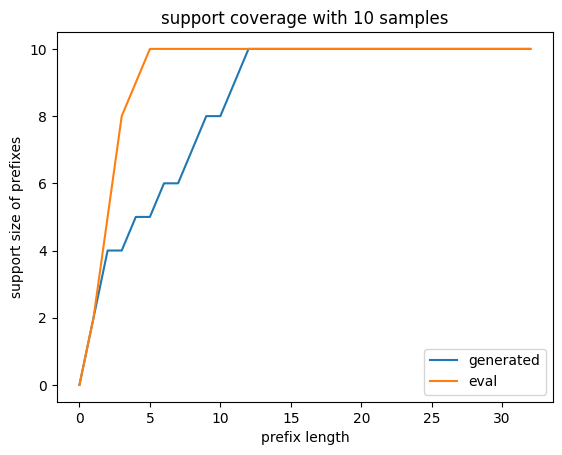

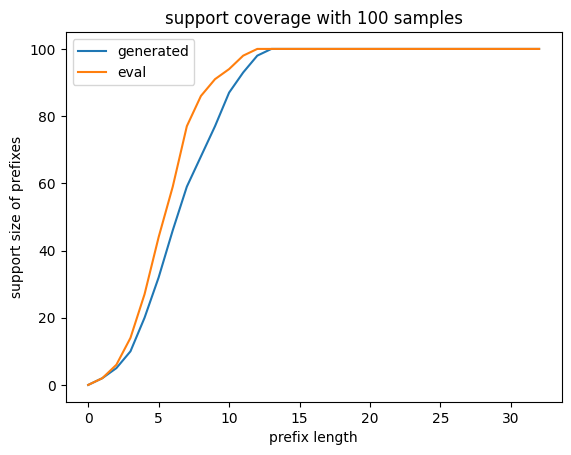

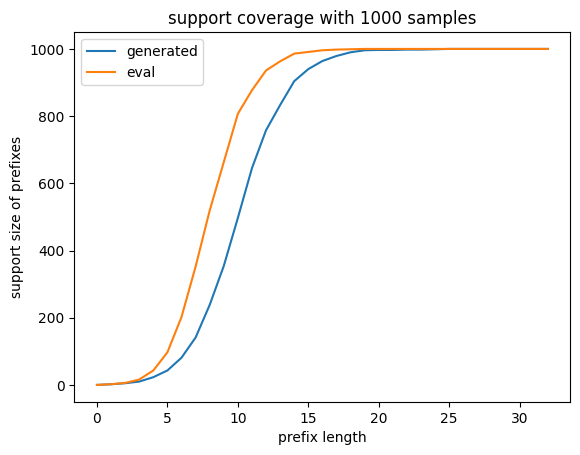

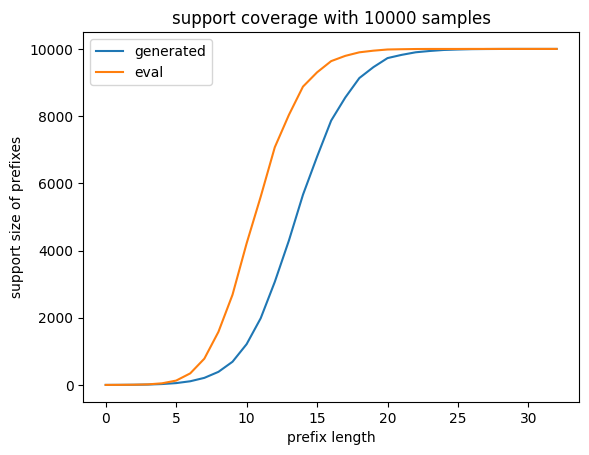

In [ ]:
import matplotlib.pyplot as plt

for num_samples in [10, 100, 1000, 10000]:
    plt.figure()
    plt.plot(range(length+1), all_support_size_generated[num_samples], label='generated')
    plt.plot(range(length+1), all_support_size_eval[num_samples], label='eval')
    # plt.plot(range(length+1), support_size_train, label='train')
    plt.legend()
    plt.xlabel('prefix length')
    plt.ylabel('support size of prefixes')
    plt.title(f'support coverage with {num_samples} samples')

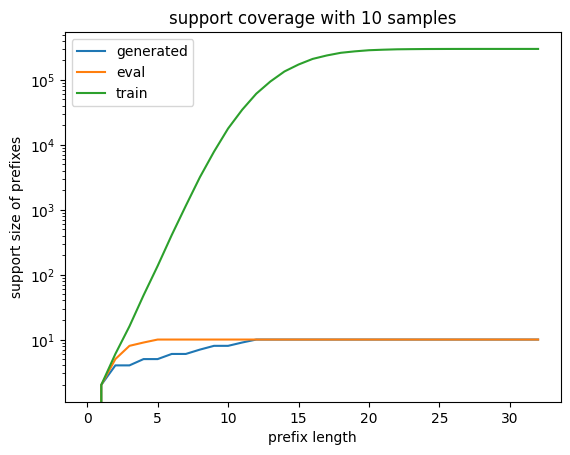

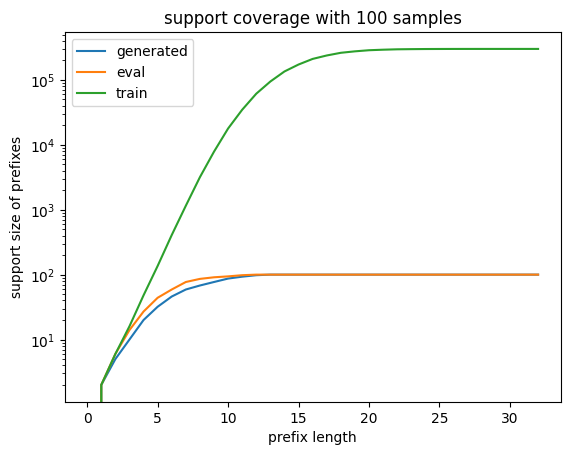

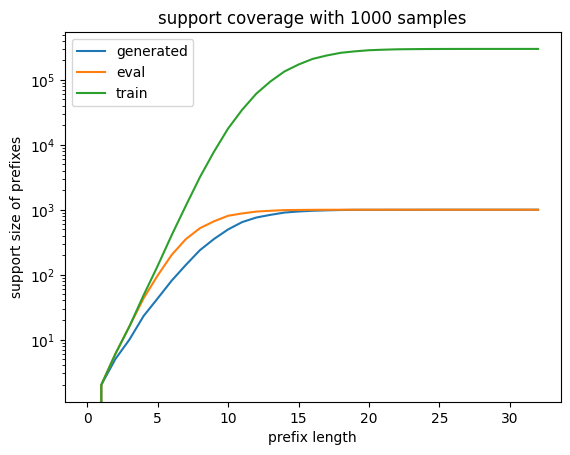

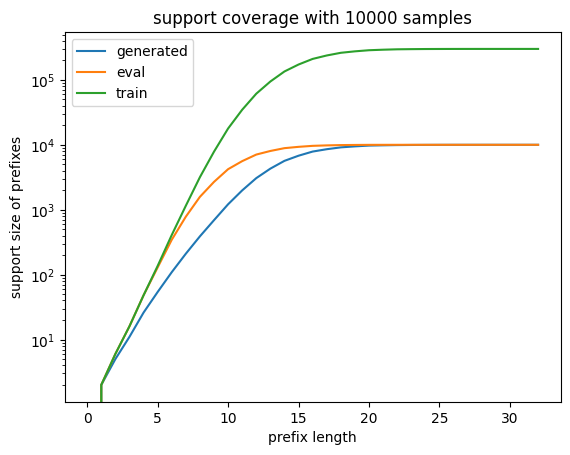

In [ ]:
for num_samples in [10, 100, 1000, 10000]:
    plt.figure()
    plt.plot(range(length+1), all_support_size_generated[num_samples], label='generated')
    plt.plot(range(length+1), all_support_size_eval[num_samples], label='eval')
    plt.plot(range(length+1), support_size_train, label='train')
    plt.legend()
    plt.xlabel('prefix length')
    plt.ylabel('support size of prefixes')
    plt.yscale('log')
    plt.title(f'support coverage with {num_samples} samples')

### Check for new sequences

In [ ]:
for i in range(1):  # len(ds_generated)
    seq = ds_generated[i]['tokens'][1:-1].tolist()
    seq_with_bos = [4] + seq
    for prefix_len in range(1, length + 1):
        # print(dyck_eval.accept_prefix(seq_with_bos))

        if dyck_eval.accept_prefix(seq_with_bos[:prefix_len+1]) and tuple(seq[:prefix_len]) not in support_train[prefix_len]:
            print(tuple(seq[:prefix_len]))
            print(dyck_eval.detokenize(seq[:prefix_len]))


(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1)
[[[][]]][][[][][]][[[
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1)
[[[][]]][][[][][]][[[[
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1)
[[[][]]][][[][][]][[[[[
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3)
[[[][]]][][[][][]][[[[[]
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1)
[[[][]]][][[][][]][[[[[][
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3)
[[[][]]][][[][][]][[[[[][]
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3)
[[[][]]][][[][][]][[[[[][]]
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3, 1)
[[[][]]][][[][][]][[[[[][]][
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3, 1, 3)
[[[][]]][][[][][]][[[[[][]][]
(1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3, 

In [ ]:
total_cnt = 0
new_cnt = 0
prefix_total_cnt = defaultdict(int)
prefix_new_cnt = defaultdict(int)

for i in range(len(ds_generated)):
    seq = ds_generated[i]['tokens'][1:-1].tolist()
    seq_with_bos = [4] + seq
    for prefix_len in range(1, length + 1):
        total_cnt += 1
        prefix_total_cnt[prefix_len] += 1

        # print(dyck_eval.accept_prefix(seq_with_bos))
        if dyck_eval.accept_prefix(seq_with_bos[:prefix_len+1]) and tuple(seq[:prefix_len]) not in support_train[prefix_len]:
            # print(dyck_eval.detokenize(seq[:prefix_len]))
            new_cnt += 1
            prefix_new_cnt[prefix_len] += 1

print('total_cnt', total_cnt)
print('new_cnt', new_cnt)
print('new_cnt / total_cnt', new_cnt / total_cnt)

total_cnt 320000
new_cnt 144129
new_cnt / total_cnt 0.450403125


In [ ]:
new_probs = [
    prefix_new_cnt[prefix_len] / prefix_total_cnt[prefix_len]
    for prefix_len in range(1, length + 1)
]
new_probs

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0001,
 0.0002,
 0.0006,
 0.0028,
 0.0085,
 0.0239,
 0.0545,
 0.1194,
 0.2318,
 0.3724,
 0.5276,
 0.6496,
 0.7702,
 0.848,
 0.9162,
 0.9505,
 0.9744,
 0.9843,
 0.9912,
 0.9949,
 0.9975,
 0.9983,
 0.9986,
 0.9987,
 0.9987]

Text(0.5, 1.0, 'fraction of new prefixes not in training set')

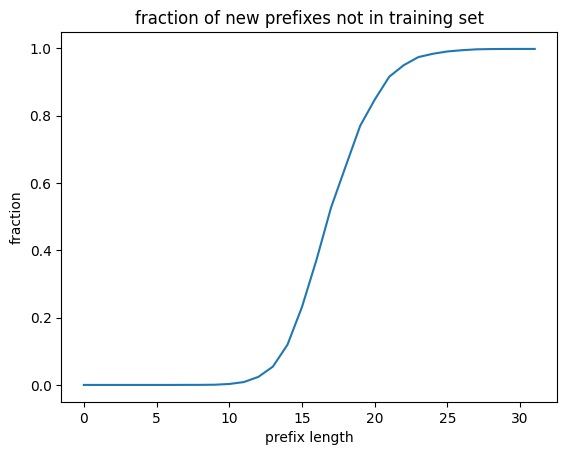

In [ ]:
plt.figure()
plt.plot(range(length), new_probs)
plt.xlabel('prefix length')
plt.ylabel('fraction')
plt.title('fraction of new prefixes not in training set')

## repeat 3, final_ema, top_p = 1.0

In [ ]:
import pickle


config_file_path = config_file_paths[0]
experiment_index = 3  # 0

model_save_dir = args['reporting']['reporting_loc'] + str(experiment_index)
best_or_final_checkpoint = 'final_ema'  # 'final'
model_save_path = os.path.join(model_save_dir, f'{best_or_final_checkpoint}.pkl')

with open(model_save_path, 'rb') as f:
    model = pickle.load(f)

top_p = 1.0
eval_dir = os.path.join(model_save_dir, f'generated_{best_or_final_checkpoint}_p{top_p}/')


In [ ]:
eval_dir

'../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/3/generated_final_ema_p1.0/'

In [ ]:
from run_lm import generate_sequences
from distributions import nn_log_probs


generated_data_path = os.path.join(eval_dir, f'generated_p{top_p}.pkl')
ds_generated, sequences = generate_sequences(
    generated_data_path,
    dyck_train,
    model,
    args,
    top_p,
)

Loading ds_generated from ../trained_models/dyck_k2_0.2_0.8_m12_len32/dim512_depth12_heads8/batch32_lr0.0003_wd0.1_warmup100/3/generated_final_ema_p1.0/generated_p1.0.pkl
len(sequences) 10000
sequences[0] {'tokens': [4, 1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 5], 'log_prob_truncated': -20.919323921723844}


In [ ]:
assert len(ds_generated) == len(ds_eval)

ds_eval_shuffled = ds_eval.shuffle()
ds_eval_shuffled = ds_eval_shuffled.flatten_indices()

all_support_size_generated = {}  # all_support_size_generated[num_samples][prefix_len]
all_support_size_eval = {}

for num_samples in [10, 100, 1000, 10000]:
    assert num_samples <= len(ds_eval_shuffled)
    support_generated, support_size_generated = check_prefix_support(ds_generated, num_samples)
    support_eval, support_size_eval = check_prefix_support(ds_eval_shuffled, num_samples)

    all_support_size_generated[num_samples] = support_size_generated
    all_support_size_eval[num_samples] = support_size_eval

Flattening the indices:   0%|          | 0/10000 [00:00<?, ? examples/s]

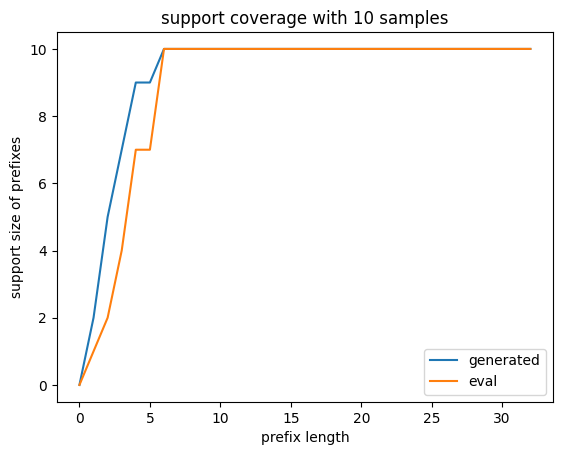

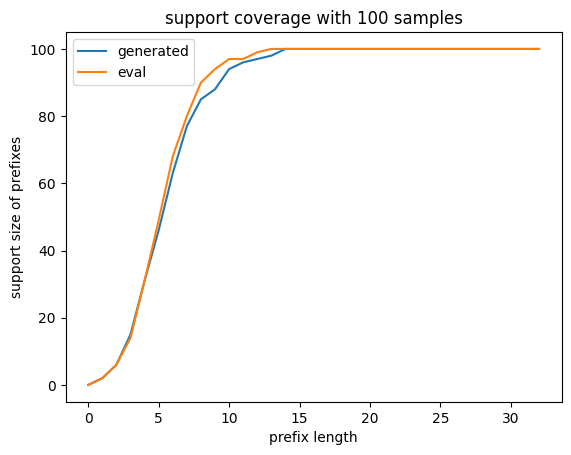

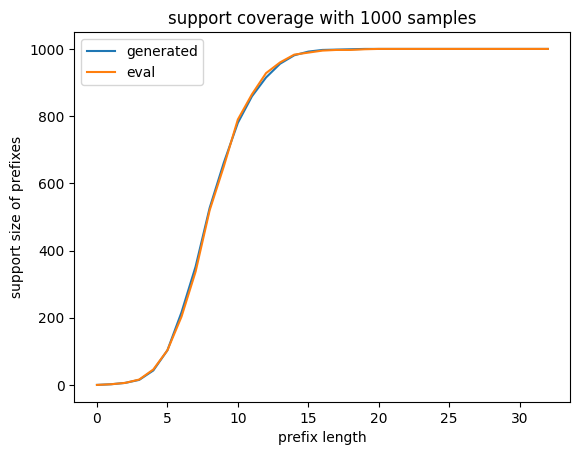

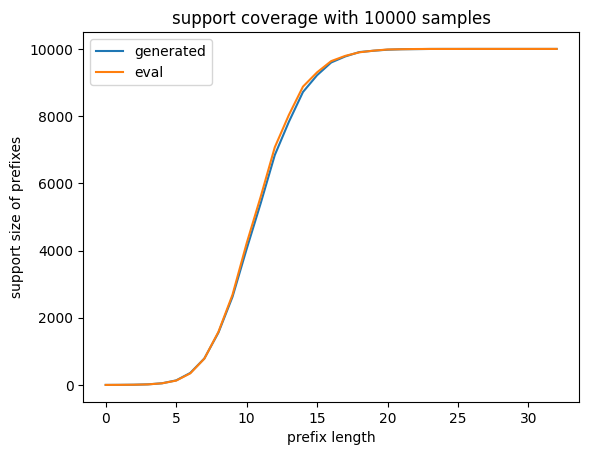

In [ ]:
import matplotlib.pyplot as plt

for num_samples in [10, 100, 1000, 10000]:
    plt.figure()
    plt.plot(range(length+1), all_support_size_generated[num_samples], label='generated')
    plt.plot(range(length+1), all_support_size_eval[num_samples], label='eval')
    # plt.plot(range(length+1), support_size_train, label='train')
    plt.legend()
    plt.xlabel('prefix length')
    plt.ylabel('support size of prefixes')
    plt.title(f'support coverage with {num_samples} samples')

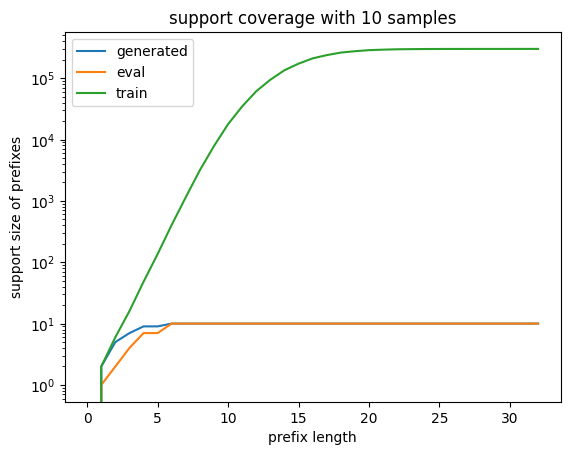

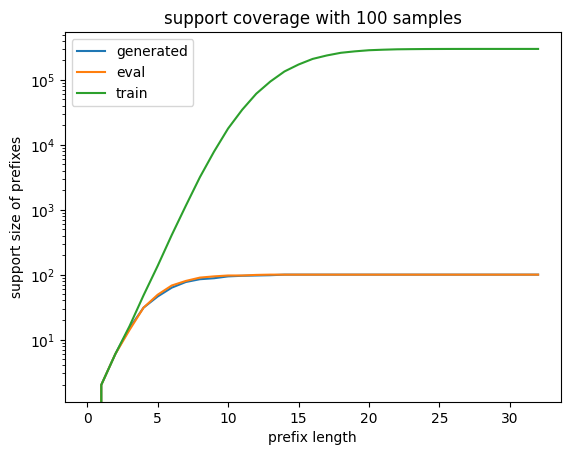

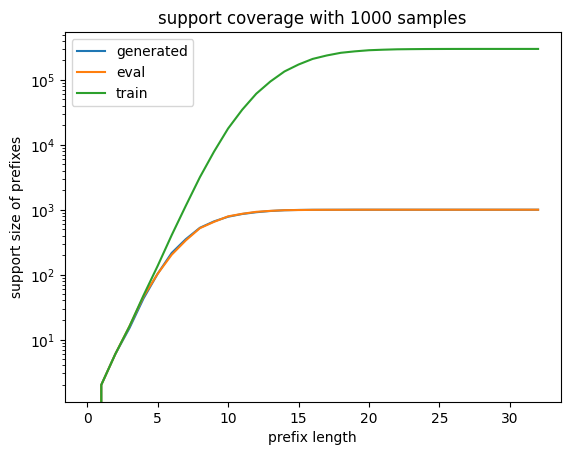

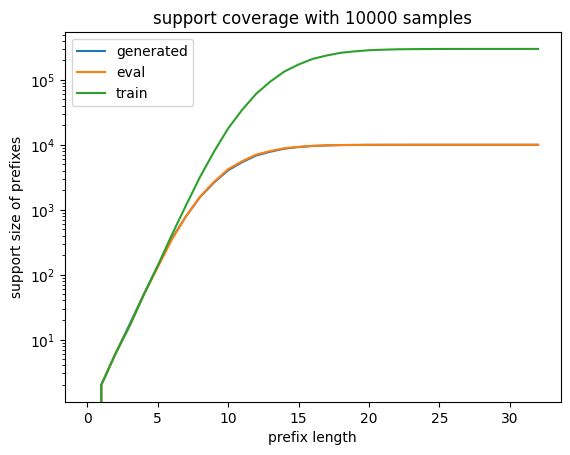

In [ ]:
for num_samples in [10, 100, 1000, 10000]:
    plt.figure()
    plt.plot(range(length+1), all_support_size_generated[num_samples], label='generated')
    plt.plot(range(length+1), all_support_size_eval[num_samples], label='eval')
    plt.plot(range(length+1), support_size_train, label='train')
    plt.legend()
    plt.xlabel('prefix length')
    plt.ylabel('support size of prefixes')
    plt.yscale('log')
    plt.title(f'support coverage with {num_samples} samples')

### Check for new sequences

In [ ]:
dyck_eval.accept_prefix(tuple(ds_generated[0]['tokens'].tolist())[:4])

True

In [ ]:
ds_generated[0]['tokens'][0]

tensor(4)

In [ ]:
for i in range(1):  # len(ds_generated)
    seq = ds_generated[i]['tokens'][1:-1].tolist()
    seq_with_bos = [4] + seq
    for prefix_len in range(1, length + 1):
        # print(dyck_eval.accept_prefix(seq_with_bos))

        if dyck_eval.accept_prefix(seq_with_bos[:prefix_len+1]) and tuple(seq[:prefix_len]) not in support_train[prefix_len]:
            print(tuple(seq[:prefix_len]))
            print(dyck_eval.detokenize(seq[:prefix_len]))


(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1)
[[]][[]][[]]([][][
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3)
[[]][[]][[]]([][][]
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2)
[[]][[]][[]]([][][])
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0)
[[]][[]][[]]([][][])(
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2)
[[]][[]][[]]([][][])()
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1)
[[]][[]][[]]([][][])()[
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1)
[[]][[]][[]]([][][])()[[
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1, 1)
[[]][[]][[]]([][][])()[[[
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1, 1, 1)
[[]][[]][[]]([][][])()[[[[
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1, 1, 1, 1)
[[]][[]][[]]([][][])()[[[[[
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 3, 2, 0, 2, 1, 1, 1, 1, 1

In [ ]:
(1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1)
(1, 3, 0, 2, 1, 1, 0, 1, 3, 2, 3, 1, 3, 1, 0, 1, 3, 2)

In [ ]:
total_cnt = 0
new_cnt = 0
prefix_total_cnt = defaultdict(int)
prefix_new_cnt = defaultdict(int)

for i in range(len(ds_generated)):
    seq = ds_generated[i]['tokens'][1:-1].tolist()
    seq_with_bos = [4] + seq
    for prefix_len in range(1, length + 1):
        total_cnt += 1
        prefix_total_cnt[prefix_len] += 1

        # print(dyck_eval.accept_prefix(seq_with_bos))
        if dyck_eval.accept_prefix(seq_with_bos[:prefix_len+1]) and tuple(seq[:prefix_len]) not in support_train[prefix_len]:
            # print(dyck_eval.detokenize(seq[:prefix_len]))
            new_cnt += 1
            prefix_new_cnt[prefix_len] += 1
        if not dyck_eval.accept_prefix(seq_with_bos[:prefix_len+1]):
            print(dyck_eval.detokenize(seq[:prefix_len]))

print('total_cnt', total_cnt)
print('new_cnt', new_cnt)
print('new_cnt / total_cnt', new_cnt / total_cnt)

([][[](([([[]([])()[[]())
([][[](([([[]([])()[[]())]
([][[](([([[]([])()[[]())])
([][[](([([[]([])()[[]())])]
([][[](([([[]([])()[[]())])])
([][[](([([[]([])()[[]())])])]
([][[](([([[]([])()[[]())])])]]
([][[](([([[]([])()[[]())])])]])
[()[[][[[[()[][[]]([][]]
[()[[][[[[()[][[]]([][]](
[()[[][[[[()[][[]]([][]]()
[()[[][[[[()[][[]]([][]]()]
[()[[][[[[()[][[]]([][]]()])
[()[[][[[[()[][[]]([][]]()])]
[()[[][[[[()[][[]]([][]]()])]]
[()[[][[[[()[][[]]([][]]()])]]]
[()[[][[[[()[][[]]([][]]()])]]]]
[][]]
[][]](
[][]]()
[][]]()[
[][]]()[[
[][]]()[[[
[][]]()[[[]
[][]]()[[[]]
[][]]()[[[]](
[][]]()[[[]]([
[][]]()[[[]]([(
[][]]()[[[]]([()
[][]]()[[[]]([()[
[][]]()[[[]]([()[]
[][]]()[[[]]([()[][
[][]]()[[[]]([()[][]
[][]]()[[[]]([()[][](
[][]]()[[[]]([()[][]()
[][]]()[[[]]([()[][]()]
[][]]()[[[]]([()[][]()][
[][]]()[[[]]([()[][]()][]
[][]]()[[[]]([()[][]()][][
[][]]()[[[]]([()[][]()][][(
[][]]()[[[]]([()[][]()][][([
[][]]()[[[]]([()[][]()][][([]
[][]]()[[[]]([()[][]()][][([])
[][]]()[[[]]([()[][]()

In [ ]:
new_probs = [
    prefix_new_cnt[prefix_len] / prefix_total_cnt[prefix_len]
    for prefix_len in range(1, length + 1)
]
new_probs

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0004,
 0.0011,
 0.004,
 0.0141,
 0.0422,
 0.0911,
 0.1741,
 0.2885,
 0.4171,
 0.5561,
 0.6771,
 0.7854,
 0.8582,
 0.9196,
 0.9491,
 0.9737,
 0.9844,
 0.9916,
 0.9945,
 0.9966,
 0.9975,
 0.9978,
 0.9979,
 0.9979,
 0.9979,
 0.9979]

Text(0.5, 1.0, 'fraction of new prefixes not in training set')

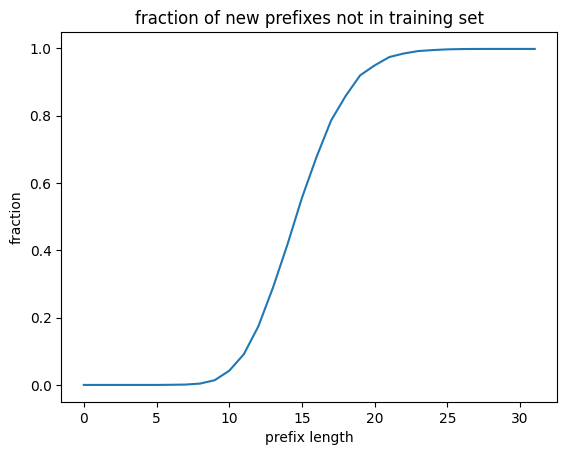

In [ ]:
plt.figure()
plt.plot(range(length), new_probs)
plt.xlabel('prefix length')
plt.ylabel('fraction')
plt.title('fraction of new prefixes not in training set')

In [ ]:
support_train[18]

{(1, 3, 0, 2, 1, 1, 0, 1, 3, 2, 3, 1, 3, 1, 0, 1, 3, 2),
 (1, 3, 1, 1, 3, 1, 3, 3, 1, 3, 1, 3, 1, 3, 0, 0, 1, 1),
 (1, 1, 3, 3, 1, 3, 1, 3, 1, 3, 1, 1, 0, 2, 1, 3, 1, 3),
 (1, 3, 1, 1, 1, 3, 0, 1, 1, 3, 1, 3, 1, 3, 3, 1, 0, 1),
 (1, 0, 2, 3, 1, 1, 3, 3, 1, 0, 1, 1, 3, 1, 3, 3, 2, 1),
 (1, 1, 1, 3, 1, 3, 1, 3, 1, 3, 1, 3, 3, 3, 1, 3, 0, 2),
 (0, 0, 1, 3, 2, 2, 1, 0, 1, 3, 2, 3, 1, 3, 1, 1, 1, 1),
 (1, 0, 2, 3, 1, 1, 3, 1, 3, 1, 1, 1, 3, 3, 3, 3, 1, 1),
 (1, 1, 3, 1, 3, 0, 0, 2, 2, 3, 1, 3, 1, 3, 0, 2, 1, 0),
 (1, 3, 1, 3, 1, 1, 0, 1, 1, 3, 3, 2, 0, 2, 1, 3, 3, 1),
 (1, 0, 1, 3, 2, 3, 0, 2, 0, 1, 1, 3, 3, 2, 1, 3, 1, 3),
 (1, 3, 1, 3, 1, 0, 2, 1, 0, 1, 1, 1, 3, 1, 1, 1, 1, 3),
 (1, 3, 0, 1, 0, 0, 0, 0, 2, 1, 3, 2, 2, 2, 3, 2, 1, 3),
 (1, 3, 1, 1, 1, 1, 3, 0, 1, 3, 1, 3, 1, 3, 2, 1, 0, 2),
 (1, 1, 3, 0, 2, 0, 1, 1, 3, 3, 2, 3, 0, 1, 3, 1, 1, 0),
 (1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 3, 1),
 (1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 3, 0, 2, 3, 3, 1, 3),
 (1, 3, 1, 1, 3, 3, 1, 3, 1, 1,

In [ ]:
len('[[]][[]][[]]([][][')

18